In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import re
import utils
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")

import logging
from prophet import Prophet
from datetime import datetime, time, timedelta
from multiprocessing import cpu_count, Pool
import pycountry

## Upload all Data

In [2]:
dataT = pd.read_csv(r'/Users/edgartome_1/IronHack/IronProjects/Final_project/Original_Data_Code/extract.csv')
dataT.head()

,city,type,provider,ts,nb_trip,rain,snow,main,time_lost,before_lag,nb_vehic_avail
0,aarhus,CAR,32,2021-05-11T10:00:00Z,7,NaN,NaN,NaN,0.0,0,88.0
1,aarhus,CAR,32,2021-05-11T11:00:00Z,15,NaN,NaN,NaN,0.0,0,88.0
2,aarhus,CAR,32,2021-05-11T12:00:00Z,25,NaN,NaN,NaN,0.0,0,88.0
3,aarhus,CAR,32,2021-05-11T13:00:00Z,16,NaN,NaN,NaN,0.0,0,88.0
4,aarhus,CAR,32,2021-05-11T14:00:00Z,16,NaN,NaN,NaN,0.0,0,88.0


In [3]:
dataT.columns

Index(['city', 'type', 'provider', 'ts', 'nb_trip', 'rain', 'snow', 'main',
       'time_lost', 'before_lag', 'nb_vehic_avail'],
      dtype='object')

In [4]:
#How many citys

print('Name of the citys', dataT.city.unique())
print('Number of citys', dataT.city.nunique())

Name of the citys ['aarhus' 'amsterdam' 'antwerp' 'barcelona' 'bari' 'berlin' 'bilbao'
 'bonn' 'bordeaux' 'bratislava' 'bremen' 'bristol' 'bruxelles' 'budapest'
 'delft' 'dortmund' 'dublin' 'dusseldorf' 'eindhoven' 'enschede' 'essen'
 'frankfurt' 'gdansk' 'geneva' 'gothenburg' 'haarlem' 'hamburg' 'hanover'
 'heilbronn' 'helsingborg' 'helsinki' 'istanbul' 'karlsruhe' 'koln'
 'leipzig' 'lisbon' 'ljubljana' 'london' 'lubeck' 'lund' 'lyon' 'madrid'
 'malmo' 'milano' 'modena' 'munchen' 'munster' 'nice' 'norrkoping'
 'nuremberg' 'odense' 'orebro' 'oslo' 'paris' 'pisa' 'potsdam' 'prague'
 'reggio_emilia' 'riga' 'rome' 'rotterdam' 'seville' 'stockholm' 'tallinn'
 'the_hague' 'tilburg' 'torino' 'trondheim' 'vilnius' 'warsaw'
 'washington' 'wien' 'winterthur' 'zurich' 'zwolle']
Number of citys 75


In [5]:
#How many types sharing

print('Name of types sharing', dataT.type.unique())
print('Number of types sharing', dataT.type.nunique())

Name of types sharing ['CAR' 'BIKE' 'MOTORSCOOTER' 'SCOOTER']
Number of types sharing 4


In [6]:
#How many types of providers

print('Name of the provider', dataT.provider.unique())
print('Number of provider', dataT.provider.nunique())

Name of the provider [32  7 41 42 21 35 47 51  6 44 23 22 53 30 26 25 37 10 46 20 34 39 45 19
 14  5  8  9 24 36 27 16 31 13  3 12 15 17 38  4 40 49 18  1 52 11  2 28
 48 29 43 50 33]
Number of provider 53


In [7]:
#Transform time that was in object to date time type
dataT['ts'] = pd.to_datetime(dataT['ts'], format='%Y/%m/%d %H:%M:%S')

In [8]:
#Fuction to remove time zone

def time_n_zone(data):
    data['ts'] = data['ts'].astype(str)
    ogdata = list(data['ts'])
    newtime = []
    for time in ogdata:
        time = time[:-6]
        newtime.append(time)
    data['ts'] = newtime
    data['ts'] = data['ts'].apply(pd.to_datetime)

In [9]:
#Select data by city, type and provider. Change column names of ds to ts and nb_vehic_avail to y

def subsetDataFrame(city, type_s, provider_num):
    DataFrame = dataT[(dataT['city'] == city) & (dataT['type'] == type_s) & (dataT['provider'] == provider_num)]
    #del DataFrame['Unnamed: 0']
    time_n_zone(DataFrame)
    DataFrame.rename(columns = {'ts':'ds', 'nb_trip':'y'}, inplace = True)
    DataFrame = DataFrame.drop(['city', 'type', 'provider'], axis=1)
    le = LabelEncoder()
    DataFrame['main'] = le.fit_transform(DataFrame.main.values)
    return DataFrame

### Define new data for city, type of sharing and provider

In [10]:
data = subsetDataFrame('paris', 'SCOOTER', 46)
data

,ds,y,rain,snow,main,time_lost,before_lag,nb_vehic_avail
706049,2020-11-20 00:00:00,28,0.93,0.0,6,0.0,0,4095.0
706050,2020-11-20 01:00:00,15,0.25,0.0,6,0.0,0,4095.0
706051,2020-11-20 02:00:00,17,0.50,0.0,6,0.0,0,4095.0
706052,2020-11-20 03:00:00,12,0.00,0.0,0,0.0,0,4095.0
706053,2020-11-20 04:00:00,6,0.00,0.0,6,0.0,0,4095.0
...,...,...,...,...,...,...,...,...
720210,2022-07-03 01:00:00,0,0.00,0.0,0,0.0,0,NaN
720211,2022-07-03 02:00:00,0,0.00,0.0,0,0.0,0,NaN
720212,2022-07-03 03:00:00,0,0.00,0.0,0,0.0,0,NaN
720213,2022-07-03 04:00:00,0,0.00,0.0,0,0.0,0,NaN


### EDA of Data

In [11]:
# Any missing data to remove, our fill
data.isnull().sum()

ds                 0
y                  0
rain               2
snow               2
main               0
time_lost          0
before_lag         0
nb_vehic_avail    30
dtype: int64

In [12]:
#Fill missing values with near values
for col in ['rain','snow','main','nb_vehic_avail']:
        data[col] = data[col].ffill()
        data[col] = data[col].bfill()

In [13]:
#Check
data.isnull().sum()

ds                0
y                 0
rain              0
snow              0
main              0
time_lost         0
before_lag        0
nb_vehic_avail    0
dtype: int64

In [14]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14166 entries, 706049 to 720214
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   ds              14166 non-null  datetime64[ns]
 1   y               14166 non-null  int64         
 2   rain            14166 non-null  float64       
 3   snow            14166 non-null  float64       
 4   main            14166 non-null  int64         
 5   time_lost       14166 non-null  float64       
 6   before_lag      14166 non-null  int64         
 7   nb_vehic_avail  14166 non-null  float64       
dtypes: datetime64[ns](1), float64(4), int64(3)
memory usage: 996.0 KB


In [15]:
data.head()

,ds,y,rain,snow,main,time_lost,before_lag,nb_vehic_avail
706049,2020-11-20 00:00:00,28,0.93,0.0,6,0.0,0,4095.0
706050,2020-11-20 01:00:00,15,0.25,0.0,6,0.0,0,4095.0
706051,2020-11-20 02:00:00,17,0.50,0.0,6,0.0,0,4095.0
706052,2020-11-20 03:00:00,12,0.00,0.0,0,0.0,0,4095.0
706053,2020-11-20 04:00:00,6,0.00,0.0,6,0.0,0,4095.0


In [16]:
#What does each column mean?
data.describe().T

,count,mean,std,min,25%,50%,75%,max
y,14166.0,408.223775,341.916880,0.0,110.0,336.0,620.0,3403.000000
rain,14166.0,0.060325,0.367055,0.0,0.0,0.0,0.0,28.030000
snow,14166.0,0.001563,0.033885,0.0,0.0,0.0,0.0,3.000000
main,14166.0,1.266907,1.953209,0.0,0.0,1.0,1.0,9.000000
time_lost,14166.0,0.014699,0.100529,0.0,0.0,0.0,0.0,1.251001
before_lag,14166.0,0.014118,0.253068,0.0,0.0,0.0,0.0,20.000000
nb_vehic_avail,14166.0,4809.647607,195.928468,4095.0,4662.0,4868.0,4955.0,5347.000000


In [17]:
#Quantitie of outliers
numcol = list(data.describe().columns)

for x in numcol:
    Q3 = data[x].quantile(0.75)
    Q1= data[x].quantile(0.25)
    IQR = Q3 - Q1
    filters = data[data[x]>Q3 + 1.5*IQR]
    print('Column', x)
    print('Number of outliers', len(filters))
    print('Percentage of outliers', "{:.1f}".format((len(filters)/len(data[x]))*100))
    print('\n')

Column y
Number of outliers 157
Percentage of outliers 1.1


Column rain
Number of outliers 1628
Percentage of outliers 11.5


Column snow
Number of outliers 59
Percentage of outliers 0.4


Column main
Number of outliers 2319
Percentage of outliers 16.4


Column time_lost
Number of outliers 420
Percentage of outliers 3.0


Column before_lag
Number of outliers 104
Percentage of outliers 0.7


Column nb_vehic_avail
Number of outliers 0
Percentage of outliers 0.0




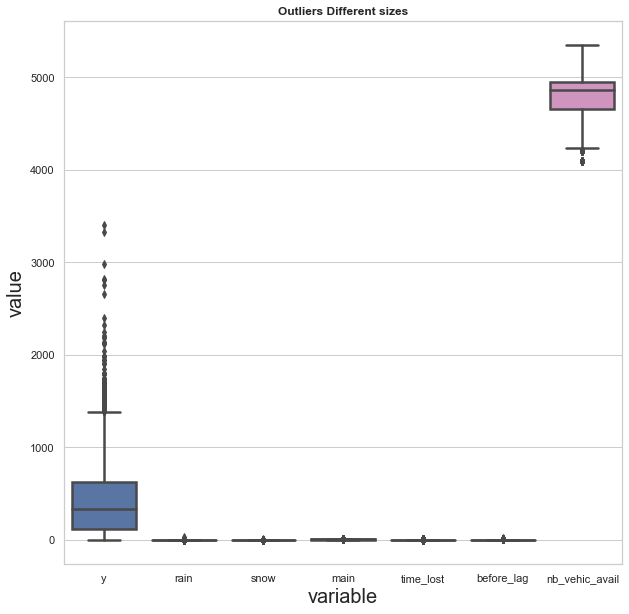

In [18]:
fig = plt.figure(figsize=(10,10))

sns.set_theme(style="whitegrid")

plt.title('Outliers Different sizes', fontweight='bold')

plt.xlabel("variable", fontsize = 20)
plt.ylabel("value", fontsize = 20)

sns.boxplot(data=data, linewidth=2.5)

plt.show()

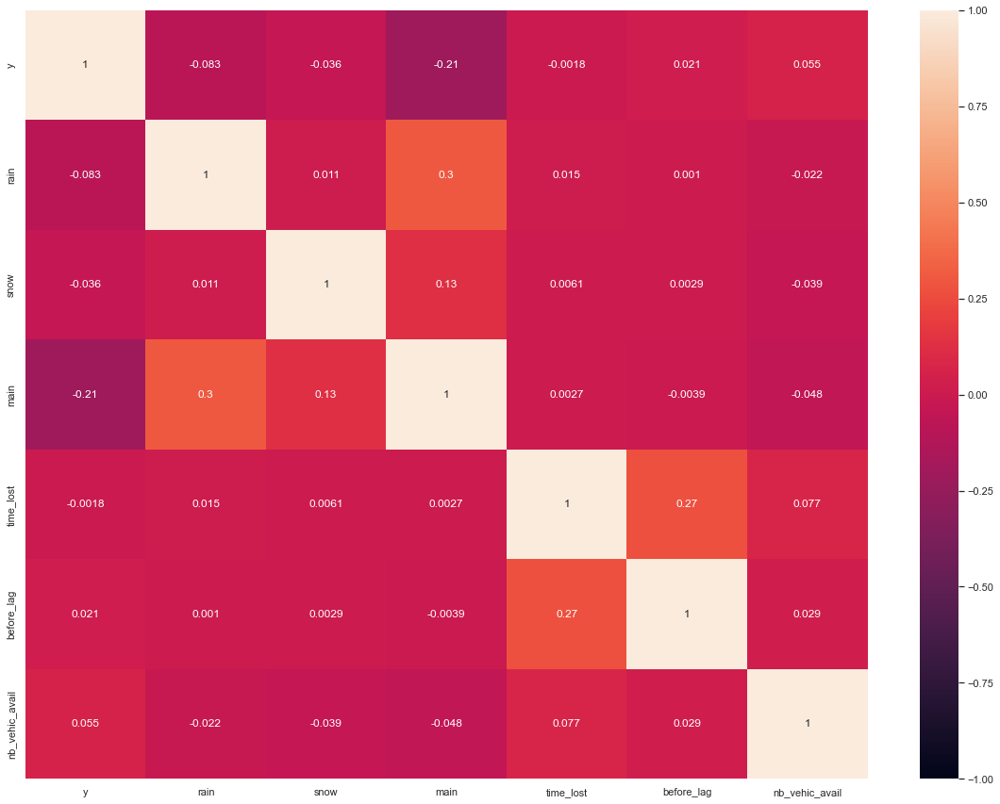

In [19]:
# Column collinearity - any high correlations?

plt.figure(figsize=(20, 15))

heatmap = sns.heatmap(data.corr(), vmin=-1, vmax=1, annot=True)

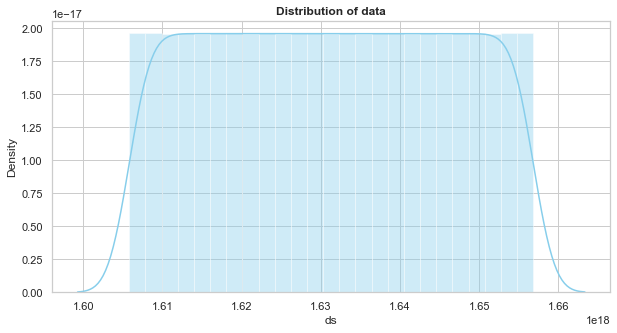

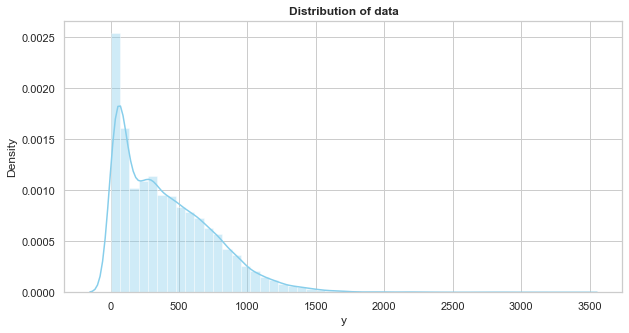

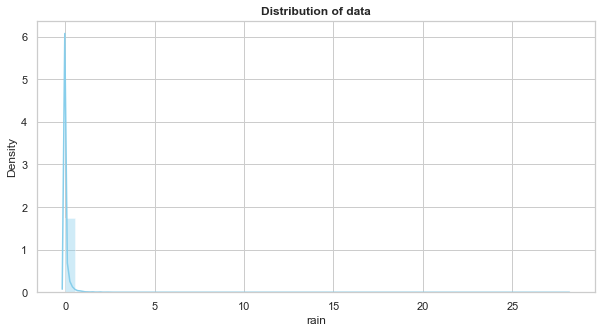

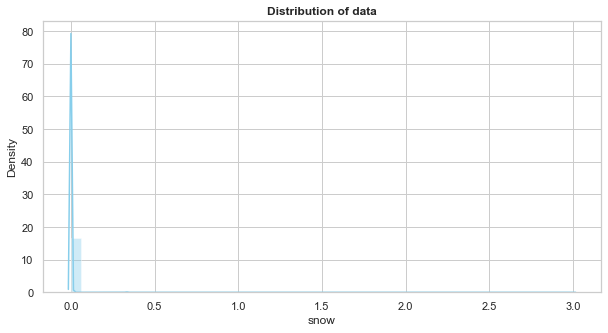

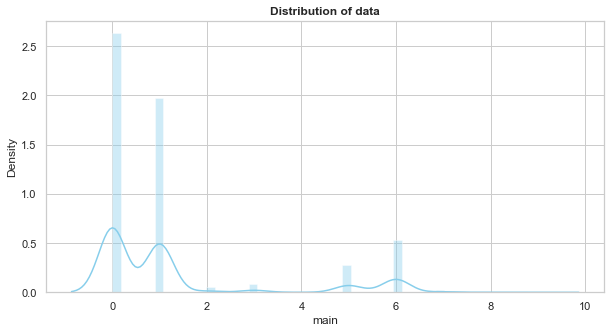

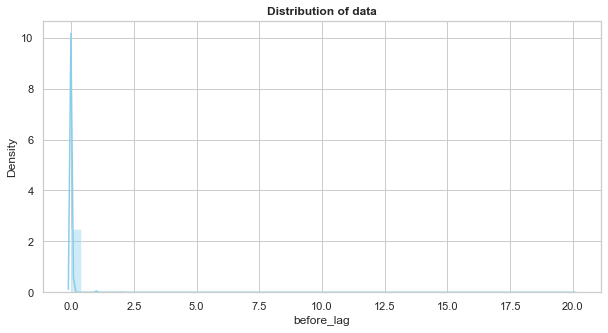

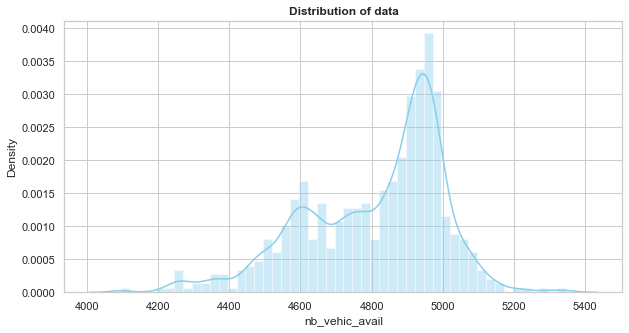

In [20]:
#Plot distribution of data of columns with numerical values
colum = ['ds','y', 'rain', 'snow', 'main', 'before_lag', 'nb_vehic_avail']
#colum = ['y', 'rain', 'snow', 'main', 'before_lag', 'nb_vehic_avail']
for col in colum:
    f, axes = plt.subplots(figsize=(10, 5), sharex=True)
    plt.title('Distribution of data', fontweight='bold')
    sns.distplot(data[col],hist=True, color="skyblue")
    plt.xlabel(col)
    plt.show()

In [21]:
data.to_csv(r'/Users/edgartome_1/IronHack/IronProjects/Final_project/Data clean/clean_data_france_paris_scooter.csv')

## Apply model Prophet

In [22]:
x = len(data) - len(data)*0.8
x

2833.199999999999

In [23]:
#Train data set
data_train = data[:-2833]
data_train


,ds,y,rain,snow,main,time_lost,before_lag,nb_vehic_avail
706049,2020-11-20 00:00:00,28,0.93,0.0,6,0.0,0,4095.0
706050,2020-11-20 01:00:00,15,0.25,0.0,6,0.0,0,4095.0
706051,2020-11-20 02:00:00,17,0.50,0.0,6,0.0,0,4095.0
706052,2020-11-20 03:00:00,12,0.00,0.0,0,0.0,0,4095.0
706053,2020-11-20 04:00:00,6,0.00,0.0,6,0.0,0,4095.0
...,...,...,...,...,...,...,...,...
717377,2022-03-07 00:00:00,0,0.00,0.0,0,1.0,0,4959.0
717378,2022-03-07 01:00:00,0,0.00,0.0,0,1.0,0,4959.0
717379,2022-03-07 02:00:00,0,0.00,0.0,0,1.0,0,4959.0
717380,2022-03-07 03:00:00,0,0.00,0.0,0,1.0,0,4959.0


In [24]:
#Test data set
data_test = data[-2833:]
data_test

,ds,y,rain,snow,main,time_lost,before_lag,nb_vehic_avail
717382,2022-03-07 05:00:00,0,0.0,0.0,0,1.0,0,4959.0
717383,2022-03-07 06:00:00,0,0.0,0.0,0,1.0,0,4959.0
717384,2022-03-07 07:00:00,0,0.0,0.0,0,1.0,0,4959.0
717385,2022-03-07 08:00:00,0,0.0,0.0,0,1.0,0,4959.0
717386,2022-03-07 09:00:00,0,0.0,0.0,0,1.0,0,4959.0
...,...,...,...,...,...,...,...,...
720210,2022-07-03 01:00:00,0,0.0,0.0,0,0.0,0,4882.0
720211,2022-07-03 02:00:00,0,0.0,0.0,0,0.0,0,4882.0
720212,2022-07-03 03:00:00,0,0.0,0.0,0,0.0,0,4882.0
720213,2022-07-03 04:00:00,0,0.0,0.0,0,0.0,0,4882.0


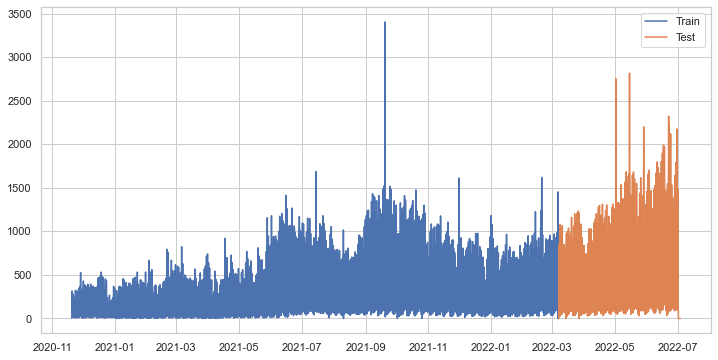

In [25]:
from matplotlib.pylab import rcParams

rcParams['figure.figsize']=12,6

#plotting the data
plt.plot(data_train['ds'],data_train['y'], label='Train')
plt.plot(data_test['ds'],data_test['y'], label='Test')
plt.legend()

In [26]:
#Aplly model

def fit_model(DATA, COUNTRY):
    m = Prophet(seasonality_mode='multiplicative', yearly_seasonality = True, changepoint_range=0.95)

    # GET COUNTRY CODE AND ADD PROPHET HOLIDAYS

    #COUNTRY = 'DENMARK'
    country_info = pycountry.countries.get(name=COUNTRY.replace("_"," ")) or pycountry.countries.get(official_name=COUNTRY.replace("_"," ")) or pycountry.countries.get(alpha_3=COUNTRY)
    m.add_country_holidays(country_name=country_info.alpha_2)
    
    
    # ADD REGRESSORS

    for reg in [e for e in list(DATA.columns) if e not in ('ds','y')]:
        m.add_regressor(reg)


    m.fit(DATA)
    return m

In [27]:
m = fit_model(data_train, 'FRANCE')

Initial log joint probability = -100.899
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30249.8     0.0081011       2352.75           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       30352.4     0.0245991       5151.24           1           1      247   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       30394.9    0.00150621       420.029           1           1      363   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       30404.8    0.00156795       701.116           1           1      477   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       30412.2    0.00254438       768.025           1           1      603   
    Iter      log prob        ||dx||      ||grad||       alpha  

In [28]:
#To use forecast = m.predict(future), have to add future values of (rain,snow,main,time_lost,before_lag,nb_vehic_avail)
#Our use the model wihtout the regressoers for (rain,snow,main,time_lost,before_lag,nb_vehic_avail)

forecast = m.predict(data_test)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
2828,2022-07-03 01:00:00,495.781166,103.589711,897.697752
2829,2022-07-03 02:00:00,374.761700,57.001737,699.693603
2830,2022-07-03 03:00:00,222.940682,-30.439903,456.947588
2831,2022-07-03 04:00:00,117.264050,-75.310661,337.704554
2832,2022-07-03 05:00:00,118.043332,-67.966852,320.632041


In [29]:
forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,Armistice 1918,Armistice 1918_lower,Armistice 1918_upper,Armistice 1945,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat
0,2022-03-07 05:00:00,433.135763,-426.543048,-54.928564,433.135763,433.135763,0.0,0.0,0.0,0.0,...,-0.144279,-0.144279,-0.144279,0.041869,0.041869,0.041869,0.0,0.0,0.0,-242.299420
1,2022-03-07 06:00:00,433.183094,-331.381522,23.820886,433.183094,433.183094,0.0,0.0,0.0,0.0,...,-0.141603,-0.141603,-0.141603,0.041672,0.041672,0.041672,0.0,0.0,0.0,-155.468626
2,2022-03-07 07:00:00,433.230425,-210.037469,156.448116,433.230425,433.230425,0.0,0.0,0.0,0.0,...,-0.138497,-0.138497,-0.138497,0.041476,0.041476,0.041476,0.0,0.0,0.0,-30.133253
3,2022-03-07 08:00:00,433.277756,-99.991309,250.145770,433.277756,433.277756,0.0,0.0,0.0,0.0,...,-0.135002,-0.135002,-0.135002,0.041279,0.041279,0.041279,0.0,0.0,0.0,82.697551
4,2022-03-07 09:00:00,433.325087,-23.842048,334.720933,433.325087,433.325087,0.0,0.0,0.0,0.0,...,-0.131160,-0.131160,-0.131160,0.041082,0.041082,0.041082,0.0,0.0,0.0,156.500561
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2828,2022-07-03 01:00:00,566.987357,103.589711,897.697752,173.677480,985.270264,0.0,0.0,0.0,0.0,...,0.003337,0.003337,0.003337,0.119959,0.119959,0.119959,0.0,0.0,0.0,495.781166
2829,2022-07-03 02:00:00,567.034688,57.001737,699.693603,173.401531,985.535340,0.0,0.0,0.0,0.0,...,-0.006815,-0.006815,-0.006815,0.120227,0.120227,0.120227,0.0,0.0,0.0,374.761700
2830,2022-07-03 03:00:00,567.082019,-30.439903,456.947588,173.125581,985.800416,0.0,0.0,0.0,0.0,...,-0.017000,-0.017000,-0.017000,0.120499,0.120499,0.120499,0.0,0.0,0.0,222.940682
2831,2022-07-03 04:00:00,567.129349,-75.310661,337.704554,172.849632,986.065491,0.0,0.0,0.0,0.0,...,-0.027159,-0.027159,-0.027159,0.120773,0.120773,0.120773,0.0,0.0,0.0,117.264050


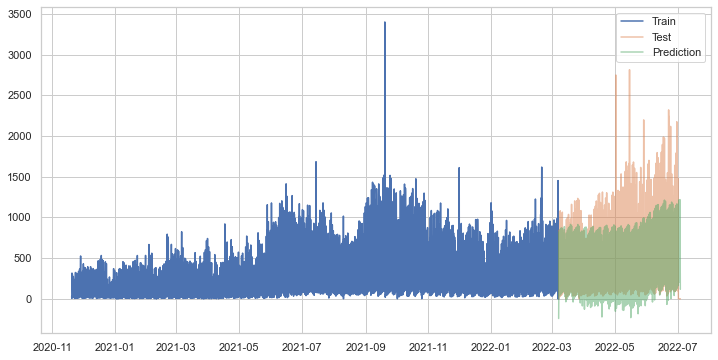

In [30]:
#Plot the train and test data on top the forecast
plt.plot(data_train.set_index('ds')['y'], label='Train')
plt.plot(data_test.set_index('ds')['y'], label='Test',alpha=0.5)
plt.plot(forecast.set_index('ds')['yhat'], label='Prediction',alpha=0.5)
plt.legend()

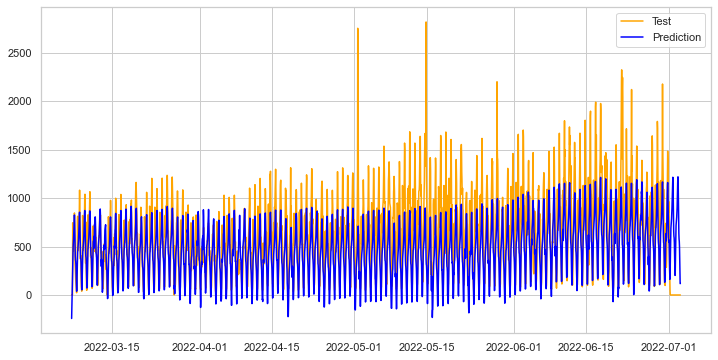

In [31]:
#Plot data test and prediction
fig, ax = plt.subplots()
plt.plot(data_test.set_index('ds')['y'], label='Test',color='orange')
plt.plot(forecast.set_index('ds')['yhat'], label='Prediction',color='blue')
plt.legend()

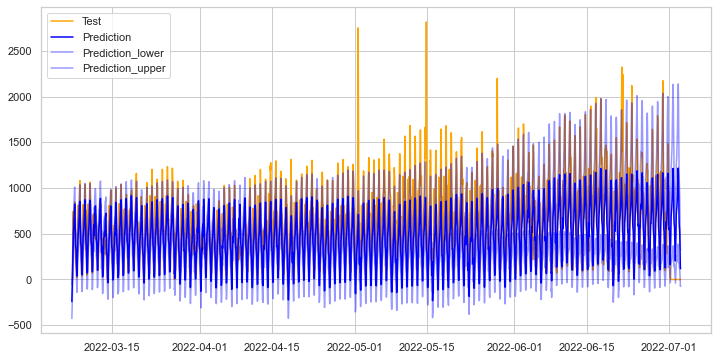

In [32]:
#Plot data test and prediction
fig, ax = plt.subplots()
plt.plot(data_test.set_index('ds')['y'], label='Test',color='orange')
plt.plot(forecast.set_index('ds')['yhat'], label='Prediction',color='blue')
lower=plt.plot(forecast.set_index('ds')['yhat_lower'], label='Prediction_lower',alpha=0.4,color='blue')
upper=plt.plot(forecast.set_index('ds')['yhat_upper'], label='Prediction_upper',alpha=0.4,color='blue')
plt.legend()

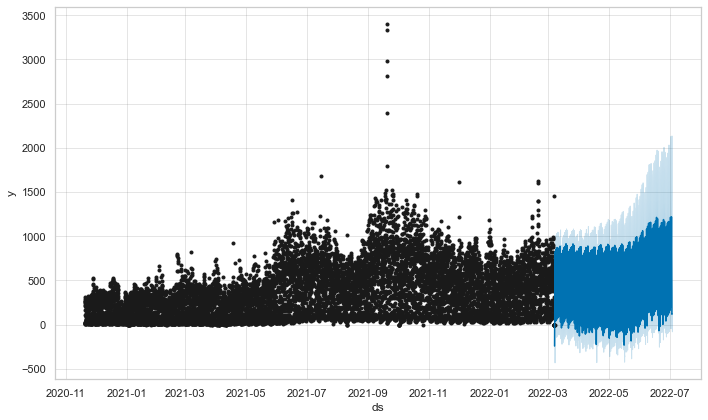

In [33]:
fig1 = m.plot(forecast)

In [34]:
from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(m, forecast)

In [35]:
plot_components_plotly(m, forecast)

## Test model - Cross validation

In [36]:
len(data_test['y'])


2833

In [37]:
len(forecast['yhat'])

2833

In [38]:
#calculate Root Mean Square  Error(RMSE)
from math import sqrt
from sklearn.metrics import mean_squared_error

rms = sqrt(mean_squared_error(data_test['y'],forecast['yhat']))

print('The root mean square error score for the model is: ', rms)

The root mean square error score for the model is:  314.94078247575345


In [39]:
#calculate Mean Absolute Error(MAE)
from math import sqrt
from sklearn.metrics import mean_squared_error

mae = mean_squared_error(data_test['y'],forecast['yhat'])

print('The mean absolute error score for the model is: ', mae)

The mean absolute error score for the model is:  99187.69646643984


In [40]:
#Coefficient of Determination or R^2
from sklearn.metrics import r2_score

r2 = r2_score(data_test['y'],forecast['yhat'])

print('The coefficient of determination of r2 score for the model is: ', r2)

The coefficient of determination of r2 score for the model is:  0.436339817344788


In [41]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_absolute_percentage_error

y_true = data_test['y'].values
y_pred = forecast['yhat'].values

mae_01 = mean_absolute_error(y_true, y_pred)
mape_01 = mean_absolute_percentage_error(y_true, y_pred)

print('The mean absolute error for the model is: ', mae_01)
print('\n')
print('The mean absolute percentage error for the model is: ', mape_01)

The mean absolute error for the model is:  229.93832733560873


The mean absolute percentage error for the model is:  5.499061017434177e+16


In [42]:
days_train = data['ds'].iloc[11333] - data['ds'].iloc[0]
days_train

Timedelta('472 days 05:00:00')

In [43]:
days_test = data['ds'].iloc[11333] - data['ds'].iloc[2833]
days_test

Timedelta('354 days 04:00:00')

In [44]:
total_days = days_train + days_test
total_days

Timedelta('826 days 09:00:00')

In [45]:
import warnings
warnings.filterwarnings("ignore")

In [46]:
# Cross validation
#Train on the first 200 days, aply to next 5 days and loop each 5 days to reach final data
from prophet.diagnostics import cross_validation

df_cv = cross_validation(m, initial='200 days', period='5 days', horizon = '20 days', parallel="processes")

INFO:prophet:Making 51 forecasts with cutoffs between 2021-06-10 04:00:00 and 2022-02-15 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b0ada970>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -109.591
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -100.845
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -115.636
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -93.1296
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.2265
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -77.708
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -77.1017
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -103.77
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       10435.3    0.00899348       298.082           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       11195.2    0.00459972       187.954      0.9668      0.9668      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         11419      0.011149       696.355       0.159       0.159      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       10359.6     0.0159907       801.989           1    

     599         10470    0.00431974       857.822        0.82        0.82      812   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599         11642    0.00569054       338.527           1           1      706   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       11364.4    0.00157376       120.202           1           1      726   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       11239.7    0.00420603       295.179           1           1      837   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     605         11275   4.06769e-05       147.558   1.684e-07       0.001      786  LS failed, Hessian reset 
     599       11464.1    0.00305402       162.624      0.5352      0.5352      775   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

    1199       11253.7    0.00134469       302.638      0.2885           1     1495   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       11371.1    0.00174525       91.1626       0.378           1     1394   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       11646.7   0.000812965       520.117     0.09277           1     1401   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       10406.8   0.000963294       177.338      0.8814      0.8814     1614   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       11285.3   0.000562198       195.325           1           1     1549   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       11478.5   0.000724437       298.724      0.1773           1     1457   
    Iter      log 

    1499       11479.9   1.53751e-05        55.523      0.1104      0.1104     2063   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1395       12643.9   1.26357e-05       119.443   6.391e-08       0.001     1936  LS failed, Hessian reset 
    1399       12644.2    0.00133056       93.7152           1           1     1942   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599       11654.3   0.000110142       59.7351      0.2415           1     2059   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1684       10423.3   1.28162e-05       130.932   8.286e-08       0.001     2383  LS failed, Hessian reset 
    1709       10481.8   0.000190573       193.196   2.945e-06       0.001     2351  LS failed, Hessian reset 
    1699       10423.6   0.000186429       85.0134      0.4848      0.4848     2408   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1899       10425.6     0.0171358       274.948           1           1     2670   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1899       11288.8   0.000334713       86.6589           1           1     2503   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599         12646    0.00325535       202.012        4.48      0.9764     2205   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1899         10482   5.34792e-05       66.0437      0.2389      0.2389     2666   
    1899         11386    0.00116425       179.029           1           1     2436   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1634       12646.3   0.000312822       506.921   4.127e-06       0.001     2282  LS failed, Hessian reset 
    1797       11655.4   1.06911e-05       92.6273   1.082e-07       0.001     2399  LS failed, Hessian reset 
    1799       11655.4   7.76447e-05        63.247           1           1     2402   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1799         11481   3.02993e-05       62.8149           1           1     2444   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1999       10429.4   0.000351155       444.059     0.06668

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    2199       10490.3   0.000519781       382.821           1           1     3043   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2199       11291.5   0.000291031       156.663      0.7279      0.7279     2932   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2199         10431    0.00146689        281.47           1           1     3119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1899       12646.7   2.49969e-05        73.397      0.4182      0.4182     2664   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2099       11656.5   5.91512e-05       81.2775      0.1769           1     2764   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2099       11489.9       0.01732       708.844           1           1     2810   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    2399       10438.6   0.000668582       264.119      0.7861      0.1736     3388   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2395       10494.1   2.30053e-05       218.476   2.287e-07       0.001     3345  LS failed, Hessian reset 
    2399       10494.4    0.00451898       140.971           1           1     3350   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2399       11292.2   3.66402e-05       124.024      0.5179      0.5179     3218   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2248       11656.8   4.89782e-06        43.306   7.836e-08       0.001     2987  LS failed, Hessian reset 
    2421       11292.2   1.11648e-05       87.6047   4.877e-08       0.001     3283  LS failed, Hessian reset 
    2299       11493.5      0.022166       393.694      0.5115      0.5115     3072   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    2899       11662.3   0.000280159       122.901      0.1638      0.1638     3808   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3054       10497.2   2.10099e-05       172.441   2.066e-07       0.001     4318  LS failed, Hessian reset 
    3149       10466.5   6.94077e-06       208.988   2.363e-08       0.001     4443  LS failed, Hessian reset 
    3099       11293.7   1.64168e-05       86.9122      0.2294      0.2294     4172   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2799       11503.7    0.00976539       256.804           1           1     3894   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3099       10497.3   1.81468e-06       77.0842      0.1457      0.1457     4377   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3199       10467.1   0.000196384       100.792           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    3299       11293.9   3.58792e-06       68.2869       1.074      0.3232     4422   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3099       11662.9    0.00167822       76.2481       3.366      0.3366     4059   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.3723
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3299       10497.5   1.14302e-06       71.7997      0.6641      0.6641     4626   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3317       11293.9   1.42206e-05       145.542   1.894e-07       0.001     4491  LS failed, Hessian reset 
    3399       10469.7    0.00117364       340.083           1           1     4817   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2999       11504.1   0.000130914    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       12975.3    0.00435928        320.07           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3399       10497.7   0.000504958       173.749           1           1     4741   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3199       11663.2   0.000279683        118.88           1           1     4188   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    3499       10470.4   0.000168841       169.077           1           1     4939   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3099       11504.5    0.00382218       150.286           1           1     4336   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399         12812   0.000149792       113.008     0.04867      0.9972      481   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3499       10502.7     0.0144777       590.956       2.994      0.2994     4869   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199         12991    0.00367517       295.533           1           1      229   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3299       11663.6    0.00144049       184.012           1           1     4316   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       12814.6     0.0011227       241.124           1           1      602   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.6875
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3577       10508.7   9.79708e-06       255.394   3.421e-08       0.001     4999  LS failed, Hessian reset 
    3187       11504.9   3.84454e-06       110.792   5.698e-08       0.001     4510  LS failed, Hessian reset 
    3399       11663.8   0.000110195       77.9024      0.2432           1     4438   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3199       11504.9   1.77582e-05       134.541      0.3203           1     4524   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       13003.6    0.00355096       377.575       0.919       0.919      352   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     799       12820.8    0.00449676       137.281           1           1      962   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3832       10514.1   5.01817e-06       103.462   2.374e-08       0.001     5418  LS failed, Hessian reset 
     299         13194    0.00311541       383.665      0.3851           1      360   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     599       13014.6     0.0125524       190.707           1           1      714   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3699         11664   1.31278e-06       56.1224      0.2445      0.2445     4865   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3865       10514.4   2.41404e-06       55.6045   2.497e-08       0.001     5510  LS failed, Hessian reset 
    3710         11664   8.61068e-07       51.4258      0.7313      0.7313     4883   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     899       12822.1    0.00448335       76.7477           1           1     1080   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    3899       10514.6    0.00126602       679.245           1           1     5560   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       13198.9   0.000145512       327.992     0.08986       0.242      491   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       13017.9   0.000580573       185.303      0.2224           1      840   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       12823.6   0.000352813         238.9       1.957       0.455     1207   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3999       10515.3   6.45064e-05       76.7588           1           1     5698   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       13201.8    0.00426663       176.488           1           1      618   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    4399       10516.2   0.000981966       80.5827      0.8388      0.8388     6330   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       12826.6   0.000208434       76.6847           1           1     1737   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     801         13209   5.75967e-05       127.062   1.042e-07       0.001     1086  LS failed, Hessian reset 
Initial log joint probability = -109.815
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       13029.5   0.000155657       159.785           1           1     1493   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    4499       10516.9     0.0015765       439.834      0.2558      0.2558     6457   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       12827.2     0.0105307    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1799       12833.7    0.00271974       414.886       1.012      0.1012     2222   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -119.1
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       13030.2    8.8727e-05       98.2711      0.4366           1     1923   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -95.173
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       13465.8     0.0283877        291.13           1           1      492   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    4784       10517.9   3.39953e-06        85.373    2.35e-08       0.001     7027  LS failed, Hessian reset 
    1199       13211.6   0.000349015        101.83           1           1     1605   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    4799       10517.9   0.000109282       235.958      0.3733           1     7044   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1899       12834.5   0.000190633        259.47      0.3273      0.3273     2350   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.672
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599       13033.6    0.00112937       238.718           1           1     2036   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    4881         10518   1.04817e-06       69.6743      0.7783      0.7783     7148   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99       13696.8    0.00219883       397.792      0.6738      0.6738      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       13471.7   0.000215065       179.885      0.5056      0.5056      620   
    Iter      log prob        ||dx||      ||grad||

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       13946.2    0.00437135       482.582           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       13212.4   0.000374452       176.078      0.9805      0.9805     1723   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1999       12834.6   9.95812e-05       115.203      0.5647      0.5647     2471   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1699       13034.5   5.27889e-05       214.694     0.06144           1     2164   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         14219     0.0256884       664.567           1           1      137   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       13717.1     0.0326542       1283.83           1           1      250   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       13968.1    0.00169097       195.482           1           1      251   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       13472.5    0.00135489       81.1728      0.4611      0.4611      757   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     599       14266.1   0.000119985       90.7328      0.8579      0.8579      759   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       13739.5    0.00024741         248.5      0.4142      0.4142      882   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2199       13039.7    0.00566085       449.598           1           1     2893   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2599       12835.9    0.00288004       253.721           1           1     3262   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       13481.9     0.0272743       168.888           1           1     1454   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       13997.2    0.00792314       631.758           1           1      924   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1099       13747.4   4.38365e-06       59.4823      0.2783      0.9715     1478   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -123.479
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2613       13044.8   9.59932e-06       150.509   5.554e-08       0.001     3542  LS failed, Hessian reset 
    3007         12848   8.91551e-06       173.334   4.162e-08       0.001     3889  LS failed, Hessian reset 
    1099       14005.6    0.00172429       104.247      0.2609      0.2609     1485   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099         14271   0.000133307       87.0695           1           1     1403   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599         13492   8.81369e-05       57.9946       2.724      0.6386     2109   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1699       13492.1   0.000330593       63.6777      0.7659      0.7659     2281   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2799       13045.1   0.000234532       79.8914      0.3663           1     3822   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199         14506    0.00355792       465.233       1.868      0.1868      255   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       14271.5    0.00274305       170.273           1           1     1633   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3182       12848.9   8.58256e-06       140.007    3.18e-08       0.001     4214  LS failed, Hessian reset 
    1727       13492.2   1.09953e-05       137.435   1.327e-07       0.001     2354  LS failed, Hessian reset 
    3199       12849.1   9.97598e-06       72.9539           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1599         14273   6.03698e-05        92.133      0.5804      0.5804     1997   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3099       13045.9    0.00054015        249.42       4.709      0.4709     4242   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       14007.9   2.96822e-05       106.755       0.896       0.896     2117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4744
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1999       13492.5    7.2593e-05       61.0348        6.92       0.692     2731   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       14524.6     0.0005167       116.141           1           1      648   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    3499         12850   3.98335e-06       74.0438      0.8457      0.8457     4671   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3521         12850   4.99604e-06        95.462   3.817e-08       0.001     4737  LS failed, Hessian reset 
    1699       14273.1   4.33343e-05       103.866      0.8713      0.8713     2119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3170       13046.4   1.15515e-05       158.332   3.534e-08       0.001     4380  LS failed, Hessian reset 
      99       14738.3    0.00624346       1086.59           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2099       13492.6    0.00127488       178.391      0.3184           1     2865   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3199       13046.8   0.000579205       90.8794           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    3319       13046.9   4.03675e-06       65.3459   3.701e-08       0.001     4603  LS failed, Hessian reset 
     681         14526   7.21559e-05        250.66   4.123e-07       0.001      933  LS failed, Hessian reset 
    3335       13046.9   9.14786e-07       64.5159      0.7894      0.7894     4628   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1899       14273.5   0.000796903       143.028      0.4254      0.4254     2343   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       14526.1   0.000291476       309.835          10           1      957   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     299       14776.8   0.000952456       203.062       1.004      0.1004      358   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2299       13496.2   7.87708e-06       126.057   7.757e-08       0.001     3155  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1999       14277.6     0.0715596       349.045       1.267     0.01789     2463   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       14527.5    0.00278565       231.189      0.1639      0.1639     1080   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       14784.1    0.00955057        293.06           1           1      480   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2399       13496.8   0.000205764        92.457           1           1     32

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -122.387
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2599       13497.2   2.42604e-05       76.8327      0.4313           1     3584   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2268       14280.9    9.2251e-06       86.7438   1.157e-07       0.001     2835  LS failed, Hessian reset 
     599       14795.9   5.08342e-05       105.348           1           1      785   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       14531.8   6.59101e-05       97.4506           1           1     1444   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2299       14280.9   0.000192517       127.337           1           1     2870   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       14987.1    0.00333468    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     649       14796.3   2.98725e-05       86.6984   1.349e-07       0.001      889  LS failed, Hessian reset 
    1199       14532.9   0.000221958       78.7979           1           1     1563   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2399       14281.1   0.000436672       110.334      0.5727     0.05727     2992   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       15014.8     0.0102444       855.802           1           1      243   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       14796.6   7.74454e-05       75.8334      0.2281           1      948   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       14533.9    0.00296106       106.801           1           1     1686   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       15030.5    0.00286654       131.353      0.5119      0.5119      366   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       14796.8   0.000141057        111.19      0.5897      0.5897     1075   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2533       14281.3   4.39389e-07       67.5681      0.2303      0.6957     3159   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -139.636
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1399       14538.3   0.000190832        194.15      0.8313      0.8313     1801   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       14799.5    0.00097208       241.033           1           1     1189   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       15040.5    0.00279712       185.225      0.8078      0.8078      494   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       15163.1    0.00174633        852.12      0.4957      0.4957      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       14538.8    0.00332398       288.812       8.863      0.8863     1919   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -164.163
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       14804.1    0.00328541       152.156           1           1     1318   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       15045.9    0.00184638       316.225      0.7108      0.7108      613   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       15212.6    0.00669071       694.865           1           1      251   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1010       14804.5   2.31753e-05       122.883   8.906e-08       0.001     1371  LS failed, Hessian reset 
    1565         14539   6.70088e-05       239.756   7.836e-07       0.001     2044  LS failed, Hessian reset 
    1599       14539.1   0.000152005       92.0744           1           1     2089   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       15047.9   0.000244419       95.0427       1.429      0.1429      740   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -90.0466
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       15231.1    0.00452769       305.445           1           1      364   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       14806.4   0.000749552       110.011           1           1     1486   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1699       14539.4   0.000517537       234.929      0.5987      0.5987     2212   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       15400.8    0.00305211       867.878           1           1      250   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     734       15257.8     0.0003173       628.841   7.386e-07       0.001      968  LS failed, Hessian reset 
    1099       15060.8   0.000411264       113.179           1           1     1392   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       15627.4   0.000353337       426.312      0.2021     0.02021      621   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599         15455     0.0130415       180.367           1           1      765   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2199       14542.5   0.000519727       135.803           1           1     2821   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       15258.9   0.000162147       235.599      0.7495      0.7495     1049   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -44.5025
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       15264.4     0.0204194       331.062       1.199      0.1199     1342   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399         15063    0.00266171       89.8407           1           1     1768   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       15465.8   0.000788505       103.215      0.7894      0.7894     1137   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       15634.5   0.000726072       178.051      0.8458      0.8458     1003   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2497       14548.2   0.000300956       324.501   1.722e-06       0.001     3249  LS failed, Hessian reset 
    2499       14548.4    0.00126236    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1115       15471.3   4.21227e-05       290.164   7.259e-08       0.001     1454  LS failed, Hessian reset 
     299       20384.1    0.00187575       380.201           1           1      362   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.531
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1262       15267.9   2.21029e-05       144.247   2.156e-07       0.001     1717  LS failed, Hessian reset 
    1693       15078.1   1.93769e-05       295.279   8.804e-08       0.001     2160  LS failed, Hessian reset 
    1699       15078.2   0.000521867       380.533           1           1     2167   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       15636.3    0.00162323       408.802           1           1     1356   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       20658.6   0.000861219       994.899           1           1      728   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1899       15283.2   0.000820882        299.07           1           1     2504   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1799         15476   9.01715e-05       93.3778           1           1     2290   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       20405.8     0.0069149           380           1           1     1132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2299       15085.3     0.0108572       628.863           1           1     3008   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1956       15284.4   2.30666e-05       242.688   6.997e-08       0.001     2625  LS failed, Hessian reset 
     680       20662.1   5.71685e-05       496.429   3.068e-07       0.001      870  LS failed, Hessian reset 
    1693       15648.6   1.40632e-05       128.686   1.432e-07       0.001     2228  LS failed, Hessian reset 
     699       20663.3    0.00142274        223.33           1           1      891   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    2199       15489.1    0.00659862       918.689           1           1     2771   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1999       15649.1    1.6064e-06       73.9442      0.1671      0.1671     2650   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       20412.7    0.00707583       329.825           1           1     1629   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2007       15649.1   1.71768e-06       66.7761      0.3011           1     2661   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -34.5709
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999       20666.7   4.94382e-05       206.244      0.2204           1     1315   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2299       15286.8   0.000942904       160.876        0.76      0.2377     3104   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    2299       15491.4     0.0156599       516.335           1           1     2888   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       20416.3     0.0109249       367.615           1           1     1742   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2399         15287   6.41747e-05       98.0546           1           1     3224   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       20742.3    0.00436909        1297.8           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       20667.8    0.00136119       527.357           1           1     1443   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2399       15493.5   0.000100047       117.673        0.57       0.057     3022   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1599       20676.6   3.34211e-05       85.1192       2.775      0.2775     2216   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1899         20420     9.616e-05       130.599           1           1     2535   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -46.449
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2999       15494.7   4.81163e-05       115.501      0.4187           1     3819   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1628       20676.6   6.13447e-07       41.5471     0.03122           1     2254   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    2999       15293.9   0.000206754       149.897      0.7739      0.7739     4098   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799       20840.1    0.00235383       242.319       1.265      0.1265      986   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1999       20420.1   7.02452e-05       73.6484           1           1     2662   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3099       15494.9   0.000250004       132.097           1           1     3947   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       21040.3    0.00358698       1590.34      0.5571      0.5571      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3053       15294.3   5.41315e-06       83.2656   4.768e-08       0.001     4214  LS failed, Hessian reset 
    3099       15294.4   0.000138192       293.726           1           1     4277   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -57.5973
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2099       20420.2    0.00372311       195.342       0.411           1     2778   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       21078.4     0.0451137       3140.23           1           1      242   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -59.236
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3199       15294.7   5.87852e-05       90.0906      0.7944      0.7944     4412   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     974         20842    2.0722e-05       190.385   3.065e-07       0.001     1248  LS failed, Hessian reset 
    2151       20420.4   7.21561e-06       122.286   2.905e-08       0.001     2888  LS failed, Hessian reset 
      99       21299.8     0.0154618       569.343           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       21097.8   0.000608597        176.36           1           1      355   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       20842.1   6.81966e-05       75.9072       0.415       0.415     1281   
    Iter      log prob

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -39.5325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3699       15296.2   0.000497218       101.231           1           1     5263   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599       20851.6   3.79977e-05       94.9146      0.9748      0.9748     2023   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       21378.7   0.000537862       120.102      0.3802           1      877   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       21710.2    0.00349094       989.688      0.4737           1      812   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     700       21378.7   1.29234e-05       130.939   1.076e-07       0.001      914  LS failed, Hessian reset 
     899       21124.8     0.0106619    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799       21379.3   0.000407288       236.401      0.3967           1     1044   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     976       21126.2   1.88476e-05       124.081   5.204e-08       0.001     1267  LS failed, Hessian reset 
Initial log joint probability = -58.5572
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       21714.9   0.000136691       163.151      0.7321      0.7321      972   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2899         20423   0.000135573       130.308      0.6713      0.6713     3861   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3847       15296.3   5.14887e-06       99.1921   4.619e-08       0.001     5487  LS failed, Hessian reset 
     999       21126.6   3.29577e-05       214.151      0.2683      0.2683     1294   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    2939       20423.1   4.08698e-06       98.0797   4.853e-08       0.001     3954  LS failed, Hessian reset 
    2944       20423.1    3.6112e-07       55.9845      0.3451      0.3451     3960   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     899       21381.3    0.00118091       103.074      0.5108      0.5108     1162   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       22174.4    0.00655352       3227.22           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       21715.8    0.00077807       226.542      0.6194      0.6194     1102   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       21127.1   0.000308967       115.409           1           1     1414   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1899         20852   1.44419e-05       75.5269           1           1     2392   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       21945.3     0.0217169       303.135           1           1      360   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1904         20852    5.7138e-06       52.6593           1           1     2398   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     931       21381.4   1.00239e-05       74.4347   5.564e-08       0.001     1250  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     899         21716    0.00105192        153.97           1           1     1220   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       21127.2   1.28246e-05        162.11      0.4657      0.4657     1527   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       22241.1     0.0158179       401.037           1           1      250   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       21381.5   0.000207001       95.2176           1           1     1336   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       21956.8    0.00495447       659.803      0.3692     0.03692      496   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1005       21381.5   8.17008e-06       73.6434   6.213e-08       0.001     1393  LS failed, Hessian r

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     499       22273.4   0.000945136        610.03      0.4054     0.04054      615   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       21382.5   0.000347319       114.397      0.3035      0.3035     1736   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       21127.9    0.00112569       78.9394      0.4812      0.4812     1938   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699         21969    0.00239209       441.144      0.5288      0.5288      884   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       22275.5   0.000951983       151.232      0.3364      0.9322      734   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     714       21969.4   2.03219e-05        226.57   8.425e-08       0.001      951  LS failed, Hessian r

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     799         21970    7.2411e-05       175.906      0.3516      0.3516     1057   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499         21383    0.00236762       82.7427           1           1     1981   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       22278.8    0.00235981         311.5      0.7067      0.7067      860   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -62.0969
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -50.1732
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     730       22281.6   3.72703e-05       263.593   4.662e-08       0.001      951  LS failed, Hessian reset 
    1599       21383.4   0.000275491       147.871      0.5955      0.5955     2103   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       21970.6   0.000100405       126.758           1           1     1185   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -64.732
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       22283.4   0.000121427       208.716      0.7803      0.7803     1036   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         22455     0.0187239       833.244           1           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1699       21383.5   7.03398e-06       84.1011           1           1     2225   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       22768.4    0.00826977       1600.64           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       21971.1     0.0020809       200.183           1           1     1305   
    Iter      log prob        ||dx||      ||grad||       alpha   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1199       21971.6   0.000749195       81.5988      0.2641           1     1554   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       22852.5   0.000404742       124.955      0.9691      0.9691      383   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -67.7376
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       23138.9    0.00582635       684.314           1           1      375   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1040       22284.7   0.000425896       926.901    3.66e-06       0.001     1383  LS failed, Hessian reset 
    1999       21383.8   0.000289783       76.1302           1           1     2581   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       22572.5      0.018873    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    2091       21383.8   1.41666e-06        55.208      0.2956           1     2693   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -72.5363
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       22583.6    0.00100544         179.5           1           1      601   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1124       22285.1   1.63508e-05       160.771   2.171e-07       0.001     1540  LS failed, Hessian reset 
    1399       21972.8   0.000998988        96.196           1           1     1793   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       22863.8    0.00370096       596.873           1           1      619   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1167       22285.1   5.68568e-08       80.6119    0.003033      0.6095     1595   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       23436.9    0.00222687       1671.75      0.4686           1      248   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     499       23155.7    0.00471525       1625.38           1           1      612   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23681.4     0.0173878       1831.75        0.79       0.079      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       22586.8   0.000158984       412.796      0.4813      0.4813      719   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       21973.1   8.06643e-05       88.2052           1           1     1921   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       22872.2   0.000727464       138.518           1           1      741   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1505       21973.1   1.05859e-05       131.817   1.008e-07       0.001     1982  LS failed, Hessian r

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     822       22589.7   6.91593e-05       461.236    2.46e-07       0.001     1041  LS failed, Hessian reset 
     757       23162.1   5.78158e-05        463.16   2.233e-07       0.001      976  LS failed, Hessian reset 
     499         23497   0.000939427       1059.67      0.5703      0.5703      631   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       23761.1   0.000309056       885.019       0.149       0.149      475   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       23162.6   0.000116967       116.976      0.2712           1     1027   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       22876.5   0.000244576       435.194      0.2224      0.2224     1101   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       22589.8   0.000562051       95.7458           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999       22590.6   4.79984e-05       55.2445       1.186      0.1186     1311   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       23506.5   0.000545484       162.046      0.5466      0.5466      875   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -54.6275
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       23777.9   0.000322891       176.305      0.9101      0.9101      728   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1099         22879    0.00079783       296.778      0.5152      0.5152     1348   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.5954
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       23163.5   0.000116658       151.501      0.5252      0.5252     1322   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       22590.8   2.36203e-05       74.9921      0.9567      0.9567     1447   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       23507.3    0.00844926       337.836           1           1      994   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       23781.7    0.00135025       294.046           1           1      846   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -74.6615
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       24355.3    0.00548745       564.831      0.0457           1      477   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       23166.7    0.00158372        168.83           1           1     1810   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1425       22592.2   8.69848e-06       132.796   8.625e-08       0.001     1958  LS failed, Hessian reset 
     979       23785.7   0.000145298       524.901   1.608e-06       0.001     1316  LS failed, Hessian reset 
    1484       22880.3   7.75788e-06       89.8239    7.21e-08       0.001     1929  LS failed, Hessian reset 
    1451       22592.3   1.09535e-06        66.196      0.1427      0.7514     1988   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999         23786   0.000255159        266.29      0.4319      0.4319     1344   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       22880.3   1.51066e-05       63.4996      0.3407           1     1950   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       23509.8   0.000375749        270.29           1           1     1535   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       24063.3    0.00140546       132.248      0.6878      0.6878      604   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1499         23167    0.00125077       99.8841           1           1     1928   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       24364.4    0.00338241       317.303           1           1      591   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24555.5    0.00389731       2425.31      0.2059     0.02059      137   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1521       22880.3   9.62226e-06       63.3659   1.375e-07       0.001     2013  LS failed, Hessian reset 
    1551       22880.3   3.38531e-06       45.8381      0.7176      0.7176     2046   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1050       23786.3   8.40822e-06       94.0362   6.453e-08       0.001     1444  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1289       23509.9   1.06701e-06       71.0586      0.3296      0.3296     1642   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       24069.1    0.00251287        669.36           1           1      728   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599       23167.5   0.000886993       224.493      0.7207      0.7207     2043   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       24370.6   0.000273157       154.315           1           1      705   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1085       23786.5   1.39069e-05       143.239    1.61e-07       0.001     1522  LS failed, Hessian reset 
     199       24637.9    0.00255295       1343.66      0.6688      0.6688      253   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       23786.5   5.13597e-06       59.9759           1           1     1544   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1399       23787.3    0.00225779       201.772          10           1     1911   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       24704.7     0.0093616       992.718           1           1      628   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1416       23787.5   7.03679e-05       232.273   4.238e-07       0.001     1970  LS failed, Hessian reset 
     999       24074.9   0.000653657       96.4201           1           1     1238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       24382.2    0.00180096        249.74           1           1     1180   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1490       23787.6   4.52661e-06       77.3193           1           1     2069   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -61.5837
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       24075.3    0.00117616       117.454           1           1     1357   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       24382.8   0.000143799       105.264      0.2435           1     1309   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -72.5592
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -79.2346
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       24716.1   0.000164136       175.961           1           1      890   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24877.3     0.0150636       1489.87           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       24075.5    0.00121731       68.5836           1           1     1475   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       24383.4   0.000410185       227.394           1           1     1436   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       251

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -78.3618
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     983       24720.9   1.15161e-05        116.92   4.759e-08       0.001     1295  LS failed, Hessian reset 
     999       24721.1   0.000154656       71.9044       0.471      0.9595     1317   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1461       24078.5   5.35695e-06       63.5263   7.166e-08       0.001     1913  LS failed, Hessian reset 
    1499       24384.5   0.000149738       80.5696      0.9344      0.9344     1858   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       25283.4     0.0015816       826.486           1           1      491   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1480       24078.5   1.51433e-06        52.376      0.2567           1     1939   
Optimization terminat

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1030       24721.2   9.38071e-06       78.4025   4.362e-08       0.001     1399  LS failed, Hessian reset 
    1529       24384.5   2.19501e-05       173.982   2.668e-07       0.001     1936  LS failed, Hessian reset 
      99       25846.8     0.0436699       6449.76           1           1      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1099       24721.3    0.00233226        297.77           1           1     1480   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -37.746
     499       25295.9    0.00512747       1263.63           1           1      616   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       24994.5     0.0107239       758.063      0.4956           1      730   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599       24384.6   0.000123462       72.0541           1           1     2021   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       25660.7     0.0235864       2022.58       0.428           1      608   
    Iter      log prob        ||dx||      ||grad||       alpha   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     599       25302.1      0.021196       1755.88           1           1      736   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       24998.3    0.00110284       903.986      0.8287      0.8287      855   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       26106.3    0.00356232       5812.69      0.4274      0.4274      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599         25673    0.00428476       418.328      0.3805           1      730   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1188       24721.8   3.92117e-05       234.529   6.586e-07       0.001     1673  LS failed, Hessian reset 
     299       25971.2     0.0393049       2495.95           1           1      375   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     499       25991.3   0.000998605       223.949           1           1      614   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       25002.7    0.00133587       229.591           1           1     1218   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       25312.2   0.000917008       276.002           1           1     1093   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       26217.2    0.00269958       584.508           1           1      492   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       25681.2   0.000142769       186.899           1           1     1111   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -82.1
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1015       25003.2   2.29525e-05       269.017   1.245e-07       0.001     1280  LS failed, Hessian reset 
     599       25994.5    0.00337962        459.28           1           1      733   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       25314.4    0.00020846       154.232       0.475       0.475     1222   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       26230.1    0.00206951        594.07       3.774      0.3774      615   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       25681.9   0.000728223       183.514           1           1     1231   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099         25004   0.000532109       

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       26387.1   0.000460165       1135.28      0.4119      0.4119      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -84.8564
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       25998.9   0.000401158       168.046      0.1685           1      868   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       25314.9   0.000177908        99.902      0.9861      0.9861     1340   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       25684.6   0.000329196       397.533           1           1     1352   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       26234.8   0.000362261       112.458      0.8981      0.8981      745   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       26883.8      0.000159       340.524      0.1801      0.1801      357   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -66.9524
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1453       25005.3    1.9239e-05       162.883   2.374e-07       0.001     1859  LS failed, Hessian reset 
     999       26007.7   0.000991214       206.554      0.3015           1     1285   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       26241.1   0.000338645       111.718      0.8806      0.8806     1102   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1470       25005.3   9.31445e-07       54.7046     0.02943           1     1886   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1399       25316.5   0.000449118       99.9024           1           1     1755   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1399       25685.9   0.000234471       99.8716           1           1     1766   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       26549.5    0.00138245        487.79           1           1      610   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       26894.5     0.0047521       668.859     0.09981           1      477   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       27095.9    0.00350657       2746.55           1           1      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       26241.7    0.00289123       167.286      0.1863      0.4136     1228   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       25317.7   0.000881895       309.413      0.3355      0.3355     1881   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1099         26242   7.30658e-05       63.0722           1           1     1347   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599       25318.1   6.96041e-05       92.3514      0.6892      0.6892     2006   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     536       26910.1   2.47429e-05       267.357   4.854e-08       0.001      702  LS failed, Hessian reset 
     699         26557   0.000229531       234.222       0.149       0.149      863   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       27221.5    0.00349879       1436.08      0.4834           1      353   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1571       25686.4   8.48679e-05        189.31   9.446e-07       0.001     2064  LS failed, Hessian reset 
     599       26912.9    0.00288093       337.846           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     999         26562   0.000985177        249.79      0.5416      0.5416     1236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       27242.2   0.000180796       191.107           1           1      707   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.0906
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1006         26562   7.00258e-06       79.9073   5.285e-08       0.001     1285  LS failed, Hessian reset 
    1999       25318.8    0.00538153       101.485           1           1     2486   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     875       26922.2   1.79096e-05        222.16    6.83e-08       0.001     1157  LS failed, Hessian reset 
    1499       26243.4   0.000260925       84.7595       2.501      0.7158     1887   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799       27252.4   0.000105325        328.84      0.1794      0.1794      992   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1154       26562.5   6.76133e-06       81.1542   5.545e-08       0.001     1559  LS failed, Hessian reset 
    1699         26244    0.00126979       218.945      0.1608           1     2121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.5194
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       26924.5    0.00224091       228.424           1           1     1420   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2199       25319.3   0.000222642       76.6244           1           1     2795   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       26562.5   0.000116286    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1799       26244.2   2.57406e-05       117.933           1           1     2250   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       27788.1    0.00688142       2579.28           1           1      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1816       26244.2   1.05383e-06       64.2899      0.2499      0.2499     2274   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1199       26926.1   0.000666812       510.051           1           1     1593   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1274       26563.5   1.25873e-05       159.413   7.913e-08       0.001     1766  LS failed, Hessian reset 
     399       27563.2    0.00597364       680.255           1           1      492   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       26563.8   0.000182535       125.336           1           1     1796   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999         27260   0.000378436       176.715      0.3533           1     1243   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199         27869     0.0373535       649.003           1           1      252   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -86.9422
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       27262.8     0.0123636       180.514      0.2769           1     1496   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       26564.7   6.98773e-05        146.42           1           1     2079   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       27897.9    0.00784635       324.621           1           1      492   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1204       27262.9   1.01803e-05       130.141   9.772e-08       0.001     1548  LS failed, Hessian reset 
    1499         26927   0.000604798       96.5216       1.629      0.1629     1983   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       27570.4   5.93446e-05    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1699       26927.8   0.000246209       89.6608           1           1     2218   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -69.6364
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       27575.9   0.000166371        58.219      0.9099      0.9099     1097   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1799         26566    0.00454675       260.751      0.6322      0.6322     2436   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       28227.8     0.0166077       763.409           1           1      371   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -87.4845
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       27906.4    0.00074218        282.18           1           1      862   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       27263.5   5.29556e-05       118.082      0.4782      0.4782     1908   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1799       26927.9   5.39441e-05       100.635       0.738       0.738     2330   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       27577.3   0.000497912       620.648           1           1     1217   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1099       27577.7    0.00258148       420.917          10           1     1349   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       28537.5     0.0235872       1749.34           1           1      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1999       26567.2   0.000164008       78.5007           1           1     2668   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1649       27263.8   7.16672e-08       59.9485     0.03499     0.03499     2107   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     499       28242.3   0.000192869       188.992           1           1      604   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       28859.7    0.00408349         538.4           1           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       27910.4   8.36498e-05       122.632      0.1534      0.5049     1110   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1130       27578.1   2.21952e-05       259.349    1.07e-07       0.001     1434  LS failed, Hessian reset 
    2033       26567.3   1.08136e-05       141.768   1.373e-07       0.001     2760  LS failed, Hessian reset 
     299       28584.5   0.000642569       417.132           1           1      362   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       28247.1     0.0194742        2049.8       1.119      0.1119      727   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       27578.6   0.000701866       304.466      0.5107      0.5107     1520   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2099       26567.3   3.49336e-05       77.8223      0.4043

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1101       27911.8   9.47088e-06       99.3468   4.555e-08       0.001     1395  LS failed, Hessian reset 
     499       28610.1    0.00178388       458.721           1           1      598   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1298       27578.8   6.00181e-06       89.0057   6.764e-08       0.001     1747  LS failed, Hessian reset 
    1299       27578.8   3.06232e-06       85.9718           1           1     1748   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1302       27578.8    2.6347e-06       58.7237       1.203      0.2774     1755   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     799       28258.7    0.00114588       175.522           1           1      972   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     499       28929.3    0.00619647       490.379           1           1      596   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       27912.8    0.00292733       116.815           1           1     1508   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       28615.9    0.00524946       1139.46      0.2668           1      719   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       28263.1   0.000334991       237.709           1           1     1096   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       28936.6   0.000960858       190.687           1           1      719   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -87.3019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       27913.6   5.59686e-06       53.4034      0.2452      0.2452     1638   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       28619.3   0.000861503       494.862      0.8133      0.8133      848   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       28266.4    0.00284337       363.672           1           1     1218   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     676       28942.4   2.80795e-05       222.037   3.971e-08       0.001      868  LS failed, Hessian reset 
      99       29047.1     0.0164173       7198.53           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       27913.8   0.000501946    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1689         27914   1.90239e-05       52.8436      0.4403           1     2225   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     499         29222    0.00416513       638.385           1           1      605   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1068       28950.3   3.54161e-05       364.665   1.493e-07       0.001     1408  LS failed, Hessian reset 
    1099       28950.7   6.41361e-05       275.758      0.8029      0.8029     1444   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1197       28637.3   2.36074e-05        283.31   1.392e-07       0.001     1517  LS failed, Hessian reset 
    1199       28637.4    0.00132203       212.235           1           1     1520   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599         29229    0.00171651       165.322           1           1      727   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       28638.3   0.000232572       122.467      0.3053

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1179       29238.1   1.63964e-05       216.004   6.405e-08       0.001     1505  LS failed, Hessian reset 
    1753       28641.1   2.71272e-05       220.529   2.634e-07       0.001     2368  LS failed, Hessian reset 
    1199       29238.3   0.000253631       147.699       1.435      0.1435     1532   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1791       28641.1   9.82069e-06       112.087    1.41e-07       0.001     2463  LS failed, Hessian reset 
    1799       28641.1   2.96529e-05       70.3427       2.871      0.2871     2474   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1287       29238.7   1.26436e-05       152.154   1.369e-07       0.001     1683  LS failed, Hessian reset 
    1299       29238.7   5.27021e-05       180.782      0.5237           1     1701   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1841       2864

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1399         29239   0.000132623       154.801           1           1     1861   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499         29239   0.000172169       110.505      0.8476      0.8476     1988   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1538       29239.1   1.27862e-05       168.843   7.576e-08       0.001     2085  LS failed, Hessian reset 
    1599       29239.2    5.4377e-06       66.5399      0.7647      0.7647     2162   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1624       29239.2   1.13802e-06       70.7465      0.2756           1     2194   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

In [47]:
df_cv.head()

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2021-06-10 05:00:00,134.429905,22.709676,236.169891,39,2021-06-10 04:00:00
1,2021-06-10 06:00:00,231.652231,132.383083,336.233488,61,2021-06-10 04:00:00
2,2021-06-10 07:00:00,366.128718,262.243670,473.431296,194,2021-06-10 04:00:00
3,2021-06-10 08:00:00,494.238703,391.481685,599.733941,518,2021-06-10 04:00:00
4,2021-06-10 09:00:00,582.734242,480.791066,690.066755,620,2021-06-10 04:00:00


In [48]:
from prophet.diagnostics import performance_metrics
df_p = performance_metrics(df_cv)
df_p.head()

INFO:prophet:Skipping MAPE because y close to 0


,horizon,mse,rmse,mae,mdape,smape,coverage
0,2 days 00:00:00,38950.756082,197.359459,134.128776,0.249982,0.406027,0.685458
1,2 days 01:00:00,39076.399469,197.677514,134.645278,0.251554,0.411491,0.683824
2,2 days 02:00:00,39075.516239,197.675280,134.555350,0.250173,0.411728,0.683824
3,2 days 03:00:00,39022.733645,197.541726,134.518068,0.250245,0.412153,0.683007
4,2 days 04:00:00,39127.692936,197.807212,134.841805,0.252150,0.413294,0.680556


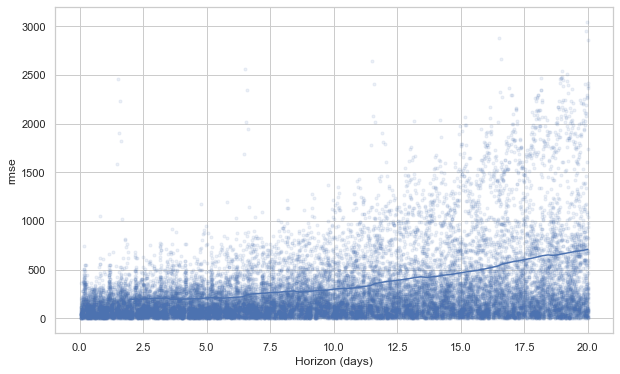

In [49]:
from prophet.plot import plot_cross_validation_metric

fig = plot_cross_validation_metric(df_cv, metric='rmse')

### Hyper Parameter Tuning

In [50]:
# Python
import itertools

param_grid = {  
    'changepoint_prior_scale': [0.001, 0.01, 0.1, 0.5],
    'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0], 
    'holidays_prior_scale': [0.01, 0.1, 1.0, 10.0]}

In [51]:
# Generate all combinations of parameters
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]

In [52]:
dictest = all_params[1]

In [53]:
dictest.values()

dict_values([0.001, 0.01, 0.1])

In [54]:
from prophet.diagnostics import cross_validation

# Use cross validation to evaluate all parameters
# By default, the initial training period is set to three times the horizon, and cutoffs are made every half a horizon.

rmses = []  # Store the RMSEs for each parameters here
d = {}
for params in all_params:
    liskeys = list(params.values())
    key = (liskeys[0],liskeys[1], liskeys[2])
    m = Prophet(**params, yearly_seasonality=True).fit(data)  # Fit model with given parameters
    data_cv = cross_validation(m, horizon = '30 days', parallel="processes")
    data_p = performance_metrics(data_cv, rolling_window=1)
    rmses.append(data_p['rmse'].values[0])
    d[key] = data_p['rmse'].values[0]

Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33600.4    0.00028328        3067.4           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       33605.6    0.00030241       4356.55    6.51e-08       0.001      207  LS failed, Hessian reset 
     199       33606.5   1.11144e-07       4308.69      0.2123           1      315   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     239       33606.5   2.83769e-08       2520.45      0.2922           1      368   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b0ad40d0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24968.2   4.38903e-08       4972.77     0.07339           1      139   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       27915.8   6.61418e-06       4758.76           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      72       23128.4    0.00029715       5286.52    5.97e-08       0.001      142  LS failed, Hessian reset 
     100       24968.2   4.82019e-09       4978.26     0.06668     0.06668      140   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      94       24095.8   8.20353e-05       5054.16   1.611e-08       0.001      171  LS failed, Hessian reset 
      74       28826.8   5.08443e-05       4993.94   1.012e-08       0.001      137  LS failed,

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       26988.1   5.23126e-07       5152.97      0.2018           1      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     102       25975.5   8.61047e-09       4946.57      0.4209      0.4209      141   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      99       23129.8   7.67394e-07       4605.03      0.4412           1      176   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       29673.7   3.04112e-08       5111.14      0.4394      0.4394      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       29673.7   1.54296e-08       4756.61      0.4796      0.4796      130   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99         28827   7.29855e-08       4987.92      0.5952      0.5952      170   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129       24096.2   1.36781e-08       5055.57      0.3502           1      221   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     107         28827   4.18623e-08       5041.48           1           1      179   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     105         27916   1.10765e-05       5224.26   2.146e-09       0.001      197  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     124       26989.2   2.51184e-05        4466.1   5.686e-09       0.001      209  LS failed, Hessian reset 
     131         27916   2.81097e-08       4862.04           1           1      227   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     138       23131.3   5.74435e-05       4877.48   1.119e-08       0.001      267  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     179       26990.2    6.4582e-09       5038.19      0.2651      0.2651      279   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     199       23132.5   7.05703e-06       4845.37      0.4941           1      340   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     222       23132.6   2.30802e-08        4696.5      0.8407      0.8407      374   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31361.6   8.32624e-06       4842.65      0.2642           1      141   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         32034   7.48989e-05       3782.01      0.8888      0.8888      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82       30557.9   0.000102264       5156.25   2.148e-08       0.001      168  LS failed, Hessian reset 
      57       32378.3    5.7553e-05       2670.24   2.206e-08       0.001      135  LS failed, Hessian reset 
      99       30558.6   3.91052e-06       4950.99       0.732       0.732      189   
    Iter      log prob        ||dx||      ||grad||       alpha      

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      91         33039   3.41638e-05       2536.98   1.123e-08       0.001      203  LS failed, Hessian reset 
      99       33039.2   7.08734e-05       3118.66           1           1      215   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     158       32034.7   1.90354e-05       4165.04   6.143e-09       0.001      267  LS failed, Hessian reset 
     151       30558.7   2.36035e-07        5189.2   5.182e-11       0.001      326  LS failed, Hessian reset 
     162       30558.7     2.029e-08       4572.43      0.6535      0.6535      342   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     125       33039.4   8.74686e-07       2376.38   2.991e-10       0.001      302  LS failed, Hessian reset 
     188       32034.8   1.85201e-06       1845.97   6.121e-10       0.001      350  LS failed, Hessian reset 
     136       33039.4   2.69118e-08       2379.42      0.6895      0.1832      323   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     198       32034.8   1.99671e-08       1908.59   9.055e-12       0.001      414  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33600.4    0.00028328        3067.4           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       33605.6    0.00030241       4356.55    6.51e-08       0.001      207  LS failed, Hessian reset 
     199       33606.5   1.11144e-07       4308.69      0.2123           1      315   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     239       33606.5   2.83769e-08       2520.45      0.2922           1      368   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b0ad64f0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24968.2   4.38903e-08       4972.77     0.07339           1      139   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       24968.2   4.82019e-09       4978.26     0.06668     0.06668      140   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      99       25975.5   4.65744e-08       4930.28      0.6032      0.6032      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      72       23128.4    0.00029715       5286.52    5.97e-08       0.001      142  LS failed, Hessian reset 
      99       26988.1   5.23126e-07       5152.97      0.2018           1      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     102       25975.5   8.

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      94       24095.8   8.20353e-05       5054.16   1.611e-08       0.001      171  LS failed, Hessian reset 
      99       27915.8   6.61418e-06       4758.76           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24096.1   3.19482e-05       5074.06      0.1485           1      177   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23129.8   7.67394e-07       4605.03      0.4412           1      176   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      74       28826.8   5.08443e-05       4993.94   1.012e-08       0.001      137  LS failed, Hessian reset 
     129       24096.2   1.36781e-08       5055.57      0.3502           1      221   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       29673.7   3.04112e-08       5111.14      0.4394      0.4394      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       29673.7   1.54296e-08       4756.61      0.4796      0.4796      130   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     124       26989.2   2.51184e-05        4466.1   5.686e-09       0.001      209  LS failed, Hessian reset 
     105         27916   1.10765e-05       5224.26   2.146e-09       0.001      197  LS failed, Hessian reset 
      99         28827   7.29855e-08       4987.92      0.5952      0.5952      170   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     107         28827   4.18623e-08       5041.48           1           1      179   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     138       23131.3   5.74435e-

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     131         27916   2.81097e-08       4862.04           1           1      227   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     179       26990.2    6.4582e-09       5038.19      0.2651      0.2651      279   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       23132.5   7.05703e-06       4845.37      0.4941           1      340   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     222       23132.6   2.30802e-08        4696.5      0.8407      0.8407      374   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31361.6   8.32624e-06       4842.65      0.2642           1      141   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82       30557.9   0.000102264       5156.25   2.148e-08       0.001      168  LS failed, Hessian reset 
      99         32034   7.48989e-05       3782.01      0.8888      0.8888      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      57       32378.3    5.7553e-05       2670.24   2.206e-08       0.001      135  LS failed, Hessian reset 
      99       30558.6   3.91052e-06       4950.99       0.732       0.732      189   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     170       31361.8   6.19021e-08       3956.75           1           1      235   
Optimization terminat

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      91         33039   3.41638e-05       2536.98   1.123e-08       0.001      203  LS failed, Hessian reset 
     158       32034.7   1.90354e-05       4165.04   6.143e-09       0.001      267  LS failed, Hessian reset 
      99       33039.2   7.08734e-05       3118.66           1           1      215   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     151       30558.7   2.36035e-07        5189.2   5.182e-11       0.001      326  LS failed, Hessian reset 
     162       30558.7     2.029e-08       4572.43      0.6535      0.6535      342   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     188       32034.8   1.85201e-06       1845.97   6.121e-10       0.001      350  LS failed, Hessian reset 
     125       33039.4   8.74686e-07       2376.38   2.991e-10       0.001      302  LS failed, Hessian reset 
     136       33039.4   2.69118e-08       2379.42      0.6895      0.1832      323   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     198       32034.8   1.99671e-08       1908.59   9.055e-12       0.001      414  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33600.4    0.00028328        3067.4           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       33605.6    0.00030241       4356.55    6.51e-08       0.001      207  LS failed, Hessian reset 
     199       33606.5   1.11144e-07       4308.69      0.2123           1      315   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     239       33606.5   2.83769e-08       2520.45      0.2922           1      368   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b0adad00>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24968.2   4.38903e-08       4972.77     0.07339           1      139   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       24968.2   4.82019e-09       4978.26     0.06668     0.06668      140   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      72       23128.4    0.00029715       5286.52    5.97e-08       0.001      142  LS failed, Hessian reset 
      99       26988.1   5.23126e-07       5152.97      0.2018           1      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       25975.5   4.65744e-08       4930.28      0.6032      0.6032      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      94       24095.8   8.20353e-05       5054.16   1.611e-08       0.001      171  LS failed, Hessian reset 
     102       25975.5   8.61047e-09       4946.57      0.4209      0.4209      141   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      99       24096.1   3.19482e-05       5074.06      0.1485           1      177   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       27915.8   6.61418e-06       4758.76           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23129.8   7.67394e-07       4605.03      0.4412           1      176   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       29673.7   3.04112e-08       5111.14      0.4394      0.4394      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       29673.7   1.54296e-08       4756.61      0.4796      0.4796      130   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      74       28826.8   5.08443e-05       4993.94   1.012e-08       0.001      137  LS failed, Hessian reset 
     129       24096.2   1.36781e-08       5055.57      0.3502           1      221   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99         28827   7.29855e-08       4987.92      0.5952      0.5952      170   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     124       26989.2   2.51184e-05        4466.1   5.686e-09       0.001      209  LS failed, Hessian reset 
     107         28827   4.18623e-08       5041.48           1           1      179   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     105         27916   1.10765e-05       5224.26   2.146e-09       0.001      197  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     138       23131.3   5.74435e-05       4877.48   1.119e-08       0.001      267  LS failed, Hessian reset 
     131         27916   2.81097e-08       4862.04           1           1      227   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     179       26990.2    6.4582e-09       5038.19      0.2651      0.2651      279   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     199       23132.5   7.05703e-06       4845.37      0.4941           1      340   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     222       23132.6   2.30802e-08        4696.5      0.8407      0.8407      374   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31361.6   8.32624e-06       4842.65      0.2642           1      141   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82       30557.9   0.000102264       5156.25   2.148e-08       0.001      168  LS failed, Hessian reset 
      99         32034   7.48989e-05       3782.01      0.8888      0.8888      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30558.6   3.91052e-06       4950.99       0.732       0.732      189   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      57       32378.3    5.7553e-05       2670.24   2.206e-08       0.001      135  LS

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      97       32378.9   8.63095e-09       2975.15     0.02141     0.02141      192   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      91         33039   3.41638e-05       2536.98   1.123e-08       0.001      203  LS failed, Hessian reset 
     158       32034.7   1.90354e-05       4165.04   6.143e-09       0.001      267  LS failed, Hessian reset 
     151       30558.7   2.36035e-07        5189.2   5.182e-11       0.001      326  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       33039.2   7.08734e-05       3118.66           1           1      215   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     162       30558.7     2.029e-08       4572.43      0.6535      0.6535      342   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     188       32034.8   1.85201e-06       1845.97   6.121e-10       0.001      350  LS failed, Hessian reset 
     125       33039.4   8.74686e-07       2376.38   2.991e-10       0.001      302  LS failed, Hessian reset 
     136       33039.4   2.69118e-08       2379.42      0.6895      0.1832      323   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     198       32034.8   1.99671e-08       1908.59   9.055e-12       0.001      414  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33600.4    0.00028328        3067.4           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       33605.6    0.00030241       4356.55    6.51e-08       0.001      207  LS failed, Hessian reset 
     199       33606.5   1.11144e-07       4308.69      0.2123           1      315   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     239       33606.5   2.83769e-08       2520.45      0.2922           1      368   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b0b78df0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       25975.5   4.65744e-08       4930.28      0.6032      0.6032      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       26988.1   5.23126e-07       5152.97      0.2018           1      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      72       23128.4    0.00029715       5286.52    5.97e-08       0.001      142  LS failed, Hessian reset 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       24968.2   4.38903e-08       4972.77     0.07339           1      139   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      74       28826.8   5.08443e-05       4993.94   1.012e-08       0.001      137  LS failed, Hessian reset 
     100       24968.2   4.82019e-09       4978.26     0.06668     0.06668      140   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      94       24095.8   8.20353e-05       5054.16   1.611e-08       0.001      171  LS failed, Hessian reset 
      99       23129.8   7.67394e-07       4605.03      0.4412           1      176   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       24096.1   3.19482e-05       5074.06      0.1485           1      177   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       29673.7   3.04112e-08       5111.14      0.4394      0.4394      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       29673.7   1.54296e-08       4756.61      0.4796      0.4796      130   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99         28827   7.29855e-08       4987.92      0.5952      0.5952      170   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     107         28827   4.18623e-08       5041.48           1           1      179   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     124       26989.2   2.51184e-05        4466.1   5.686e-09       0.001      209  LS failed, Hessian reset 
     129       24096.2   1.36781e-08       5055.57      0.3502           1      221   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     105         27916   1.10765e-05       5224.26   2.146e-09       0.001      197  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     131         27916   2.81097e-08       4862.04           1           1      227   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     138       23131.3   5.74435e-05       4877.48   1.119e-08       0.001      267  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     179       26990.2    6.4582e-09       5038.19      0.2651      0.2651      279   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       23132.5   7.05703e-06       4845.37      0.4941           1      340   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     222       23132.6   2.30802e-08        4696.5      0.8407      0.8407      374   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31361.6   8.32624e-06       4842.65      0.2642           1      141   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         32034   7.48989e-05       3782.01      0.8888      0.8888      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82       30557.9   0.000102264       5156.25   2.148e-08       0.001      168  LS failed, Hessian reset 
      57       32378.3    5.7553e-05       2670.24   2.206e-08       0.001      135  LS failed, Hessian reset 
      99       30558.6   3.91052e-06       4950.99       0.732       0.732      189   
    Iter      log prob        ||dx||      ||grad||       alpha      

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      91         33039   3.41638e-05       2536.98   1.123e-08       0.001      203  LS failed, Hessian reset 
      99       33039.2   7.08734e-05       3118.66           1           1      215   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     158       32034.7   1.90354e-05       4165.04   6.143e-09       0.001      267  LS failed, Hessian reset 
     151       30558.7   2.36035e-07        5189.2   5.182e-11       0.001      326  LS failed, Hessian reset 
     162       30558.7     2.029e-08       4572.43      0.6535      0.6535      342   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     125       33039.4   8.74686e-07       2376.38   2.991e-10       0.001      302  LS failed, Hessian reset 
     188       32034.8   1.85201e-06       1845.97   6.121e-10       0.001      350  LS failed, Hessian reset 
     136       33039.4   2.69118e-08       2379.42      0.6895      0.1832      323   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     198       32034.8   1.99671e-08       1908.59   9.055e-12       0.001      414  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85       33645.3    0.00106602       5711.34   2.374e-07       0.001      150  LS failed, Hessian reset 
      99       33647.3   6.38069e-05       2024.49      0.4027           1      168   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33648.7   7.30972e-05       4500.81           1           1      301   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     282       33653.4   5.93159e-09       2700.09     0.03193      0.3409      408   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6a14a63d0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24134.5   1.36284e-07       5064.01      0.2875           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110       24134.5   8.52872e-09       4585.44      0.5163      0.5163      144   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      77       23169.6   0.000181012       5361.88   3.587e-08       0.001      153  LS failed, H

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       25008.8   6.34461e-06       5044.96      0.7702      0.7702      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       27029.1   1.40655e-05       5108.09      0.7724      0.7724      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23170.7   1.75925e-05       4487.93           1           1      180   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      80       27958.3   0.000104297       4998.72   2.093e-08       0.001      157  LS failed, Hessian reset 
      99       28868.2   2.65676e-06       4993.13           1           1      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       29716.1    5.4614e-07       4769.39      0.3224           1      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     128       28868.2   1.08921e-08        4566.9      0.5312      0.5312      169   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     135       25010.1   0.000124434       4560.27   2.628e-08       0.001      233  LS failed, Hessian reset 
     119       27958.9   1.14105e-08       4810.17      0.2912      0.2912      215   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     176       23171.1   6.51937e-09       4601.54      0.2975      0.2975      278   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     136       26018.8   2.35391e-08       4674.12      0.6412      0.6412      219   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     140       27031.2   9.04765e-09       4897.09       0.208       0.208      237   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     199       25010.8   3.11926e-08       5068.04      0.9357      0.9357      310   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     202       25010.8   9.44814e-09       4647.65      0.4562      0.4562      313   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30600.9   9.31288e-08       4182.54           1           1      147   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       30600.9   8.41923e-09       4382.49      0.4346      0.4346      161   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       31403.4   1.62181e-05       3727.73      0.2862           1      140   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32074.8   0.000386199       4681.55      0.2823      0.9614      137   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32426.2   4.42849e-05       3122.45           1           1      144   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82         33086   0.000106328       2655.12    3.76e-08       0.001      174  LS failed, Hessian reset 
      99       33086.5   1.39316e-05       2539.71       1.217      0.3037      197   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       32427.2   0.000332352       4349.84   8.975e-08       0.001      227  LS failed, Hessian reset 
     199       31404.9   2.52187e-05       4546.09           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     193       32076.7   1.80937e-06       3106.94   5.037e-10       0.001      337  LS failed, Hessian reset 
     199       32076.7   9.25806e-08       2357.01      0.6918      0.6918      344   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     227       31405.9   5.95194e-05       5136.22   1.064e-08       0.001      369  LS failed, Hessian reset 
     221       32076.7    1.9926e-08       2541.42      0.1695      0.6043      375   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       31406.5   2.02756e-06       4575.43           1           1      453   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     321       31406.5   1.81897e-08       4019.88      0.6679      0.6679      483   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85       33645.3    0.00106602       5711.34   2.374e-07       0.001      150  LS failed, Hessian reset 
      99       33647.3   6.38069e-05       2024.49      0.4027           1      168   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33648.7   7.30972e-05       4500.81           1           1      301   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     282       33653.4   5.93159e-09       2700.09     0.03193      0.3409      408   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b0abe1c0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      77       23169.6   0.000181012       5361.88   3.587e-08       0.001      153  LS failed, Hessian reset 
      99       24134.5   1.36284e-07       5064.01      0.2875           1      132   
    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       27029.1   1.40655e-05       5108.09      0.7724      0.7724      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      98       26017.8   0.000153444       4740.75   3.636e-08       0.001      173  LS failed, Hessian reset 
      99         26018   7.11475e-05       4789.16           1           1      174   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       28868.2   2.65676e-06       4993.13           1           1      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       29716.1    5.4614e-07       4769.39      0.3224           1      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      80       27958.3   0.000104297       4998.72   2.093e-08       0.001      157  LS failed, Hessian reset 
     128       28868.2   1.08921e-08        4566.9      0.5312

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     140       27031.2   9.04765e-09       4897.09       0.208       0.208      237   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     119       27958.9   1.14105e-08       4810.17      0.2912      0.2912      215   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     199       25010.8   3.11926e-08       5068.04      0.9357      0.9357      310   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     202       25010.8   9.44814e-09       4647.65      0.4562      0.4562      313   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30600.9   9.31288e-08       4182.54           1           1      147   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       30600.9   8.41923e-09       4382.49      0.4346      0.4346      161   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       31403.4   1.62181e-05       3727.73      0.2862           1      140   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32074.8   0.000386199       4681.55      0.2823      0.9614      137   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32426.2   4.42849e-05       3122.45           1           1      144   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82         33086   0.000106328       2655.12    3.76e-08       0.001      174  LS failed, Hessian reset 
      99       33086.5   1.39316e-05       2539.71       1.217      0.3037      197   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       32427.2   0.000332352       4349.84   8.975e-08       0.001      227  LS failed, Hessian reset 
     199       31404.9   2.52187e-05       4546.09           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     193       32076.7   1.80937e-06       3106.94   5.037e-10       0.001      337  LS failed, Hessian reset 
     199       32076.7   9.25806e-08       2357.01      0.6918      0.6918      344   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     227       31405.9   5.95194e-05       5136.22   1.064e-08       0.001      369  LS failed, Hessian reset 
     221       32076.7    1.9926e-08       2541.42      0.1695      0.6043      375   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       31406.5   2.02756e-06       4575.43           1           1      453   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     321       31406.5   1.81897e-08       4019.88      0.6679      0.6679      483   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85       33645.3    0.00106602       5711.34   2.374e-07       0.001      150  LS failed, Hessian reset 
      99       33647.3   6.38069e-05       2024.49      0.4027           1      168   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33648.7   7.30972e-05       4500.81           1           1      301   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     282       33653.4   5.93159e-09       2700.09     0.03193      0.3409      408   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6a1919c10>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24134.5   1.36284e-07       5064.01      0.2875           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110       24134.5   8.52872e-09       4585.44      0.5163      0.5163      144   
Optimization terminated normally: 
  Convergence detected: absolute p

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      77       23169.6   0.000181012       5361.88   3.587e-08       0.001      153  LS failed, Hessian reset 
      99       25008.8   6.34461e-06       5044.96      0.7702      0.7702      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23170.7   1.75925e-05       4487.93           1           1      180   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       28868.2   2.65676e-06       4993.13           1           1      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      98       26017.8   0.000153444       4740.75   3.636e-08       0.001      173  LS failed, Hessian reset 
      99         26018   7.11475e-05       4789.16           1           1      174   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       27029.1   1.40655e-05       5108.09      0.7724

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     136       26018.8   2.35391e-08       4674.12      0.6412      0.6412      219   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     119       29716.1     3.367e-08       4634.89      0.3439           1      160   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99       27958.8   3.68716e-06       4981.56           1           1      185   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     176       23171.1   6.51937e-09       4601.54      0.2975      0.2975      278   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     135       25010.1   0.000124434       4560.27   2.628e-08       0.001      233  LS failed, Hessian reset 
     119       27958.9   1.14105e-08       4810.17      0.2912      0.2912      215   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     113       27030.5   0.000125286       5200.18   2.324e-08       0.001      205  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     140       27031.2   9.04765e-09       4897.09       0.208       0.208      237   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     199       25010.8   3.11926e-08       5068.04      0.9357      0.9357      310   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     202       25010.8   9.44814e-09       4647.65      0.4562      0.4562      313   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30600.9   9.31288e-08       4182.54           1           1      147   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       30600.9   8.41923e-09       4382.49      0.4346      0.4346      161   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       31403.4   1.62181e-05       3727.73      0.2862           1      140   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32074.8   0.000386199       4681.55      0.2823      0.9614      137   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32426.2   4.42849e-05       3122.45           1           1      144   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82         33086   0.000106328       2655.12    3.76e-08       0.001      174  LS failed, Hessian reset 
      99       33086.5   1.39316e-05       2539.71       1.217      0.3037      197   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       32427.2   0.000332352       4349.84   8.975e-08       0.001      227  LS failed, Hessian reset 
     199       31404.9   2.52187e-05       4546.09           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     193       32076.7   1.80937e-06       3106.94   5.037e-10       0.001      337  LS failed, Hessian reset 
     199       32076.7   9.25806e-08       2357.01      0.6918      0.6918      344   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     227       31405.9   5.95194e-05       5136.22   1.064e-08       0.001      369  LS failed, Hessian reset 
     221       32076.7    1.9926e-08       2541.42      0.1695      0.6043      375   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       31406.5   2.02756e-06       4575.43           1           1      453   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     321       31406.5   1.81897e-08       4019.88      0.6679      0.6679      483   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85       33645.3    0.00106602       5711.34   2.374e-07       0.001      150  LS failed, Hessian reset 
      99       33647.3   6.38069e-05       2024.49      0.4027           1      168   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33648.7   7.30972e-05       4500.81           1           1      301   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     282       33653.4   5.93159e-09       2700.09     0.03193      0.3409      408   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b0c08520>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -81.5247
Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24134.5   1.36284e-07       5064.01      0.2875           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       25008.8   6.34461e-06       5044.96      0.7702      0.7702      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110       24134.5   8.52872e-09       4585.44      0.5163      0.5163      144   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      77       23169.6   0.000181012       5361.88   3.587e-08       0.001      153  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       27029.1   1.40655e-05       5108.09      0.7724      0.7724      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23170.7   1.75925e-05       4487.93           1           1      180   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       28868.2   2.65676e-06       4993.13           1           1      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       29716.1    5.4614e-07       4769.39      0.3224           1      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      98       26017.8   0.000153444       4740.75   3.636e-08       0.001      173  LS failed, Hessian reset 
      99         26018   7.11475e-05       4789.16           1           1      174   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     135       25010.1   0.000124434       4560.27   2.628e-08       0.001      233  LS failed, Hessian reset 
     113       27030.5   0.000125286       5200.18   2.324e-08       0.001      205  LS failed, Hessian reset 
      99       27958.8   3.68716e-06       4981.56           1           1      185   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     136       26018.8   2.35391e-08       4674.12      0.6412      0.6412      219   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     176       23171.1   6.51937e-09       4601.54      0.2975      0.2975      278   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     119       27958.9   1.14105e-08       4810.17      0.2912      0.2912      215   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     140       27031.2   9.04765e-09       4897.09       0.208       0.208      237   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     199       25010.8   3.11926e-08       5068.04      0.9357      0.9357      310   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     202       25010.8   9.44814e-09       4647.65      0.4562      0.4562      313   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30600.9   9.31288e-08       4182.54           1           1      147   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       30600.9   8.41923e-09       4382.49      0.4346      0.4346      161   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       31403.4   1.62181e-05       3727.73      0.2862           1      140   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32074.8   0.000386199       4681.55      0.2823      0.9614      137   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32426.2   4.42849e-05       3122.45           1           1      144   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82         33086   0.000106328       2655.12    3.76e-08       0.001      174  LS failed, Hessian reset 
      99       33086.5   1.39316e-05       2539.71       1.217      0.3037      197   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       32427.2   0.000332352       4349.84   8.975e-08       0.001      227  LS failed, Hessian reset 
     199       31404.9   2.52187e-05       4546.09           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     193       32076.7   1.80937e-06       3106.94   5.037e-10       0.001      337  LS failed, Hessian reset 
     199       32076.7   9.25806e-08       2357.01      0.6918      0.6918      344   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     227       31405.9   5.95194e-05       5136.22   1.064e-08       0.001      369  LS failed, Hessian reset 
     221       32076.7    1.9926e-08       2541.42      0.1695      0.6043      375   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       31406.5   2.02756e-06       4575.43           1           1      453   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     321       31406.5   1.81897e-08       4019.88      0.6679      0.6679      483   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      80       33646.2   0.000313863       5158.66   5.375e-08       0.001      149  LS failed, Hessian reset 
      99       33647.8   1.02953e-05       3792.12       1.692      0.1692      178   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       33647.9   7.05889e-06       4476.57   1.824e-09       0.001      262  LS failed, Hessian reset 
     163       33647.9   1.42417e-08       3314.61      0.2639           1      302   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b11544c0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob      

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      95       24134.9   0.000108525       5582.29   2.185e-08       0.001      207  LS failed, Hessian reset 
      99       24135.4   0.000108374       5070.08           1           1      211   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     153       26019.7   1.83466e-08       5103.42      0.7266      0.7266      245   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     146       25011.6   7.21339e-09       4701.66      0.4138      0.4138      243   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     134       27959.4   7.33237e-09       5038.21      0.4922      0.4922      218   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     143       24135.9   7.24932e-09       4173.09      0.2186      0.2186      267   
Optimization terminated normally: 
  Convergen

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     166       27031.9   6.57256e-09       4711.04      0.2131      0.2131      253   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     199       23170.7   4.12616e-07       4945.09      0.3619           1      317   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     141       29716.7   5.58175e-07       4917.83   1.266e-10       0.001      233  LS failed, Hessian reset 
     150       29716.7   2.37469e-08       3871.15      0.3824      0.3824      244   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     217       23170.8   1.23309e-05        4726.7   2.269e-09       0.001      394  LS failed, Hessian reset 
     244       23170.8   1.24871e-06       5205.18   2.867e-10       0.001      478  LS failed, Hessian reset 
     258       23170.8   9.17052e-09       4669.75      0.1979      0.1979      498   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      38       32424.8   0.000196426       2253.53   7.995e-08       0.001       96  LS failed, Hessian reset 
      97       30601.3   0.000229212       3617.18   3.629e-08       0.001      200  LS failed, Hessian reset 
      99       30601.5   2.88295e-05       4087.25      0.5784      0.5784      202   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      93       31404.4   4.98508e-05        4677.1   1.151e-08       0.001      167  LS failed, Hessian reset 
      59       33086.1    9.0502e-05       2332.43   2.672e-08       0.001      139  LS fa

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     161       30602.2    9.6121e-09        4430.7      0.3078      0.3078      281   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     143       31404.5   4.29342e-07       4809.33   9.284e-11       0.001      262  LS failed, Hessian reset 
      99       32425.9   8.80486e-06       2321.43       1.687      0.1687      241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     153       31404.5   4.32401e-08       3909.75      0.7169      0.7169      274   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     177       32074.7    1.4229e-05       3429.71   3.606e-09       0.001      322  LS failed, Hessian reset 
     199       32074.7    8.0616e-07        2678.5       1.576       0.457      350   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209       32074.7   3.54779e-08       2639.22      0.3113           1      366   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     159       32427.8   0.000222623       3383.61   7.596e-08       0.001      373  LS failed, Hessian reset 
     168         32428   1.43801e-05       2848.77   7.082e-09       0.001      433  LS failed, Hessian reset 
     188       32428.1   9.09502e-07       2640.47   4.225e-10       0.001      498  LS failed, Hessian reset 
     197       32428.1   2.50096e-08       2202.76      0.4046      0.4046      510   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      80       33646.2   0.000313863       5158.66   5.375e-08       0.001      149  LS failed, Hessian reset 
      99       33647.8   1.02953e-05       3792.12       1.692      0.1692      178   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       33647.9   7.05889e-06       4476.57   1.824e-09       0.001      262  LS failed, Hessian reset 
     163       33647.9   1.42417e-08       3314.61      0.2639           1      302   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b0ad47f0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23168.6   4.00282e-06       4873.95      0.3061           1      139   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       27030.1   2.73637e-05       4872.72      0.4317           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       25010.3   0.000309292       4387.67   5.645e-08       0.001      169  LS failed, Hessian reset 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       27959.1   8.36332e-05       4982.35           1           1      173   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116       27031.2   0.000101057       4876.63   1.836e-08       0.001      192  LS failed, Hessian reset 
     146       25011.6   7.21339e-09       4701.66      0.4138      0.4138      243   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     143       24135.9   7.24932e-09       4173.09      0.2186      0.2186      267   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     199       23170.7   4.12616e-07       4945.09      0.3619           1      317   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     134       27959.4   7.33237e-09       5038.21      0.4922      0.4922      218   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     153       26019.7   1.83466e-08       5103.42      0.7266      0.7266      245   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     166       27031.9   6.57256e-09       4711.04      0.2131      0.2131      253   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     141       29716.7   5.58175e-07       4917.83   1.266e-10       0.001      233  LS failed, Hessian reset 
     150       29716.7   2.37469e-08       3871.15      0.3824      0.3824      244   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     217       23170.8   1.23309e-05        4726.7   2.269e-09       0.001      394  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     244       23170.8   1.24871e-06       5205.18   2.867e-10       0.001      478  LS failed, Hessian reset 
     258       23170.8   9.17052e-09       4669.75      0.1979      0.1979      498   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      38       32424.8   0.000196426       2253.53   7.995e-08       0.001       96  LS failed, Hessian reset 
      97       30601.3   0.000229212       3617.18   3.629e-08       0.001      200  LS failed, Hessian reset 
      99       30601.5   2.88295e-05       4087.25      0.5784      0.5784      202   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      93       31404.4   4.98508e-05        4677.1   1.151e-08       0.001      167  LS failed, Hessian reset 
      87       32073.4   0.000359862       4264.01   7.851e-08       0.001      157  LS failed, Hessian reset 
      99       31404.5   5.76792e-06       4012.01       0.903       0.903      175   
    Iter      log prob   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     153       31404.5   4.32401e-08       3909.75      0.7169      0.7169      274   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99       32425.9   8.80486e-06       2321.43       1.687      0.1687      241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     177       32074.7    1.4229e-05       3429.71   3.606e-09       0.001      322  LS failed, Hessian reset 
     199       32074.7    8.0616e-07        2678.5       1.576       0.457      350   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209       32074.7   3.54779e-08       2639.22      0.3113           1      366   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     159       32427.8   0.000222623       3383.61   7.596e-08       0.001      373  LS failed, Hessian reset 
     168         32428   1.43801e-05       2848.77   7.082e-09       0.001      433  LS failed, Hessian reset 
     188       32428.1   9.09502e-07       2640.47   4.225e-10       0.001      498  LS failed, Hessian reset 
     197       32428.1   2.50096e-08       2202.76      0.4046      0.4046      510   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      80       33646.2   0.000313863       5158.66   5.375e-08       0.001      149  LS failed, Hessian reset 
      99       33647.8   1.02953e-05       3792.12       1.692      0.1692      178   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       33647.9   7.05889e-06       4476.57   1.824e-09       0.001      262  LS failed, Hessian reset 
     163       33647.9   1.42417e-08       3314.61      0.2639           1      302   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b13064f0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23168.6   4.00282e-06       4873.95      0.3061           1      139   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       23169.3   0.000458587       4914.08   9.199e-08       0.001      214  LS failed, Hessian reset 
      99       27030.1   2.73637e-05       4872.72      0.4317           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       25010.3   0.000309292       4387.67   5.645e-08       0.001      169  LS failed, Hessian reset 
      97       26019.3   5.70885e-05       5039.85   1.141e-08

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     116       27031.2   0.000101057       4876.63   1.836e-08       0.001      192  LS failed, Hessian reset 
     134       27959.4   7.33237e-09       5038.21      0.4922      0.4922      218   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     143       24135.9   7.24932e-09       4173.09      0.2186      0.2186      267   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     153       26019.7   1.83466e-08       5103.42      0.7266      0.7266      245   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       23170.7   4.12616e-07       4945.09      0.3619           1      317   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     146       25011.6   7.21339e-09       4701.66      0.4138      0.4138      243   
Optimization terminated normally: 
  Convergen

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     166       27031.9   6.57256e-09       4711.04      0.2131      0.2131      253   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     141       29716.7   5.58175e-07       4917.83   1.266e-10       0.001      233  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     150       29716.7   2.37469e-08       3871.15      0.3824      0.3824      244   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     217       23170.8   1.23309e-05        4726.7   2.269e-09       0.001      394  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     244       23170.8   1.24871e-06       5205.18   2.867e-10       0.001      478  LS failed, Hessian reset 
     258       23170.8   9.17052e-09       4669.75      0.1979      0.1979      498   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      38       32424.8   0.000196426       2253.53   7.995e-08       0.001       96  LS failed, Hessian reset 
      87       32073.4   0.000359862       4264.01   7.851e-08       0.001      157  LS failed, Hessian reset 
      93       31404.4   4.98508e-05        4677.1   1.151e-08       0.001      167  LS failed, Hessian reset 
      97       30601.3   0.000229212       3617.18   3.629e-08       0.001      200  LS failed, Hessian reset 
      99       31404.5   5.76792e-06       4012.01       0.903       0.903      175   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30601.5   2.88295e-05       4087.25      0.5784      0.5784      202   
    Iter      log prob   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     153       31404.5   4.32401e-08       3909.75      0.7169      0.7169      274   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     177       32074.7    1.4229e-05       3429.71   3.606e-09       0.001      322  LS failed, Hessian reset 
     199       32074.7    8.0616e-07        2678.5       1.576       0.457      350   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209       32074.7   3.54779e-08       2639.22      0.3113           1      366   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     159       32427.8   0.000222623       3383.61   7.596e-08       0.001      373  LS failed, Hessian reset 
     168         32428   1.43801e-05       2848.77   7.082e-09       0.001      433  LS failed, Hessian reset 
     188       32428.1   9.09502e-07       2640.47   4.225e-10       0.001      498  LS failed, Hessian reset 
     197       32428.1   2.50096e-08       2202.76      0.4046      0.4046      510   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      80       33646.2   0.000313863       5158.66   5.375e-08       0.001      149  LS failed, Hessian reset 
      99       33647.8   1.02953e-05       3792.12       1.692      0.1692      178   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       33647.9   7.05889e-06       4476.57   1.824e-09       0.001      262  LS failed, Hessian reset 
     163       33647.9   1.42417e-08       3314.61      0.2639           1      302   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b0c08520>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23168.6   4.00282e-06       4873.95      0.3061           1      139   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97       26019.3   5.70885e-05       5039.85   1.141e-08       0.001      173  LS failed, Hessian reset 
      99       26019.4   1.85682e-05       4908.63      0.6746      0.6746      175   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     153       26019.7   1.83466e-08       5103.42      0.7266      0.7266      245   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     116       27031.2   0.000101057       4876.63   1.836e-08       0.001      192  LS failed, Hessian reset 
     146       25011.6   7.21339e-09       4701.66      0.4138      0.4138      243   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     143       24135.9   7.24932e-09       4173.09      0.2186      0.2186      267   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     134       27959.4   7.33237e-09       5038.21      0.4922      0.4922      218   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       23170.7   4.12616e-07       4945.09      0.3619           1      317   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     141       29716.7   5.58175e-07       4917.83   1.266e-10       0.001      233  LS failed, Hessian reset 
     166       27031.9   6.57256e-09       4711.04      0.2131      0.2131      253   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     150       29716.7   2.37469e-08       3871.15      0.3824      0.3824      244   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     217       23170.8   1.23309e-05        4726.7   2.269e-09       0.001      394  LS failed, Hessian reset 
     244       23170.8   1.24871e-06       5205.18   2.867e-10       0.001      478  LS failed, Hessian reset 
     258       23170.8   9.17052e-09       4669.75      0.1979      0.1979      498   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      38       32424.8   0.000196426       2253.53   7.995e-08       0.001       96  LS failed, Hessian reset 
      87       32073.4   0.000359862       4264.01   7.851e-08       0.001      157  LS failed, Hessian reset 
      59       33086.1    9.0502e-05       2332.43   2.672e-08       0.001      139  LS failed, Hessian reset 
      93       31404.4   4.98508e-05        4677.1   1.151e-08       0.001      167  LS failed, Hessian reset 
      97       30601.3   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     161       30602.2    9.6121e-09        4430.7      0.3078      0.3078      281   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     143       31404.5   4.29342e-07       4809.33   9.284e-11       0.001      262  LS failed, Hessian reset 
      99       32425.9   8.80486e-06       2321.43       1.687      0.1687      241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     153       31404.5   4.32401e-08       3909.75      0.7169      0.7169      274   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     177       32074.7    1.4229e-05       3429.71   3.606e-09       0.001      322  LS failed, Hessian reset 
     199       32074.7    8.0616e-07        2678.5       1.576       0.457      350   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209       32074.7   3.54779e-08       2639.22      0.3113           1      366   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     159       32427.8   0.000222623       3383.61   7.596e-08       0.001      373  LS failed, Hessian reset 
     168         32428   1.43801e-05       2848.77   7.082e-09       0.001      433  LS failed, Hessian reset 
     188       32428.1   9.09502e-07       2640.47   4.225e-10       0.001      498  LS failed, Hessian reset 
     197       32428.1   2.50096e-08       2202.76      0.4046      0.4046      510   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33642.3    1.4577e-05       3631.86           1           1      140   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       33645.7   0.000491522       3724.16   9.124e-08       0.001      216  LS failed, Hessian reset 
     199       33648.3    2.6294e-05       3931.93           1           1      304   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     232       33651.1    0.00020159       4641.81   5.848e-08       0.001      381  LS failed, Hessian reset 
     299         33653   3.48263e-06       3355.53      0.9674      0.9674      477   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     384       33654.4   0.000161041       4840.33   4.107e-08       0.001      632  LS failed, Hessian rese

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b0c08460>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.5247
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24136.2   1.74878e-06       4619.77       0.939       0.939      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      79       23169.7   0.000134501       4394.43   2.571e-08       0.001      152  LS failed, Hessian reset 
      99       26017.6   1.29083e-05       50

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      91       27958.3   0.000157169       5051.74   2.901e-08       0.001      156  LS failed, Hessian reset 
      99         27959   6.96254e-06       5089.61      0.5251      0.5251      165   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     102       25010.4   0.000177781       4611.25   3.321e-08       0.001      212  LS failed, Hessian reset 
     133       28868.5   8.69862e-09        4664.4      0.2646      0.2646      175   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     126       27032.1   2.78306e-08       4725.65           1           1      206   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     137       23170.7   6.15216e-06       4973.64   1.191e-09       0.001      267  LS failed, Hessian reset 
     114         29717   5.79085e-07       4909.83   1.153e-10       0.001      190  LS failed, Hessian reset 
     161       23170.7   3.07956e-08       4698.98      0.3617           1      298   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     131         29717   1.89006e-08       4961.63      0.9464      0.9464      210   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     169       26018.6   2.82475e-05        4040.8   6.825e-09       0.001      291  LS failed, Hessian reset 
     152       27959.3   2.36334e-08       5001.61           1           1      228   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     179       25011.6   9.30009e-09       5014.38      0.2045      0.2045      310   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       26019.3   2.71593e-07       4531.75      0.2762           1      327   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     218       26019.3   6.51901e-09       5086.41      0.3064      0.3064      349   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -106.534
Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31403.4   0.000186571       3274.29      0.3998           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30600.1   8.31899e-06       4361.05           1           1      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32076.6    0.00020081       2566.17      0.8106      0.8106      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      61       32426.3   4.25434e-06       2271.44   1.436e-09       0.001      132  LS failed, Hessian reset 
      52       33084.7   0.000192393       2665.03   6.747e-08       0.001      126  LS

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     172       31406.1   4.60455e-05       5159.03   9.182e-09       0.001      251  LS failed, Hessian reset 
      99       33085.8   1.48927e-06       2488.38      0.4554      0.1133      203   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       31406.4   9.92847e-07       5023.16           1           1      284   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     177       32077.3   1.86252e-06       3077.98   5.425e-10       0.001      271  LS failed, Hessian reset 
     194         30602   2.12368e-08       4690.46      0.3384           1      299   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     188       32077.3   4.90938e-08       2628.49      0.2449      0.2449      284   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     225       31406.4   2.41916e-08       5147.22      0.2133           1      324   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     116       33085.8   7.61015e-08        2623.7   3.181e-11       0.001      275  LS failed, Hessian reset 
     118       33085.8   8.32984e-08       1849.89       2.188      0.5171      279   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33642.3    1.4577e-05       3631.86           1           1      140   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       33645.7   0.000491522       3724.16   9.124e-08       0.001      216  LS failed, Hessian reset 
     199       33648.3    2.6294e-05       3931.93           1           1      304   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     232       33651.1    0.00020159       4641.81   5.848e-08       0.001      381  LS failed, Hessian reset 
     299         33653   3.48263e-06       3355.53      0.9674      0.9674      477   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     384       33654.4   0.000161041       4840.33   4.107e-08       0.001      632  LS failed, Hessian rese

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b0acf070>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -58.7196
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24136.2   1.74878e-06       4619.77       0.939       0.939      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       25009.5 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       27032.1   1.46296e-05       4984.64      0.7887      0.7887      170   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     102       25010.4   0.000177781       4611.25   3.321e-08       0.001      212  LS failed, Hessian reset 
      99         29717   3.01835e-07       5156.41      0.7085      0.7085      137   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      91       27958.3   0.000157169       5051.74   2.901e-08       0.001      156  LS failed, Hessian reset 
      99         27959   6.96254e-06       5089.61      0.5251      0.5251      165   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     133       28868.5   8.69862e-09        4664.4      0.2646      0.2646      175   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     126       27032.1   2.78306e-08       4725.6

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     137       23170.7   6.15216e-06       4973.64   1.191e-09       0.001      267  LS failed, Hessian reset 
     114         29717   5.79085e-07       4909.83   1.153e-10       0.001      190  LS failed, Hessian reset 
     161       23170.7   3.07956e-08       4698.98      0.3617           1      298   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     131         29717   1.89006e-08       4961.63      0.9464      0.9464      210   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     152       27959.3   2.36334e-08       5001.61           1           1      228   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     179       25011.6   9.30009e-09       5014.38      0.2045      0.2045      310   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     16

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     199       26019.3   2.71593e-07       4531.75      0.2762           1      327   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     218       26019.3   6.51901e-09       5086.41      0.3064      0.3064      349   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30600.1   8.31899e-06       4361.05           1           1      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31403.4   0.000186571       3274.29      0.3998           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32076.6    0.00020081       2566.17      0.8106      0.8106      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      52       33084.7   0.000192393       2665.03   6.747e-08   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     172       31406.1   4.60455e-05       5159.03   9.182e-09       0.001      251  LS failed, Hessian reset 
      99       33085.8   1.48927e-06       2488.38      0.4554      0.1133      203   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     194         30602   2.12368e-08       4690.46      0.3384           1      299   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       31406.4   9.92847e-07       5023.16           1           1      284   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     177       32077.3   1.86252e-06       3077.98   5.425e-10       0.001      271  LS failed, Hessian reset 
     225       31406.4   2.41916e-08       5147.22      0.2133           1      324   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     188       32077.3   4.90938e-08       2628.49      0.2449      0.2449      284   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     116       33085.8   7.61015e-08        2623.7   3.181e-11       0.001      275  LS failed, Hessian reset 
     118       33085.8   8.32984e-08       1849.89       2.188      0.5171      279   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33642.3    1.4577e-05       3631.86           1           1      140   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       33645.7   0.000491522       3724.16   9.124e-08       0.001      216  LS failed, Hessian reset 
     199       33648.3    2.6294e-05       3931.93           1           1      304   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     232       33651.1    0.00020159       4641.81   5.848e-08       0.001      381  LS failed, Hessian reset 
     299         33653   3.48263e-06       3355.53      0.9674      0.9674      477   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     384       33654.4   0.000161041       4840.33   4.107e-08       0.001      632  LS failed, Hessian rese

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b13066a0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -58.7196
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       25009.5   0.000174602       4997.46           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24136.2   1.74878e-06       4619.77       0.939       0.939      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      79       23169.7   0.000134501       4394.43   2.571e-08       0.001      152  LS failed, Hessian reset 
      99       26017.6   1.29083e-05       5016.54      0.3272      0.3272      140   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23170.2   5.48133e-06       4317.22           1           1      177   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      88       27031.7   7.79071e-05    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     152       27959.3   2.36334e-08       5001.61           1           1      228   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     161       23170.7   3.07956e-08       4698.98      0.3617           1      298   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     114         29717   5.79085e-07       4909.83   1.153e-10       0.001      190  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     179       25011.6   9.30009e-09       5014.38      0.2045      0.2045      310   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     131         29717   1.89006e-08       4961.63      0.9464      0.9464      210   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     169       26018.6   2.82475e-05        4040.8   6.825e-09       0.001      291  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     199       26019.3   2.71593e-07       4531.75      0.2762           1      327   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     218       26019.3   6.51901e-09       5086.41      0.3064      0.3064      349   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30600.1   8.31899e-06       4361.05           1           1      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31403.4   0.000186571       3274.29      0.3998           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32076.6    0.00020081       2566.17      0.8106      0.8106      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      61       32426.3   4.25434e-06       2271.44   1.436e-09       0.001      132  LS failed, Hessian reset 
      52       33084.7   0.000192393       2665.03   6.747e-08       0.001      126  LS

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     172       31406.1   4.60455e-05       5159.03   9.182e-09       0.001      251  LS failed, Hessian reset 
      99       33085.8   1.48927e-06       2488.38      0.4554      0.1133      203   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     194         30602   2.12368e-08       4690.46      0.3384           1      299   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       31406.4   9.92847e-07       5023.16           1           1      284   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     177       32077.3   1.86252e-06       3077.98   5.425e-10       0.001      271  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     188       32077.3   4.90938e-08       2628.49      0.2449      0.2449      284   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     225       31406.4   2.41916e-08       5147.22      0.2133           1      324   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     116       33085.8   7.61015e-08        2623.7   3.181e-11       0.001      275  LS failed, Hessian reset 
     118       33085.8   8.32984e-08       1849.89       2.188      0.5171      279   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33642.3    1.4577e-05       3631.86           1           1      140   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       33645.7   0.000491522       3724.16   9.124e-08       0.001      216  LS failed, Hessian reset 
     199       33648.3    2.6294e-05       3931.93           1           1      304   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     232       33651.1    0.00020159       4641.81   5.848e-08       0.001      381  LS failed, Hessian reset 
     299         33653   3.48263e-06       3355.53      0.9674      0.9674      477   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     384       33654.4   0.000161041       4840.33   4.107e-08       0.001      632  LS failed, Hessian rese

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b13064f0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      79       23169.7   0.000134501       4394.43   2.571e-08       0.001      152  LS failed, Hessian reset 
      99       24136.2   1.74878e-06       4619.77       0.939       0.939      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       25009.5   0.000174602       4997.46           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     126       27032.1   2.78306e-08       4725.65           1           1      206   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     137       23170.7   6.15216e-06       4973.64   1.191e-09       0.001      267  LS failed, Hessian reset 
     114         29717   5.79085e-07       4909.83   1.153e-10       0.001      190  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     161       23170.7   3.07956e-08       4698.98      0.3617           1      298   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     131         29717   1.89006e-08       4961.63      0.9464      0.9464      210   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     152       27959.3   2.36334e-08       5001.61           1           1      228   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     179       25011.6   9.30009e-09       5014.38      0.2045      0.2045      310   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     169       26018.6   2.82475e-05        4040.8   6.825e-09       0.001      291  LS failed, Hessian reset 
     199       26019.3   2.71593e-07       4531.75      0.2762           1      327   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     218       26019.3   6.51901e-09       5086.41      0.3064      0.3064      349   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -105.755


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30600.1   8.31899e-06       4361.05           1           1      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31403.4   0.000186571       3274.29      0.3998           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32076.6    0.00020081       2566.17      0.8106      0.8106      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      61       32426.3   4.25434e-06       2271.44   1.436e-09       0.001      132  LS failed, Hessian re

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       33085.8   1.48927e-06       2488.38      0.4554      0.1133      203   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     172       31406.1   4.60455e-05       5159.03   9.182e-09       0.001      251  LS failed, Hessian reset 
     194         30602   2.12368e-08       4690.46      0.3384           1      299   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       31406.4   9.92847e-07       5023.16           1           1      284   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     177       32077.3   1.86252e-06       3077.98   5.425e-10       0.001      271  LS failed, Hessian reset 
     188       32077.3   4.90938e-08       2628.49      0.2449      0.2449      284   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     225       31406.4   2.41916e-08       5147.22      0.2133           1      324   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     116       33085.8   7.61015e-08        2623.7   3.181e-11       0.001      275  LS failed, Hessian reset 
     118       33085.8   8.32984e-08       1849.89       2.188      0.5171      279   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33677.4   0.000257267        485.78      0.4101      0.4101      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       33678.6    0.00048095       1258.57   6.621e-07       0.001      202  LS failed, Hessian reset 
     172       33679.2   0.000101053       808.295   1.982e-07       0.001      301  LS failed, Hessian reset 
     199       33679.3   3.76811e-05       395.496       3.984      0.3984      335   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     217       33679.3   2.48545e-07       360.455      0.2882           1      359   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b0ad62b0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23134.2    0.00136042       540.121           1       

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     111       27917.7   0.000303397       1407.91    5.16e-07       0.001      190  LS failed, Hessian reset 
     148       25978.5   0.000323619       1510.62   6.182e-07       0.001      232  LS failed, Hessian reset 
     199       24971.3   1.02574e-06       404.805      0.7243      0.7243      291   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     141       28826.9   8.72751e-05        786.34   1.235e-07       0.001      231  LS failed, Hessian reset 
     213       24971.3   8.84221e-08       299.207      0.3268           1      311   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     169       26991.5   1.45613e-07       196.952      0.1478      0.1478      264   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     192       25978.8   2.40528e-08       242.109      0.1009      0.1009      289   
Optimization te

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     181       27918.1   1.08463e-07       414.817      0.4084      0.4084      281   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     198       29674.7   1.56787e-07       460.765      0.2603      0.2603      297   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       28827.3   2.82263e-06       404.848           1           1      306   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     246       28827.3   4.44642e-08        499.29      0.2645      0.2645      364   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

      99       31377.9   0.000577026        318.45           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30558.3   0.000713895       768.631      0.4824      0.4824      137   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32088.5   0.000729606       1375.06      0.9587      0.9587      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     180       32552.1    0.00020961       1109.47   2.736e-07       0.001      260  LS failed, Hessian reset 
     199       33199.1   0.000226241       440.741       0.787       0.787      265   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       32553.2   0.000196592       528.978      0.6326      0.6326      280   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     240       31379.7   0.000184202       1095.46    2.45e-07       0.001      382  LS failed, Hessian reset 
     254       32094.9   4.22242e-07       293.808      0.4243           1      327   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     213       32553.5   8.54573e-05       550.181   1.862e-07       0.001      332  LS failed, Hessian reset 
     299       31380.1   5.23938e-06       363.896      0.8212      0.8212      468   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     248       32553.6   4.03134e-07       405.955      0.4322      0.4322      376   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     285       33199.4   3.24565e-06        376.68   7.674e-09       0.001      435  LS failed, Hessian reset 
     299       33199.4    5.8186e-07       326.237      0.1593           1      453   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     306       33199.4   6.54301e-07       370.721           1           1      462   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     392       31380.9   0.000406468       1189.69   5.477e-07       0.001      641  LS failed, Hessian reset 
     399       31381.1   0.000139255       334.557           1           1      650   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     464       31381.3   1.85355e-05       533.205   4.709e-08       0.001      793  LS failed, Hessian reset 
     499       31381.3    1.8184e-06       320.849      0.3894           1      837   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     589       31381.4   2.11105e-07       347.266      0.2281           1      947   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33677.4   0.000257267        485.78      0.4101      0.4101      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       33678.6    0.00048095       1258.57   6.621e-07       0.001      202  LS failed, Hessian reset 
     172       33679.2   0.000101053       808.295   1.982e-07       0.001      301  LS failed, Hessian reset 
     199       33679.3   3.76811e-05       395.496       3.984      0.3984      335   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     217       33679.3   2.48545e-07       360.455      0.2882           1      359   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b0ad6bb0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.5247
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24095.4    0.00106224          1059       1.364      0.1364      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       26990.3    0.00136071       470.919           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24969.7   0.000229702       465.559           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23134.2    0.00136042       540.121           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       259

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     143       24970.9    0.00014725       1059.58   1.526e-07       0.001      224  LS failed, Hessian reset 
      92       29674.4   7.16129e-05       583.539   8.344e-08       0.001      155  LS failed, Hessian reset 
      99       29674.5   3.07456e-05       256.744           1           1      164   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       27917.7   0.000303397       1407.91    5.16e-07       0.001      190  LS failed, Hessian reset 
     148       25978.5   0.000323619       1510.62   6.182e-07       0.001      232  LS failed, Hessian reset 
     173       23134.8   1.59408e-07       435.139      0.7782      0.7782      265   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       24971.3   1.02574e-06       404.805      0.7243      0.7243      291   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     141       28826.9   8.72751e-05        786.34   1.235e-07       0.001      231  LS failed, Hessian reset 
     213       24971.3   8.84221e-08       299.207      0.3268           1      311   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     192       25978.8   2.40528e-08       242.109      0.1009      0.1009      289   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     181       27918.1   1.08463e-07       414.817      0.4084      0.4084      281   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       28827.3   2.82263e-06       404.848           1           1      306   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     198       29674.7   1.56787e-07       460.765      0.2603      0.2603      297   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     246       28827.3   4.44642e-08        499.29      0.2645      0.2645      364   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -111.56
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

      99       30558.3   0.000713895       768.631      0.4824      0.4824      137   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31377.9   0.000577026        318.45           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32088.5   0.000729606       1375.06      0.9587      0.9587      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32540.6    0.00226297          1645      0.9147      0.9147      122   
    Iter      log prob        ||dx||      ||grad|

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     180       32552.1    0.00020961       1109.47   2.736e-07       0.001      260  LS failed, Hessian reset 
     199       33199.1   0.000226241       440.741       0.787       0.787      265   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       32553.2   0.000196592       528.978      0.6326      0.6326      280   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     254       32094.9   4.22242e-07       293.808      0.4243           1      327   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     240       31379.7   0.000184202       1095.46    2.45e-07       0.001      382  LS failed, Hessian reset 
     213       32553.5   8.54573e-05       550.181   1.862e-07       0.001      332  LS failed, Hessian reset 
     248       32553.6   4.03134e-07       405.955      0.4322      0.4322      376   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       31380.1   5.23938e-06       363.896      0.8212      0.8212      468   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     285       33199.4   3.24565e-06        376.68   7.674e-09       0.001      435  LS failed, Hessian reset 
     299       33199.4    5.8186e-07       326.237      0.1593           1      453   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     306       33199.4   6.54301e-07       370.721           1           1      462   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     392       31380.9   0.000406468       1189.69   5.477e-07       0.001      641  LS failed, Hessian reset 
     399       31381.1   0.000139255       334.557           1           1      650   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     464       31381.3   1.85355e-05       533.205   4.709e-08       0.001      793  LS failed, Hessian reset 
     499       31381.3    1.8184e-06       320.849      0.3894           1      837   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     589       31381.4   2.11105e-07       347.266      0.2281           1      947   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33677.4   0.000257267        485.78      0.4101      0.4101      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       33678.6    0.00048095       1258.57   6.621e-07       0.001      202  LS failed, Hessian reset 
     172       33679.2   0.000101053       808.295   1.982e-07       0.001      301  LS failed, Hessian reset 
     199       33679.3   3.76811e-05       395.496       3.984      0.3984      335   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     217       33679.3   2.48545e-07       360.455      0.2882           1      359   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6c5aef1f0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23134.2    0.00136042       540.121           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24095.4    0.00106224          1059       1.364      0.1364      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24969.7   0.000229702       465.559           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       26990.3    0.00136071       470.919           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       25977.1    0.00049056       804.792      0.2666       0.842      136   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       29674.5   3.07456e-05       256.744           1           1      164   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     148       25978.5   0.000323619       1510.62   6.182e-07       0.001      232  LS failed, Hessian reset 
     169       26991.5   1.45613e-07       196.952      0.1478      0.1478      264   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     141       28826.9   8.72751e-05        786.34   1.235e-07       0.001      231  LS failed, Hessian reset 
     199       24971.3   1.02574e-06       404.805      0.7243      0.7243      291   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     192       25978.8   2.40528e-08       242.109      0.1009      0.1009      289   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     213       24971.3   8.84221e-08       299.207      0.3268           1      311   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     181       27918.1   1.08463e-07       414.817      0.4084      0.4084      281   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     199       28827.3   2.82263e-06       404.848           1           1      306   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     198       29674.7   1.56787e-07       460.765      0.2603      0.2603      297   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     246       28827.3   4.44642e-08        499.29      0.2645      0.2645      364   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

      99       30558.3   0.000713895       768.631      0.4824      0.4824      137   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31377.9   0.000577026        318.45           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32088.5   0.000729606       1375.06      0.9587      0.9587      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32540.6    0.00226297          1645      0.9147      0.9147      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33192.7    0.00294005       1202.47           1           1      141   
  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       32553.2   0.000196592       528.978      0.6326      0.6326      280   
     199       33199.1   0.000226241       440.741       0.787       0.787      265   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     240       31379.7   0.000184202       1095.46    2.45e-07       0.001      382  LS failed, Hessian reset 
     254       32094.9   4.22242e-07       293.808      0.4243           1      327   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     213       32553.5   8.54573e-05       550.181   1.862e-07       0.001      332  LS failed, Hessian reset 
     248       32553.6   4.03134e-07       405.955      0.4322      0.4322      376   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     299       31380.1   5.23938e-06       363.896      0.8212      0.8212      468   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     285       33199.4   3.24565e-06        376.68   7.674e-09       0.001      435  LS failed, Hessian reset 
     299       33199.4    5.8186e-07       326.237      0.1593           1      453   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     306       33199.4   6.54301e-07       370.721           1           1      462   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     392       31380.9   0.000406468       1189.69   5.477e-07       0.001      641  LS failed, Hessian reset 
     399       31381.1   0.000139255       334.557           1           1      650   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     464       31381.3   1.85355e-05       533.205   4.709e-08       0.001      793  LS failed, Hessian reset 
     499       31381.3    1.8184e-06       320.849      0.3894           1      837   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     589       31381.4   2.11105e-07       347.266      0.2281           1      947   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33677.4   0.000257267        485.78      0.4101      0.4101      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       33678.6    0.00048095       1258.57   6.621e-07       0.001      202  LS failed, Hessian reset 
     172       33679.2   0.000101053       808.295   1.982e-07       0.001      301  LS failed, Hessian reset 
     199       33679.3   3.76811e-05       395.496       3.984      0.3984      335   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     217       33679.3   2.48545e-07       360.455      0.2882           1      359   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b0adad00>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24095.4    0.00106224          1059       1.364      0.1364      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23134.2    0.00136042       540.121           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24969.7   0.000229702       465.559           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       27917.3   4.39775e-05       521.912      0.5901  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      92       29674.4   7.16129e-05       583.539   8.344e-08       0.001      155  LS failed, Hessian reset 
     106       26990.7   7.15988e-05       593.902    9.89e-08       0.001      174  LS failed, Hessian reset 
     143       24970.9    0.00014725       1059.58   1.526e-07       0.001      224  LS failed, Hessian reset 
      99       29674.5   3.07456e-05       256.744           1           1      164   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     148       25978.5   0.000323619       1510.62   6.182e-07       0.001      232  LS failed, Hessian reset 
     173       23134.8   1.59408e-07       435.139      0.7782      0.7782      265   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       24971.3   1.02574e-06       404.805      0.7243      0.7243      291   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     141       28826.9   8.72751e-05        786.34   1.235e-07       0.001      231  LS failed, Hessian reset 
     192       25978.8   2.40528e-08       242.109      0.1009      0.1009      289   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     213       24971.3   8.84221e-08       299.207      0.3268           1      311   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     181       27918.1   1.08463e-07       414.817      0.4084      0.4084      281   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     169       26991.5   1.45613e-07       196.952      0.1478      0.1478      264   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       28827.3   2.82263e-06       404.848           1           1      306   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     198       29674.7   1.56787e-07       460.765      0.2603      0.2603      297   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     246       28827.3   4.44642e-08        499.29      0.2645      0.2645      364   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

      99       30558.3   0.000713895       768.631      0.4824      0.4824      137   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31377.9   0.000577026        318.45           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32088.5   0.000729606       1375.06      0.9587      0.9587      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       32553.2   0.000196592       528.978      0.6326      0.6326      280   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33199.1   0.000226241       440.741       0.787       0.787      265   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     254       32094.9   4.22242e-07       293.808      0.4243           1      327   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     240       31379.7   0.000184202       1095.46    2.45e-07       0.001      382  LS failed, Hessian reset 
     213       32553.5   8.54573e-05       550.181   1.862e-07       0.001      332  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     248       32553.6   4.03134e-07       405.955      0.4322      0.4322      376   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       31380.1   5.23938e-06       363.896      0.8212      0.8212      468   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     285       33199.4   3.24565e-06        376.68   7.674e-09       0.001      435  LS failed, Hessian reset 
     299       33199.4    5.8186e-07       326.237      0.1593           1      453   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     306       33199.4   6.54301e-07       370.721           1           1      462   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     392       31380.9   0.000406468       1189.69   5.477e-07       0.001      641  LS failed, Hessian reset 
     399       31381.1   0.000139255       334.557           1           1      650   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     464       31381.3   1.85355e-05       533.205   4.709e-08       0.001      793  LS failed, Hessian reset 
     499       31381.3    1.8184e-06       320.849      0.3894           1      837   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     589       31381.4   2.11105e-07       347.266      0.2281           1      947   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33727.4   0.000254176       481.878      0.1755           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     128       33728.3   0.000141898       1031.67   1.963e-07       0.001      215  LS failed, Hessian reset 
     199       33729.3   4.95249e-06       347.309           1           1      301   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     221       33729.3   7.02054e-05       388.153   1.529e-07       0.001      371  LS failed, Hessian reset 
     299       33729.5   7.69329e-05       314.548      0.4474      0.4474      468   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     322         33731   0.000188812       1200.63   2.172e-07       0.001      539  LS failed, Hessian rese

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6d0889f40>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23173.4   6.05583e-05       488.445           1           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24135.2 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       26017.8   0.000153161       545.585      0.9618      0.9618      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       27958.1   4.95484e-05        401.32           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       27030.8    0.00795969       569.892           1           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       28868.2   0.000406865       1187.71           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     138       25010.4   5.59573e-08       495.253      0.2186           1      189   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     128       24135.7   0.000166753       985.162    2.73e-07       0.001      196  LS fai

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     105       27031.3   7.42557e-05       581.669   8.933e-08       0.001      181  LS failed, Hessian reset 
     113       26018.6   0.000953421       1657.38   1.849e-06       0.001      202  LS failed, Hessian reset 
     131       27958.6   0.000257845       1421.33   3.322e-07       0.001      212  LS failed, Hessian reset 
     179         24136   2.94449e-07       494.357           1           1      258   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     172       28868.7   4.51656e-07       319.275           1           1      232   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     185       26019.4    2.6479e-07       442.135      0.2435      0.9133      292   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199         27959   1.76893e-06       398.608      0.6654      0.6654      301   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131         27032   0.000215731       298.441    9.54e-07       0.001      305  LS failed, Hessian reset 
     184       29716.6   5.78987e-06       319.098   1.757e-08       0.001      289  LS failed, Hessian reset 
     137       27032.1   6.51893e-05       156.274   5.569e-07       0.001      349  LS failed, Hessian reset 
     191       29716.6   2.04294e-07       265.611      0.2161           1      301   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     234         27959   1.35964e-07       447.853      0.2042           1      352   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     144       27032.1   1.76336e-06       147.776    2.07e-08       0.001      414  LS failed, Hessian reset 
     145       27032.1   7.69994e-10       81.9784    0.001222           1      420   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30602.1    0.00326782        689.57      0.1287           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

      99       31421.2   0.000278541       411.818           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     102       30602.4   9.73669e-05       887.983   1.377e-07       0.001      181  LS failed, Hessian reset 
      99       32134.8    0.00186223       1094.25           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32593.2   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     188       32139.7   5.08644e-05       489.252   9.153e-08       0.001      276  LS failed, Hessian reset 
     214       31424.3   0.000542698        1566.7   9.706e-07       0.001      313  LS failed, Hessian reset 
     199       32139.7   2.67225e-06       353.054      0.3316           1      290   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       32600.5   0.000364671       355.198      0.4155           1      286   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33245.7   0.000901933       449.284           1           1      277   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     250       32139.8    6.0038e-08       419.526     0.06013           1      354   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     299       31424.6   4.48811e-06       214.0

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     245       32600.9   0.000274519       1008.53   5.301e-07       0.001      385  LS failed, Hessian reset 
     323       31424.7   2.15558e-05       291.599   5.567e-08       0.001      491  LS failed, Hessian reset 
     299       33247.1   7.54311e-05       354.064           1           1      406   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       32601.3   1.30867e-05       335.982       1.655      0.1655      457   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     370       31424.7   3.61967e-05       404.219   8.486e-08       0.001      590  LS failed, Hessian reset 
     325       32601.4   6.04907e-06       367.702   1.246e-08       0.001      525  LS failed, Hessian reset 
     335       33247.2   6.30367e-05        503.79   7.976e-08       0.001      491  LS failed, Hessian reset 
     331       32601.4   3.81955e-07       307.565     0.09434      0.5122      536   


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     375       33247.3   3.80705e-09       427.164   0.0001112           1      554   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33727.4   0.000254176       481.878      0.1755           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     128       33728.3   0.000141898       1031.67   1.963e-07       0.001      215  LS failed, Hessian reset 
     199       33729.3   4.95249e-06       347.309           1           1      301   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     221       33729.3   7.02054e-05       388.153   1.529e-07       0.001      371  LS failed, Hessian reset 
     299       33729.5   7.69329e-05       314.548      0.4474      0.4474      468   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     322         33731   0.000188812       1200.63   2.172e-07       0.001      539  LS failed, Hessian rese

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b0ae1b50>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24135.2    0.00027061       698.096           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       26017.8   0.000153161       545.585      0.9618      0.9618      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23173.4   6.05583e-05       488.445           1           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       27030.8    0.00795969       569.892           1  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     128       24135.7   0.000166753       985.162    2.73e-07       0.001      196  LS failed, Hessian reset 
      99       29716.5   7.07237e-06       220.741       0.406           1      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105       27031.3   7.42557e-05       581.669   8.933e-08       0.001      181  LS failed, Hessian reset 
     138       25010.4   5.59573e-08       495.253      0.2186           1      189   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     113       26018.6   0.000953421       1657.38   1.849e-06       0.001      202  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     179         24136   2.94449e-07       494.357           1           1      258   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     131       27958.6   0.000257845       1421.33   3.322e-07       0.001      212  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     172       28868.7   4.51656e-07       319.275           1           1      232   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     185       26019.4    2.6479e-07       442.135      0.2435      0.9133      292   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     131         27032   0.000215731       298.441    9.54e-07       0.001      305  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199         27959   1.76893e-06       398.608      0.6654      0.6654      301   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     184       29716.6   5.78987e-06       319.098   1.757e-08       0.001      289  LS failed, Hessian reset 
     191       29716.6   2.04294e-07       265.611      0.2161           1      301   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     137       27032.1   6.51893e-05       156.274   5.569e-07       0.001      349  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     234         27959   1.35964e-07       447.853      0.2042           1      352   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     144       27032.1   1.76336e-06       147.776    2.07e-08       0.001      414  LS failed, Hessian reset 
     145       27032.1   7.69994e-10       81.9784    0.001222           1      420   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

      99       30602.1    0.00326782        689.57      0.1287           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31421.2   0.000278541       411.818           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     102       30602.4   9.73669e-05       887.983   1.377e-07       0.001      181  LS failed, Hessian reset 
      99       32134.8    0.00186223       1094.25           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32593.2   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     214       31424.3   0.000542698        1566.7   9.706e-07       0.001      313  LS failed, Hessian reset 
     199       32139.7   2.67225e-06       353.054      0.3316           1      290   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       32600.5   0.000364671       355.198      0.4155           1      286   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33245.7   0.000901933       449.284           1           1      277   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     250       32139.8    6.0038e-08       419.526     0.06013           1      354   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       31424.6   4.48811e-06       214.083       0.311       0.311      416   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     245       32600.9   0.000274519       1008.53   5.301e-07       0.001      385  LS failed, Hessian reset 
     323       31424.7   2.15558e-05       291.599   5.567e-08       0.001      491  LS failed, Hessian reset 
     299       33247.1   7.54311e-05       354.064           1           1      406   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       32601.3   1.30867e-05       335.982       1.655      0.1655      457   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     370       31424.7   3.61967e-05       404.219   8.486e-08       0.001      590  LS failed, Hessian reset 
     335       33247.2   6.30367e-05        503.79   7.976e-08       0.001      491  LS failed, Hessian reset 
     325       3260

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     375       33247.3   3.80705e-09       427.164   0.0001112           1      554   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33727.4   0.000254176       481.878      0.1755           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     128       33728.3   0.000141898       1031.67   1.963e-07       0.001      215  LS failed, Hessian reset 
     199       33729.3   4.95249e-06       347.309           1           1      301   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     221       33729.3   7.02054e-05       388.153   1.529e-07       0.001      371  LS failed, Hessian reset 
     299       33729.5   7.69329e-05       314.548      0.4474      0.4474      468   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     322         33731   0.000188812       1200.63   2.172e-07       0.001      539  LS failed, Hessian rese

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b0aca550>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23173.4   6.05583e-05       488.445           1           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24135.2    0.00027061       698.096           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      a

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       26017.8   0.000153161       545.585      0.9618      0.9618      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       27030.8    0.00795969       569.892           1           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       27958.1   4.95484e-05        401.32           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     138       25010.4   5.59573e-08       495.253      0.2186           1      189   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99       28868.2   0.000406865       1187.71           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       29716.5   7.07237e-06       220.741       0.406           1      135   
    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     128       24135.7   0.000166753       985.162    2.73e-07       0.001      196  LS failed, Hessian reset 
     105       27031.3   7.42557e-05       581.669   8.933e-08       0.001      181  LS failed, Hessian reset 
     113       26018.6   0.000953421       1657.38   1.849e-06       0.001      202  LS failed, Hessian reset 
     179         24136   2.94449e-07       494.357           1           1      258   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     131       27958.6   0.000257845       1421.33   3.322e-07       0.001      212  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     172       28868.7   4.51656e-07       319.275           1           1      232   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     185       26019.4    2.6479e-07       442.135      0.2435      0.9133      292   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     131         27032   0.000215731       298.441    9.54e-07       0.001      305  LS failed, Hessian reset 
     199         27959   1.76893e-06       398.608      0.6654      0.6654      301   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     184       29716.6   5.78987e-06       319.098   1.757e-08       0.001      289  LS failed, Hessian reset 
     191       29716.6   2.04294e-07       265.611      0.2161           1      301   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     137       27032.1   6.51893e-05       156.274   5.569e-07       0.001      349  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     234         27959   1.35964e-07       447.853      0.2042           1      352   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     144       27032.1   1.76336e-06       147.776    2.07e-08       0.001      414  LS failed, Hessian reset 
     145       27032.1   7.69994e-10       81.9784    0.001222           1      420   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       30602.1    0.00326782        689.57      0.1287           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

      99       31421.2   0.000278541       411.818           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     102       30602.4   9.73669e-05       887.983   1.377e-07       0.001      181  LS failed, Hessian reset 
      99       32134.8    0.00186223       1094.25           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32593.2    0.00204393       608.336      0.5583      0.5583      122   
    Iter      log prob        ||dx||      ||grad||       alpha      al

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     146       32596.7    5.2452e-05       411.934   8.071e-08       0.001      222  LS failed, Hessian reset 
     188       32139.7   5.08644e-05       489.252   9.153e-08       0.001      276  LS failed, Hessian reset 
     214       31424.3   0.000542698        1566.7   9.706e-07       0.001      313  LS failed, Hessian reset 
     199       32139.7   2.67225e-06       353.054      0.3316           1      290   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       32600.5   0.000364671       355.198      0.4155           1      286   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     250       32139.8    6.0038e-08       419.526     0.06013           1      354   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       33245.7   0.000901933       449.284           1           1      277   
    Iter      log prob       

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     245       32600.9   0.000274519       1008.53   5.301e-07       0.001      385  LS failed, Hessian reset 
     323       31424.7   2.15558e-05       291.599   5.567e-08       0.001      491  LS failed, Hessian reset 
     299       33247.1   7.54311e-05       354.064           1           1      406   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       32601.3   1.30867e-05       335.982       1.655      0.1655      457   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     370       31424.7   3.61967e-05       404.219   8.486e-08       0.001      590  LS failed, Hessian reset 
     325       32601.4   6.04907e-06       367.702   1.246e-08       0.001      525  LS failed, Hessian reset 
     399       31424.7   9.49328e-07       404.943     0.04935           1      629   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     331       3260

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     375       33247.3   3.80705e-09       427.164   0.0001112           1      554   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33727.4   0.000254176       481.878      0.1755           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     128       33728.3   0.000141898       1031.67   1.963e-07       0.001      215  LS failed, Hessian reset 
     199       33729.3   4.95249e-06       347.309           1           1      301   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     221       33729.3   7.02054e-05       388.153   1.529e-07       0.001      371  LS failed, Hessian reset 
     299       33729.5   7.69329e-05       314.548      0.4474      0.4474      468   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     322         33731   0.000188812       1200.63   2.172e-07       0.001      539  LS failed, Hessian rese

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b0befb20>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23173.4   6.05583e-05       488.445           1           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24135.2    0.00027061       698.096           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       25010.2   0.000133859       672.765      0.2094           1      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     125       23173.4   1.18078e-07       482.357      0.4825  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       27958.1   4.95484e-05        401.32           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       27030.8    0.00795969       569.892           1           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       28868.2   0.000406865       1187.71           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     138       25010.4   5.59573e-08       495.253      0.2186           1      189   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     128       24135.7   0.000166753       985.162    2.73e-07       0.001      196  LS failed, Hessian reset 
      99       29716.5   7.07237e-06       220.741       0.406           1      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alph

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     113       26018.6   0.000953421       1657.38   1.849e-06       0.001      202  LS failed, Hessian reset 
     105       27031.3   7.42557e-05       581.669   8.933e-08       0.001      181  LS failed, Hessian reset 
     131       27958.6   0.000257845       1421.33   3.322e-07       0.001      212  LS failed, Hessian reset 
     179         24136   2.94449e-07       494.357           1           1      258   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     172       28868.7   4.51656e-07       319.275           1           1      232   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     185       26019.4    2.6479e-07       442.135      0.2435      0.9133      292   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     199         27959   1.76893e-06       398.608      0.6654      0.6654      301   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131         27032   0.000215731       298.441    9.54e-07       0.001      305  LS failed, Hessian reset 
     184       29716.6   5.78987e-06       319.098   1.757e-08       0.001      289  LS failed, Hessian reset 
     191       29716.6   2.04294e-07       265.611      0.2161           1      301   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     234         27959   1.35964e-07       447.853      0.2042           1      352   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     137       27032.1   6.51893e-05       156.274   5.569e-07       0.001      349  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     144       27032.1   1.76336e-06       147.776    2.07e-08       0.001      414  LS failed, Hessian reset 
     145       27032.1   7.69994e-10       81.9784    0.001222           1      420   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30602.1    0.00326782        689.57      0.1287           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

      99       31421.2   0.000278541       411.818           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     102       30602.4   9.73669e-05       887.983   1.377e-07       0.001      181  LS failed, Hessian reset 
      99       32134.8    0.00186223       1094.25           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32593.2   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     188       32139.7   5.08644e-05       489.252   9.153e-08       0.001      276  LS failed, Hessian reset 
     214       31424.3   0.000542698        1566.7   9.706e-07       0.001      313  LS failed, Hessian reset 
     146       32596.7    5.2452e-05       411.934   8.071e-08       0.001      222  LS failed, Hessian reset 
     199       32139.7   2.67225e-06       353.054      0.3316           1      290   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       32600.5   0.000364671       355.198      0.4155           1      286   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     250       32139.8    6.0038e-08       419.526     0.06013           1      354   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       33245.7   0.000901933       449.284           1           1      277   
    Iter      log prob       

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       31424.6   4.48811e-06       214.083       0.311       0.311      416   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     245       32600.9   0.000274519       1008.53   5.301e-07       0.001      385  LS failed, Hessian reset 
     323       31424.7   2.15558e-05       291.599   5.567e-08       0.001      491  LS failed, Hessian reset 
     299       33247.1   7.54311e-05       354.064           1           1      406   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       32601.3   1.30867e-05       335.982       1.655      0.1655      457   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     370       31424.7   3.61967e-05       404.219   8.486e-08       0.001      590  LS failed, Hessian reset 
     399       31424.7   9.49328e-07       404.943     0.04935           1      629   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     375       33247.3   3.80705e-09       427.164   0.0001112           1      554   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         33728   0.000246971       384.577      0.2584           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33730.8    0.00614678       588.068      0.7101      0.7101      254   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     204       33731.9   0.000126914       899.077   1.466e-07       0.001      317  LS failed, Hessian reset 
     285       33733.3   2.47148e-07        341.89     0.06514           1      431   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b0aca640>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -70.3691
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23173.7   0.000193054       644.856       0.962       

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     106       27959.2   8.43848e-05       720.535   1.048e-07       0.001      183  LS failed, Hessian reset 
     116         29717   4.24187e-05       286.388   1.314e-07       0.001      207  LS failed, Hessian reset 
     163       26019.4   0.000114815       940.923    1.14e-07       0.001      250  LS failed, Hessian reset 
     142       27032.5   5.69062e-07       144.347   2.449e-09       0.001      270  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       28869.1   1.04912e-06       491.552           1           1      257   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     139       27959.4   2.23309e-05       439.911   4.132e-08       0.001      270  LS failed, Hessian reset 
     199       26019.8   1.61708e-05       431.253      0.9639      0.9639      288   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     199       27959.4   1.73534e-06       461.705           1           1      339   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     198         29717   1.09733e-07       260.691      0.3093           1      326   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     241       26019.8   8.88305e-06       493.172   1.722e-08       0.001      379  LS failed, Hessian reset 
     285       24136.6   3.09036e-07       414.002      0.4255      0.4255      422   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     229       27959.4   8.12093e-08       451.433      0.4028      0.4028      374   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     266       26019.9   1.16152e-07       467.232      0.3939      0.3939      408   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30602.2    0.00166437       546.164           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99         31422    0.00052845       378.829           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       30602.8   0.000385659       1241.51   5.746e-07       0.001      178  LS failed, Hessian reset 
Error evaluating model log probability: Non-finite gradient.

      99         32135     0.0014823       389.589           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     133       30603.2   3.25243e-07       245.994      0.3137      0.3137      228   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     125       31422.5   6.21082e-05       506.419   1.068e-07       0.001      205  LS failed, Hessian reset 
      93       32591.4   6.15073e-05       545.033   1.113e-07       0.001      169  LS failed, Hessian reset 
      99       32591.9   0.000115374       844.816      0.3235      0.7224      176   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33240.4   0.000487923       953.658           1           1      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       31423.4   0.000518972       481.341      0.9353      0.9353      294   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     184         32140   0.000111903        739.37   2.114e-07       0.001      266  LS failed, Hessian reset 
     199       32140.2   9.31908e-06       287.546       0.231       0.231      284   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     306       31424.6   0.000127556       1024.92    2.01e-07       0.001      502  LS failed, Hessian reset 
     245       33246.5   0.000200815       1161.91    2.91e-07       0.001      357  LS failed, Hessian reset 
     299         32602   0.000298253       404.715      0.6278      0.6278      427   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     314       32602.1    3.3574e-05       354.417   9.002e-08       0.001      491  LS failed, Hessian reset 
     299       33246.8   7.40867e-06       419.329      0.9326      0.2344      427   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     383       31424.9   4.60703e-07       233.647           1           1      608   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     360       32602.2   5.40659e-07       412.269      0.3208           1      549   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     347       33247.4   0.000221162       966.973   4.812e-07       0.001      519  LS failed, Hessian reset 
     399       33247.8   1.28932e-05       415.747           1           1      586   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     437       33247.8   9.05644e-07       338.481           1           1      639   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         33728   0.000246971       384.577      0.2584           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33730.8    0.00614678       588.068      0.7101      0.7101      254   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     204       33731.9   0.000126914       899.077   1.466e-07       0.001      317  LS failed, Hessian reset 
     285       33733.3   2.47148e-07        341.89     0.06514           1      431   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b0acf4f0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       25010.5   0.000103939       528.103      0.5149      0.5149      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24135.5 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       27958.8    0.00024531       780.495      0.5478      0.5478      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       26018.4   0.000139842       1247.76      0.4863      0.4863      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       24136.2   0.000218498       1162.07   4.135e-07       0.001      180  LS failed, Hessian reset 
      99       29716.9   2.23398e-05       352.163      0.4164           1      141   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       28868.5   1.62885e-05       535.008    0.005678      0.1772      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109         27032   0.000831071       1709.84   1.256e-06       0.001      175  LS failed, Hessian reset 
     106       27959.2   8.43848e-05       720.535   1.048e-07

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     163       26019.4   0.000114815       940.923    1.14e-07       0.001      250  LS failed, Hessian reset 
     142       27032.5   5.69062e-07       144.347   2.449e-09       0.001      270  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     198       24136.6   9.10345e-05       641.384   1.602e-07       0.001      327  LS failed, Hessian reset 
     199       24136.6   4.40459e-05       500.567           1           1      328   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       26019.8   1.61708e-05       431.253      0.9639      0.9639      288   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     139       27959.4   2.23309e-05       439.911   4.132e-08       0.001      270  LS failed, Hessian reset 
     199       28869.1   1.04912e-06       491.552           1           1      257   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     207       28869.1   2.15348e-07       391.073      0.2501      0.7665      268   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     198         29717   1.09733e-07       260.691      0.3093           1      326   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     285       24136.6   3.09036e-07       414.002      0.4255      0.4255      422   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       27959.4   1.73534e-06       461.705           1           1      339   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     241       26019.8   8.88305e-06       493.172   1.722e-08       0.001      379  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     266       26019.9   1.16152e-07       467.232      0.3939      0.3939      408   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     229       27959.4   8.12093e-08       451.433      0.4028      0.4028      374   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30602.2    0.00166437       546.164           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -117.065
     103       30602.8   0.000385659       1241.51   5.746e-07       0.001      178  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         31422    0.00052845       378.829           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

     133       30603.2   3.25243e-07       245.994      0.3137      0.3137      228   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99         32135     0.0014823       389.589           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     125       31422.5   6.21082e-05       506.419   1.068e-07       0.001      205  LS failed, Hessian reset 
      93       32591.4   6.15073e-05       545.033   1.113e-07       0.001      169  LS failed, Hessian reset 
      99       32591.9   0.000115374       844.816      0.3235      0.7224      176   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33240.4   0.000487923       953.658           1           1      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       31423.4   0.000518972       481.341      0.9353      0.9353      294   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     184         32140   0.000111903        739.37   2.114e-07       0.001      266  LS failed, Hessian reset 
     199       32140.2   9.31908e-06       287.546       0.231       0.231      284   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     245       33246.5   0.000200815       1161.91    2.91e-07       0.001      357  LS failed, Hessian reset 
     306       31424.6   0.000127556       1024.92    2.01e-07       0.001      502  LS failed, Hessian reset 
     299         32602   0.000298253       404.715      0.6278      0.6278      427   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33246.8   7.40867e-06       419.329      0.9326      0.2344      427   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     314       32602.1    3.3574e-05       354.417   9.002e-08       0.001      491  LS failed, Hessian reset 
     383       31424.9   4.60703e-07       233.647           1           1      608   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     360       32602.2   5.40659e-07       412.269      0.3208           1      549   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     347       33247.4   0.000221162       966.973   4.812e-07       0.001      519  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       33247.8   1.28932e-05       415.747           1           1      586   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     437       33247.8   9.05644e-07       338.481           1           1      639   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         33728   0.000246971       384.577      0.2584           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33730.8    0.00614678       588.068      0.7101      0.7101      254   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     204       33731.9   0.000126914       899.077   1.466e-07       0.001      317  LS failed, Hessian reset 
     285       33733.3   2.47148e-07        341.89     0.06514           1      431   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6d088f4c0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23173.7   0.000193054       644.856       0.962       

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       28868.5   1.62885e-05       535.008    0.005678      0.1772      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       24136.2   0.000218498       1162.07   4.135e-07       0.001      180  LS failed, Hessian reset 
     199       23174.2   1.58558e-06       494.767           1           1      246   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       29716.9   2.23398e-05       352.163      0.4164           1      141   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     206       23174.2   3.36356e-07        440.93       0.307           1      255   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     106       27959.2   8.43848e-05       720.535   1.048e-07       0.001      183  LS failed, Hessian reset 
     109         27032   0.000831071       1709.

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     163       26019.4   0.000114815       940.923    1.14e-07       0.001      250  LS failed, Hessian reset 
     116         29717   4.24187e-05       286.388   1.314e-07       0.001      207  LS failed, Hessian reset 
     199       26019.8   1.61708e-05       431.253      0.9639      0.9639      288   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     142       27032.5   5.69062e-07       144.347   2.449e-09       0.001      270  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     139       27959.4   2.23309e-05       439.911   4.132e-08       0.001      270  LS failed, Hessian reset 
     199       28869.1   1.04912e-06       491.552           1           1      257   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     198       24136.6   9.10345e-05       641.384   1.602e-07       0.001      327  LS failed, Hessian reset 
     199       24136.6   4.40459e-05       500.567           1           1      328   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     207       28869.1   2.15348e-07       391.073      0.2501      0.7665      268   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       27959.4   1.73534e-06       461.705           1           1      339   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     241       26019.8   8.88305e-06       493.172   1.722e-08       0.001      379  LS failed, Hessian reset 
     285       24136.6   3.09036e-07       414.002      0.4255      0.4255      422   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     266       26019.9   1.16152e-07       467.232      0.3939      0.3939      408   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     198         29717   1.09733e-07       260.691      0.3093           1      326   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     229       27959.4   8.12093e-08       451.433      0.4028      0.4028      374   
Optimization terminated normally: 
  Converg

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30602.2    0.00166437       546.164           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         31422    0.00052845       378.829           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     103       30602.8   0.000385659       1241.51   5.746e-07       0.001      178  LS failed, Hessian reset 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

     133       30603.2   3.25243e-07       245.994      0.3137      0.3137      228   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     125       31422.5   6.21082e-05       506.419   1.068e-07       0.001      205  LS failed, Hessian reset 
      99         32135     0.0014823       389.589           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      93       32591.4   6.15073e-05       545.033   1.113e-07       0.001      169  LS failed, Hessian reset 
      99       32591.9   0.000115374       844.816      0.3235      0.7224      176   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       31423.4   0.000518972       481.341      0.9353      0.9353      294   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33240.4   0.000487923       953.658           1           1      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     207       31423.8   9.53614e-05       526.103   2.486e-07       0.001      348  LS failed, Hessian reset 
     184         32140   0.000111903        739.37   2.114e-07       0.001      266  LS failed, Hessian reset 
     199       32140.2   9.31908e-06       287.546       0.231       0.231      284   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     383       31424.9   4.60703e-07       233.647           1           1      608   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     314       32602.1    3.3574e-05       354.417   9.002e-08       0.001      491  LS failed, Hessian reset 
     299       33246.8   7.40867e-06       419.329      0.9326      0.2344      427   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     360       32602.2   5.40659e-07       412.269      0.3208           1      549   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     347       33247.4   0.000221162       966.973   4.812e-07       0.001      519  LS failed, Hessian reset 
     399       33247.8   1.28932e-05       415.747           1           1      586   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     437       33247.8   9.05644e-07       338.481           1           1      639   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         33728   0.000246971       384.577      0.2584           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33730.8    0.00614678       588.068      0.7101      0.7101      254   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     204       33731.9   0.000126914       899.077   1.466e-07       0.001      317  LS failed, Hessian reset 
     285       33733.3   2.47148e-07        341.89     0.06514           1      431   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b0aca550>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23173.7   0.000193054       644.856       0.962       0.962      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24135.5   0.000205306        531.44           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       25010.5   0.000103939       528.103      0.5149      0.5149      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       26018.4   0.000139842       1247.76      0.4863      0.4863      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       241

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     206       23174.2   3.36356e-07        440.93       0.307           1      255   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     109         27032   0.000831071       1709.84   1.256e-06       0.001      175  LS failed, Hessian reset 
     106       27959.2   8.43848e-05       720.535   1.048e-07       0.001      183  LS failed, Hessian reset 
     116         29717   4.24187e-05       286.388   1.314e-07       0.001      207  LS failed, Hessian reset 
     163       26019.4   0.000114815       940.923    1.14e-07       0.001      250  LS failed, Hessian reset 
     198       24136.6   9.10345e-05       641.384   1.602e-07       0.001      327  LS failed, Hessian reset 
     199       24136.6   4.40459e-05       500.567           1           1      328   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       26019.8   1.61708e-05       431.253      0.9639      0.9639      288   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       28869.1   1.04912e-06       491.552           1           1      257   


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     207       28869.1   2.15348e-07       391.073      0.2501      0.7665      268   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     139       27959.4   2.23309e-05       439.911   4.132e-08       0.001      270  LS failed, Hessian reset 
     285       24136.6   3.09036e-07       414.002      0.4255      0.4255      422   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     241       26019.8   8.88305e-06       493.172   1.722e-08       0.001      379  LS failed, Hessian reset 
     198         29717   1.09733e-07       260.691      0.3093           1      326   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       27959.4   1.73534e-06       461.705           1           1      339   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     266       26019.9   1.16152e-07       467.232      0.3939      0.3939      408   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     229       27959.4   8.12093e-08       451.433      0.4028      0.4028      374   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30602.2    0.00166437       546.164           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99         31422    0.00052845       378.829           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       30602.8   0.000385659       1241.51   5.746e-07       0.001      178  LS failed, Hessian reset 
Error evaluating model log probability: Non-finite gradient.

     133       30603.2   3.25243e-07       245.994      0.3137      0.3137      228   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99         32135     0.0014823       389.589           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     125       31422.5   6.21082e-05       506.419   1.068e-07       0.001      205  LS failed, Hessian reset 
      93       32591.4   6.15073e-05       545.033   1.113e-07       0.001      169  LS failed, Hessian reset 
      99       32591.9   0.000115374       844.816      0.3235      0.7224      176   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33240.4   0.000487923       953.658           1           1      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       31423.4   0.000518972       481.341      0.9353      0.9353      294   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     184         32140   0.000111903        739.37   2.114e-07       0.001      266  LS failed, Hessian reset 
     207       31423.8   9.53614e-05       526.103   2.486e-07       0.001      348  LS failed, Hessian reset 
     199       3214

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     314       32602.1    3.3574e-05       354.417   9.002e-08       0.001      491  LS failed, Hessian reset 
     299       33246.8   7.40867e-06       419.329      0.9326      0.2344      427   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     383       31424.9   4.60703e-07       233.647           1           1      608   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     360       32602.2   5.40659e-07       412.269      0.3208           1      549   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     347       33247.4   0.000221162       966.973   4.812e-07       0.001      519  LS failed, Hessian reset 
     399       33247.8   1.28932e-05       415.747           1           1      586   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     437       33247.8   9.05644e-07       338.481           1           1      639   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33727.8   2.67049e-05       244.274      0.8464      0.8464      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129         33729   6.40837e-05       491.185   9.165e-08       0.001      225  LS failed, Hessian reset 
     167       33729.7   2.42938e-05       368.634   7.115e-08       0.001      329  LS failed, Hessian reset 
     190       33729.8   5.19798e-05       465.648   1.533e-07       0.001      398  LS failed, Hessian reset 
     199       33729.8   2.70542e-06       344.007           1           1      410   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     211       33729.8   4.92267e-07       284.386      0.3693           1      426   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b0acfbb0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23173.7   0.000138221       521.531      0.3277           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24135.5     0.0002305       568.268      0.7439  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     107       27031.8   0.000107201       867.696   1.267e-07       0.001      176  LS failed, Hessian reset 
     109       28868.8   0.000212267       774.298   4.051e-07       0.001      180  LS failed, Hessian reset 
     158       26018.3   2.77675e-07       461.448      0.8026      0.8026      230   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     108       27959.1   9.28872e-05       896.891   1.669e-07       0.001      186  LS failed, Hessian reset 
     167         25011   1.30869e-07       490.367      0.6775      0.6775      228   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       23174.2   8.86314e-05       489.079           1           1      279   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     221       23174.2   4.17062e-07       345.629      0.4575           1      307   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     175       27959.4   8.38043e-08       405.256      0.2481      0.2481      264   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     132       27032.5   8.35996e-05       159.825   2.481e-07       0.001      263  LS failed, Hessian reset 
     190       28869.1   3.40942e-07       338.796      0.3927           1      284   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     141       27032.5   1.65269e-07       144.047   1.512e-09       0.001      315  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     173       29717.1   3.04869e-05       431.519   8.124e-08       0.001      295  LS failed, Hessian reset 
     180       29717.1   6.65246e-07       207.781           1           1      307   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

      99       30602.6   0.000564969       655.162           1           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         31422   0.000502276       583.032           1           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32136.4   0.000556792       1640.56      0.3909      0.3909      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32593.3    0.00208279       1240.28      0.4674      0.4674      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     140       30603.2   0.000120517       331.436   3.383e-07       0.001      228  LS f

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       32600.2   0.000141834       265.348      0.4655      0.4655      255   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199         31424    0.00026753       460.375           1           1      306   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     190       32140.2   6.10263e-05       483.755   8.181e-08       0.001      297  LS failed, Hessian reset 
     199       33246.6   0.000464561       564.266           1           1      256   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       32140.3   8.63688e-06       335.664       0.751       0.751      306   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     232       31424.8   0.000105114       845.311   1.837e-07       0.001      385  LS failed, Hessian reset 
     246       32140.3   1.95007e-07       374.928      0.3967

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     240       33247.3   0.000209741       1024.94   3.504e-07       0.001      343  LS failed, Hessian reset 
     282       32601.7    0.00020217       392.046   4.028e-07       0.001      403  LS failed, Hessian reset 
     284       31424.9   5.89418e-07       337.164      0.3293           1      452   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     299       32601.7   3.66451e-06       381.768           1           1      427   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       33247.4   1.49563e-05       490.012           1           1      417   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     319       32601.7   4.68528e-07       320.888      0.7159      0.7159      457   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     312       33247.4   3.77045e-05       296.414    8.02e-08       0.001      481  LS failed, Hessian reset 
     334       33247.4   4.79774e-07       212.091      0.3136           1      514   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33727.8   2.67049e-05       244.274      0.8464      0.8464      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129         33729   6.40837e-05       491.185   9.165e-08       0.001      225  LS failed, Hessian reset 
     167       33729.7   2.42938e-05       368.634   7.115e-08       0.001      329  LS failed, Hessian reset 
     190       33729.8   5.19798e-05       465.648   1.533e-07       0.001      398  LS failed, Hessian reset 
     199       33729.8   2.70542e-06       344.007           1           1      410   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     211       33729.8   4.92267e-07       284.386      0.3693           1      426   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6c5aef100>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24135.5     0.0002305       568.268      0.7439      0.7439      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       25010.4   6.36483e-05       510.704       0.994       0.994      141   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23173.7   0.000138221       521.531      0.3277           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      79         26016   0.000151265       1023.98    1.63e-07       0.001      135  LS failed, Hessian reset 
      99       27031.1   0.000257789       686.671      0.8313      0.8313      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       27958.5   0.000118873    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     125         23174   7.05253e-05       584.869   1.155e-07       0.001      195  LS failed, Hessian reset 
      99       29716.9   5.67152e-06       244.853      0.4363      0.4363      146   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     107       27031.8   0.000107201       867.696   1.267e-07       0.001      176  LS failed, Hessian reset 
     108       27959.1   9.28872e-05       896.891   1.669e-07       0.001      186  LS failed, Hessian reset 
     109       28868.8   0.000212267       774.298   4.051e-07       0.001      180  LS failed, Hessian reset 
     167         25011   1.30869e-07       490.367      0.6775      0.6775      228   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     158       26018.3   2.77675e-07       461.448      0.8026      0.8026      230   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       23174.2   8.86314e-05       489.079           1           1      279   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     221       23174.2   4.17062e-07       345.629      0.4575           1      307   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     132       27032.5   8.35996e-05       159.825   2.481e-07       0.001      263  LS failed, Hessian reset 
     175       27959.4   8.38043e-08       405.256      0.2481      0.2481      264   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     190       28869.1   3.40942e-07       338.796      0.3927           1      284   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     141       27032.5   1.65269e-07       144.047   1.512e-09       0.001      315  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     173       29717.1   3.04869e-05       431.519   8.124e-08       0.001      295  LS failed, Hessian reset 
     180       29717.1   6.65246e-07       207.781           1           1      307   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

      99       30602.6   0.000564969       655.162           1           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         31422   0.000502276       583.032           1           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32136.4   0.000556792       1640.56      0.3909      0.3909      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32593.3    0.00208279       1240.28      0.4674      0.4674      130   
    Iter      log prob        ||dx||      ||grad|

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199         31424    0.00026753       460.375           1           1      306   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       32600.2   0.000141834       265.348      0.4655      0.4655      255   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     190       32140.2   6.10263e-05       483.755   8.181e-08       0.001      297  LS failed, Hessian reset 
     199       32140.3   8.63688e-06       335.664       0.751       0.751      306   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33246.6   0.000464561       564.266           1           1      256   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     232       31424.8   0.000105114       845.311   1.837e-07       0.001      385  LS failed, Hessian reset 
     246       32140.3   1.95007e-07       374.928      0.3967

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     240       33247.3   0.000209741       1024.94   3.504e-07       0.001      343  LS failed, Hessian reset 
     284       31424.9   5.89418e-07       337.164      0.3293           1      452   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     282       32601.7    0.00020217       392.046   4.028e-07       0.001      403  LS failed, Hessian reset 
     299       32601.7   3.66451e-06       381.768           1           1      427   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33247.4   1.49563e-05       490.012           1           1      417   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     319       32601.7   4.68528e-07       320.888      0.7159      0.7159      457   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     312       33247.4   3.77045e-05       296.414    8.02e-08       0.001      481  LS failed, Hessian reset 
     334       33247.4   4.79774e-07       212.091      0.3136           1      514   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33727.8   2.67049e-05       244.274      0.8464      0.8464      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129         33729   6.40837e-05       491.185   9.165e-08       0.001      225  LS failed, Hessian reset 
     167       33729.7   2.42938e-05       368.634   7.115e-08       0.001      329  LS failed, Hessian reset 
     190       33729.8   5.19798e-05       465.648   1.533e-07       0.001      398  LS failed, Hessian reset 
     199       33729.8   2.70542e-06       344.007           1           1      410   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     211       33729.8   4.92267e-07       284.386      0.3693           1      426   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b0ae07f0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -70.5087
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23173.7   0.000138221       521.531      0.3277           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24135.5     0.0002305       568.268      0.7439      0.7439      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     125         23174   7.05253e-05       584.869   1.155e-07       0.001      195  LS failed, Hessian reset 
      99       25010.4   6.36483e-05       510.704       0.994       0.994      141   
    Iter      log prob        ||dx||      ||g

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     107       27031.8   0.000107201       867.696   1.267e-07       0.001      176  LS failed, Hessian reset 
     108       27959.1   9.28872e-05       896.891   1.669e-07       0.001      186  LS failed, Hessian reset 
     167         25011   1.30869e-07       490.367      0.6775      0.6775      228   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     221       23174.2   4.17062e-07       345.629      0.4575           1      307   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     158       26018.3   2.77675e-07       461.448      0.8026      0.8026      230   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     109       28868.8   0.000212267       774.298   4.051e-07       0.001      180  LS failed, Hessian reset 
     175       27959.4   8.38043e-08       405.256      0.2481      0.2481      264   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     132       27032.5   8.35996e-05       159.825   2.481e-07       0.001      263  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     141       27032.5   1.65269e-07       144.047   1.512e-09       0.001      315  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     190       28869.1   3.40942e-07       338.796      0.3927           1      284   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     173       29717.1   3.04869e-05       431.519   8.124e-08       0.001      295  LS failed, Hessian reset 
     180       29717.1   6.65246e-07       207.781           1           1      307   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

      99       30602.6   0.000564969       655.162           1           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         31422   0.000502276       583.032           1           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32136.4   0.000556792       1640.56      0.3909      0.3909      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32593.3    0.00208279       1240.28      0.4674      0.4674      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121       31422.4    0.00011727       318.647   3.262e-07       0.001      212  LS f

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       33246.6   0.000464561       564.266           1           1      256   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     232       31424.8   0.000105114       845.311   1.837e-07       0.001      385  LS failed, Hessian reset 
     246       32140.3   1.95007e-07       374.928      0.3967           1      369   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     240       33247.3   0.000209741       1024.94   3.504e-07       0.001      343  LS failed, Hessian reset 
     282       32601.7    0.00020217       392.046   4.028e-07       0.001      403  LS failed, Hessian reset 
     284       31424.9   5.89418e-07       337.164      0.3293           1      452   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       32601.7   3.66451e-06       381.768           1           1      427   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     319       32601.7   4.68528e-07       320.888      0.7159      0.7159      457   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     299       33247.4   1.49563e-05       490.012           1           1      417   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     312       33247.4   3.77045e-05       296.414    8.02e-08       0.001      481  LS failed, Hessian reset 
     334       33247.4   4.79774e-07       212.091      0.3136           1      514   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33727.8   2.67049e-05       244.274      0.8464      0.8464      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129         33729   6.40837e-05       491.185   9.165e-08       0.001      225  LS failed, Hessian reset 
     167       33729.7   2.42938e-05       368.634   7.115e-08       0.001      329  LS failed, Hessian reset 
     190       33729.8   5.19798e-05       465.648   1.533e-07       0.001      398  LS failed, Hessian reset 
     199       33729.8   2.70542e-06       344.007           1           1      410   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     211       33729.8   4.92267e-07       284.386      0.3693           1      426   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6a1919c10>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24135.5     0.0002305       568.268      0.7439      0.7439      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23173.7   0.000138221       521.531      0.3277           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      a

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     125         23174   7.05253e-05       584.869   1.155e-07       0.001      195  LS failed, Hessian reset 
      99       28868.3   3.92332e-05       490.862      0.1277      0.1277      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       29716.9   5.67152e-06       244.853      0.4363      0.4363      146   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     108       27959.1   9.28872e-05       896.891   1.669e-07       0.001      186  LS failed, Hessian reset 
     107       27031.8   0.000107201       867.696   1.267e-07       0.001      176  LS failed, Hessian reset 
     109       28868.8   0.000212267       774.298   4.051e-07       0.001      180  LS failed, Hessian reset 
     158       26018.3   2.77675e-07       461.448      0.8026      0.8026      230   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     167         25011   1.30869e-07       490.367      0.6775      0.6775      228   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       23174.2   8.86314e-05       489.079           1           1      279   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     221       23174.2   4.17062e-07       345.629      0.4575           1      307   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     175       27959.4   8.38043e-08       405.256      0.2481      0.2481      264   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     132       27032.5   8.35996e-05       159.825   2.481e-07       0.001      263  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     190       28869.1   3.40942e-07       338.796      0.3927           1      284   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     141       27032.5   1.65269e-07       144.047   1.512e-09       0.001      315  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     173       29717.1   3.04869e-05       431.519   8.124e-08       0.001      295  LS failed, Hessian reset 
     180       29717.1   6.65246e-07       207.781           1           1      307   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

      99       30602.6   0.000564969       655.162           1           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         31422   0.000502276       583.032           1           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32136.4   0.000556792       1640.56      0.3909      0.3909      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     140       30603.2   0.000120517       331.436   3.383e-07       0.001      228  LS failed, Hessian reset 
      99       32593.3   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199         31424    0.00026753       460.375           1           1      306   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       32600.2   0.000141834       265.348      0.4655      0.4655      255   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     190       32140.2   6.10263e-05       483.755   8.181e-08       0.001      297  LS failed, Hessian reset 
     199       33246.6   0.000464561       564.266           1           1      256   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       32140.3   8.63688e-06       335.664       0.751       0.751      306   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     232       31424.8   0.000105114       845.311   1.837e-07       0.001      385  LS failed, Hessian reset 
     246       32140.3   1.95007e-07       374.928      0.3967

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     240       33247.3   0.000209741       1024.94   3.504e-07       0.001      343  LS failed, Hessian reset 
     284       31424.9   5.89418e-07       337.164      0.3293           1      452   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     282       32601.7    0.00020217       392.046   4.028e-07       0.001      403  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       32601.7   3.66451e-06       381.768           1           1      427   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33247.4   1.49563e-05       490.012           1           1      417   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     319       32601.7   4.68528e-07       320.888      0.7159      0.7159      457   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     312       33247.4   3.77045e-05       296.414    8.02e-08       0.001      481  LS failed, Hessian reset 
     334       33247.4   4.79774e-07       212.091      0.3136           1      514   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         33811    0.00787925       606.473           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33844.7     0.0041101       193.871           1           1      224   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33857.3     0.0752846       1334.98           1           1      332   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33868.1     0.0021457       516.988           1           1      448   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33871.5   0.000736424        143.88           1           1      571   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6a14a63d0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         24099   0.000627906         310.1       0.639       

     399       28835.7   0.000310865       82.0976      0.8734      0.8734      555   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     278       29681.3     1.321e-05        65.058   6.047e-08       0.001      539  LS failed, Hessian reset 
     519       24100.9   5.27698e-05       80.4156   6.389e-07       0.001      778  LS failed, Hessian reset 
     299       29681.4   0.000111028       304.682      0.5601      0.5601      563   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     368         25985   7.96527e-06       50.2481   7.492e-08       0.001      692  LS failed, Hessian reset 
     499       23146.2   0.000336638       111.978      0.3002           1      783   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     472       26999.4   7.29327e-06        56.241   9.222e-08       0.001      654  LS failed, Hessian reset 
     399       2792

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       26999.5   4.75401e-06       38.1813       0.771       0.771      690   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     380         25985   5.73437e-06       37.8266   2.153e-07       0.001      749  LS failed, Hessian reset 
     399       24975.4   9.12747e-06        39.248      0.2027      0.2027      769   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       28836.4    0.00336624       253.705      0.7989      0.7989      667   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599         24101    0.00046123          99.8           1           1      876   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399         25985   1.71347e-05       30.4168      0.3747      0.3747      774   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     568       24975.9   3.83448e-06       39.0605      0.3359           1     1116   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     599       25985.4   3.20087e-05       42.3664      0.7443      0.7443     1063   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     828       24101.5   5.58694e-05       59.7954   7.092e-07       0.001     1241  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     592       27926.1   8.71884e-06       69.3668   9.342e-08       0.001      990  LS failed, Hessian reset 
     599       27926.1   0.000400803       171.922      0.8604      0.8604      997   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       28837.5   6.16721e-05       87.7316      0.3502      0.9439      996   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     781         27000   9.99798e-07       33.6718      0.1652           1     1069   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     641       25985.4   7.36549e-06       38.2285      0.3655           1     1131   
Optimization terminated normally: 
  Convergence detected: relative change in objective function was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       23149.5   0.000253056       100.244      0.9384      0.9384     1299   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     880       24101.6    8.0561e-06       33.3858   7.457e-08       0.001     1350  LS failed, Hessian reset 
     899       24101.6   5.59256e-07       39.5893     0.05393     0.05393     1376   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30569.9    0.00146244       823.937      0.3683      0.3683      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     914       24101.6   3.67018e-06       41.7057           1           1     1399   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     643       27926.1   2.97425e-05       64.3293   6.348e-07       0.001     1112  LS failed, Hessian reset 
     999       23150.2   0.000119042       127.484      0.9926      0.9926     1416   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       28837.7    2.1343e-05       31.9252      0.9856      0.9856     1119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106         30570   1.16317e-05       95.0428   1.435e-07       0.001      191  LS failed, Hessian reset 
     699       27926.2   0.000111077       65.3524      0.8837      0.8837     1179   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1052       23150.2   5.70501e-05       70.1364   1.167e-06       0.001     1519  LS failed, Hessian reset 
    1069       23150.2   5.81979e-07       37.5935      0.2875      0.2875     1540   
Optimization terminated normally: 
  Conver

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     730       27926.4   3.82787e-05       229.254   1.936e-07       0.001     1291  LS failed, Hessian reset 
     199       30571.2   0.000299867       97.3689           1           1      294   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       28837.7    0.00129325       302.233           1           1     1289   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       27926.7   8.00256e-05       91.9886           1           1     1372   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     914       28837.8   1.63843e-05        109.36   6.962e-08       0.001     1355  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     261       30571.7   8.68883e-06       70.3163   7.415e-08       0.001      425  LS failed, Hessian reset 
      99       31396.4    0.00264594       652.377           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

      99       32122.1    0.00494127        354.43           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     985       28837.8   4.60301e-06       36.2212      0.2375           1     1447   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       27926.7    0.00384891        170.02           1           1     1488   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32611.4     0.0148566       818.127           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       31398.2   9.35557e-06       71.1831   1.634e-07       0.001      186  LS failed, Hessian reset 
     297       30572.1   2.77796e-05       184.718   6.524e-08       0.001      511  LS failed, Hessian reset 
     299       30572.1   8.27128e-05       45.9828           1           1      513   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     900       27926.7    1.1498e-05       66.9934   6.763e-08       0.001     1542  LS failed, Hessian reset 
      99       33237.5   0.000806511       102.583           1           1      129   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299         32125   7.17209e-05       171.728      0.4132      0.4132      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33249.7   0.000250005       148.693      0.3862           1      351   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       31400.5   0.000430733       119.247           1           1      504   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       30573.2    0.00186771       337.056      0.6692      0.6692      886   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     362       32621.5   0.000138292        186.25   1.686e-06       0.001      470  LS failed, Hessian reset 
     399       32621.8   0.000379572       128.895      0.9228      0.9228      516   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     699       30574.3   1.60774e-05        37.325           1           1     1215   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     504       31401.2   1.92268e-05       164.392   8.188e-08       0.001      901  LS failed, Hessian reset 
     724       30574.3   1.54406e-05       104.329   1.804e-07       0.001     1287  LS failed, Hessian reset 
     573       32622.5   1.10697e-05       87.3414   1.013e-07       0.001      875  LS failed, Hessian reset 
     599       31401.5    0.00216771       100.725      0.2733           1     1016   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       32622.5   0.000149101       144.346           1           1      908   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       30574.4   3.19126e-05          49.2           1           1     1386   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     631       31401.5   2.15086e-05       64.4493   6.863e-07       0.001     1140  LS failed, Hessian reset 
     638       32622.6   3.10114e-05       57.4519   6.414e-07       0.001     1011  LS failed, Hessian reset 
     658       32622.6   5.27984e-06       27.2375      0.4672           1     1037   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       31401.6   2.33169e-05       40.6725      0.3421      0.3421     1223   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       31401.8    0.00158313       242.978       0.986       0.986     1346   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899         31402   0.000190714       118.446           1           1     1474   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     924         31402   8.32929e-06       70.8549   1.088e-07       0.001     1562  LS failed, Hessian reset 
     939       31402.1   5.19008e-05       47.6404    2.49e-06       0.001     1619  LS failed, Hessian reset 
     967       31402.1   3.02147e-06       27.1754      0.3953      0.9732     1658   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         33811    0.00787925       606.473           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33844.7     0.0041101       193.871           1           1      224   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33857.3     0.0752846       1334.98           1           1      332   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33868.1     0.0021457       516.988           1           1      448   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33871.5   0.000736424        143.88           1           1      571   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b0ad64f0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23141.6    0.00366194       468.156      0.1539      0.5569      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         24099 

     299       29681.4   0.000111028       304.682      0.5601      0.5601      563   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     368         25985   7.96527e-06       50.2481   7.492e-08       0.001      692  LS failed, Hessian reset 
     399       27925.3   5.04754e-06       72.8965      0.6006      0.6006      627   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     519       24100.9   5.27698e-05       80.4156   6.389e-07       0.001      778  LS failed, Hessian reset 
     303       29681.4    6.8046e-06        29.234   5.869e-08       0.001      602  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     370       24975.3   1.25095e-05       82.6516   9.643e-08       0.001      731  LS failed, Hessian reset 
     472       26999.4   7.29327e-06        56.241   9.222e-08       0.001      654  LS fail

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       24975.4   9.12747e-06        39.248      0.2027      0.2027      769   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399         25985   1.71347e-05       30.4168      0.3747      0.3747      774   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       23147.2   2.83058e-05       53.6614           1           1      902   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       26999.5   4.75401e-06       38.1813       0.771       0.771      690   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       28836.4    0.00336624       253.705      0.7989      0.7989      667   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599         24101    0.00046123          99.8           1           1      876   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     568       24975.9   3.83448e-06       39.0605      0.3359           1     1116   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     592       27926.1   8.71884e-06       69.3668   9.342e-08       0.001      990  LS failed, Hessian reset 
     599       27926.1   0.000400803       171.922      0.8604      0.8604      997   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     641       25985.4   7.36549e-06       38.2285      0.3655           1     1131   
Optimization terminated normally: 
  Convergence detected: relative change in objective function was below tolerance
     899       23149.5   0.000253056       100.244      0.9384      0.9384     1299   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       28837.5   6.16721e-05       87.7316      0.3502      0.9439      996   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     828       24101.5   5.58694e-05       59.7954   7.092e-07       0.001     1241  LS failed, Hessian reset 
     781         27000   9.99798e-07       33.6718      0.1652           1     1069   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       30569.9    0.00146244       823.937      0.3683      0.3683      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     643       27926.1   2.97425e-05       64.3293   6.348e-07       0.001     1112  LS failed, Hessian reset 
     999       23150.2   0.000119042       127.484      0.9926      0.9926     1416   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     880       24101.6    8.0561e-06       33.3858   7.457e-08       0.001     1350  LS failed, Hessian reset 
     899       24101.6   5.59256e-07       39.5893     0.05393     0.05393     1376   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       28837.7    2.1343e-05       31.9252      0.9856      0.9856     1119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     914       24101.6   3.67018e-06       41.7057           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     106         30570   1.16317e-05       95.0428   1.435e-07       0.001      191  LS failed, Hessian reset 
     699       27926.2   0.000111077       65.3524      0.8837      0.8837     1179   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1052       23150.2   5.70501e-05       70.1364   1.167e-06       0.001     1519  LS failed, Hessian reset 
    1069       23150.2   5.81979e-07       37.5935      0.2875      0.2875     1540   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     832       28837.7   1.32152e-05       74.5247    2.43e-07       0.001     1206  LS failed, Hessian reset 
     199       30571.2   0.000299867       97.3689           1           1      294   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     730       27926.4   3.82787e-05       229.254   1.936e-07       0.001     1291  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       28837.7    0.00129325       302.233           1           1     1289   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -111.56
     799       27926.7   8.00256e-05       91.9886           1           1     1372   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     914       28837.8   1.63843e-05        109.36   6.962e-08       0.001     1355  LS failed, Hessian reset 
     261       30571.7   8.68883e-06       70.3163   7.415e-08       0.001      425  LS failed, Hessian reset 
      99       31396.4    0.00264594       652.377           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32122.1    0.00494127        354.43           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     985       28837.8   4.60301e-06       36.2212      0.2375           1     1447   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     899       27926.7    0.00384891        170.02           1           1     1488   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Error evaluating model log probability: Non-finite gradient.

      99       32611.4     0.0148566       818.127           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       31398.2   9.35557e-06       71.1831   1.634e-07       0.001      186  LS failed, Hessian reset 
     297       30572.1   2.77796e-05       184.718   6.524e-08       0.001      511  LS failed, Hessian reset 
     299       30572.1   8.27128e-05       45.9828           1           1      513   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     900       27926.7    1.1498e-05       66.9934   6.763e-08       0.001     1542  LS failed, Hessian reset 
     323       30572.3   1.02898e-05       72.1215    1.53e-07       0.001      582  LS failed, Hessian reset 
     916       27926.8   1.08071e-05       71.2151   1.472e-07       0.001     1610  LS failed, Hessian reset 
      99       33237.5   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299         32125   7.17209e-05       171.728      0.4132      0.4132      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       31400.5   0.000430733       119.247           1           1      504   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33249.7   0.000250005       148.693      0.3862           1      351   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       30573.2    0.00186771       337.056      0.6692      0.6692      886   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     362       32621.5   0.000138292        186.25   1.686e-06       0.001      470  LS failed, Hessian reset 
     399       32621.8   0.000379572       128.895      0.9228      0.9228      516   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     504       31401.2   1.92268e-05       164.392   8.188e-08       0.001      901  LS failed, Hessian reset 
     724       30574.3   1.54406e-05       104.329   1.804e-07       0.001     1287  LS failed, Hessian reset 
     573       32622.5   1.10697e-05       87.3414   1.013e-07       0.001      875  LS failed, Hessian reset 
     599       31401.5    0.00216771       100.725      0.2733           1     1016   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       32622.5   0.000149101       144.346           1           1      908   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       30574.4   3.19126e-05          49.2           1           1     1386   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     602       31401.5   1.12283e-05       80.9078   1.913e-07       0.001     1066  LS failed, Hessian reset 
     809       3057

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     638       32622.6   3.10114e-05       57.4519   6.414e-07       0.001     1011  LS failed, Hessian reset 
     631       31401.5   2.15086e-05       64.4493   6.863e-07       0.001     1140  LS failed, Hessian reset 
     658       32622.6   5.27984e-06       27.2375      0.4672           1     1037   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       31401.6   2.33169e-05       40.6725      0.3421      0.3421     1223   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       31401.8    0.00158313       242.978       0.986       0.986     1346   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899         31402   0.000190714       118.446           1           1     1474   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     924         31402   8.32929e-06       70.8549   1.088e-07       0.001     1562  LS failed, Hessian reset 
     939       31402.1   5.19008e-05       47.6404    2.49e-06       0.001     1619  LS failed, Hessian reset 
     967       31402.1   3.02147e-06       27.1754      0.3953      0.9732     1658   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         33811    0.00787925       606.473           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33844.7     0.0041101       193.871           1           1      224   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33857.3     0.0752846       1334.98           1           1      332   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33868.1     0.0021457       516.988           1           1      448   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33871.5   0.000736424        143.88           1           1      571   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b0aca640>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23141.6    0.00366194       468.156      0.1539      0.5569      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         24099   0.000627906         310.1       0.639       0.639      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24973.7    0.00169447       271.561           1           1      134   
    Iter      log prob 

     370       24975.3   1.25095e-05       82.6516   9.643e-08       0.001      731  LS failed, Hessian reset 
     472       26999.4   7.29327e-06        56.241   9.222e-08       0.001      654  LS failed, Hessian reset 
     368         25985   7.96527e-06       50.2481   7.492e-08       0.001      692  LS failed, Hessian reset 
     399       27925.3   5.04754e-06       72.8965      0.6006      0.6006      627   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     303       29681.4    6.8046e-06        29.234   5.869e-08       0.001      602  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     519       24100.9   5.27698e-05       80.4156   6.389e-07       0.001      778  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       24975.4   9.12747e-06        39.248      0.2027      0.2027      769   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       28835.7   0.000310865       82.0976      0.8734      0.8734      555   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       26999.5   4.75401e-06       38.1813       0.771       0.771      690   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     380         25985   5.73437e-06       37.8266   2.153e-07       0.001      749  LS failed, Hessian reset 
     599       23147.2   2.83058e-05       53.6614           1           1      902   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399         25985   1.71347e-05       30.4168      0.3747      0.3747      774   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     568       24975.9   3.83448e-06       39.0605      0.3359           1     1116   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     599       28837.3   0.000559085        261.84           1           1      827   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       24101.5   1.49296e-05       45.6007      0.2558      0.2558     1163   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       25985.4   3.20087e-05       42.3664      0.7443      0.7443     1063   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     592       27926.1   8.71884e-06       69.3668   9.342e-08       0.001      990  LS failed, Hessian reset 
     599       27926.1   0

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     647       28837.4   8.71173e-06       61.7522   7.477e-08       0.001      935  LS failed, Hessian reset 
      99       30569.9    0.00146244       823.937      0.3683      0.3683      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       23150.2   0.000119042       127.484      0.9926      0.9926     1416   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     643       27926.1   2.97425e-05       64.3293   6.348e-07       0.001     1112  LS failed, Hessian reset 
     880       24101.6    8.0561e-06       33.3858   7.457e-08       0.001     1350  LS failed, Hessian reset 
     899       24101.6   5.59256e-07       39.5893     0.05393     0.05393     1376   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       28837.5   6.16721e-05       87.7316      0.3502      0.9439      996   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       27926.2   0.000111077       65.3524      0.8837      0.8837     1179   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106         30570   1.16317e-05       95.0428   1.435e-07       0.001      191  LS failed, Hessian reset 
    1052       23150.2   5.70501e-05       70.1364   1.167e-06       0.001     1519  LS failed, Hessian reset 
    1069       23150.2   5.81979e-07       37.5935      0.2875      0.2875     1540   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     730       27926.4   3.82787e-05       229.254   1.936e-07       0.001     1291  LS failed, Hessian reset 
     199       30571.2   0.000299867       97.3689           1           1      294   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       28837.7    2.1343e-05       31.9252      0.9856      0.9856     1119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       27926.7   8.00256e-05       91.9886           1           1     1372   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     832       28837.7   1.32152e-05       74.5247    2.43e-07       0.001     1206  LS failed, Hessian reset 
      99       31396.4    0.00264594       652.377           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     261       30571.7   8.68883e-06       70.3163   7.415e-08       0.001      425  LS failed, Hessian reset 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32122.1    0.00494127        354.43           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       31398.2   9.35557e-06       71.1831   1.634e-07       0.001      186  LS failed, Hessian reset 
     899       27926.7    0.00384891        170.02           1           1     1488   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       28837.7    0.00129325       302.233           1           1     1289   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

      99       32611.4     0.0148566       818

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       32124.3     0.0011518       550.367           1           1      305   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     344       30572.3   5.68831e-06       46.2608   7.399e-08       0.001      648  LS failed, Hessian reset 
     999       27926.8   0.000255094       34.5504           1           1     1711   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     229       31400.3   2.19489e-05       153.526    1.46e-07       0.001      411  LS failed, Hessian reset 
    1015       27926.8    1.3012e-05       62.1061    6.28e-08       0.001     1773  LS failed, Hessian reset 
     199       33242.4   0.000811864       374.445           1           1      241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       32620.6    0.00372536       246.931           1           1      352   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299         32125   7.17209e-05       171.728      0.4132      0.4132      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33249.7   0.000250005       148.693      0.3862           1      351   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     362       32621.5   0.000138292        186.25   1.686e-06       0.001      470  LS failed, Hessian reset 
     499       30573.2    0.00186771       337.056      0.6692      0.6692      886   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     358       31400.7   3.31103e-05       121.967   5.142e-07       0.001      618  LS failed, Hessian reset 
     399       32621.8   0.000379572       128.895      0.9228      0.9228      516   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       32125.3   0.000242717       225.505           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     504       31401.2   1.92268e-05       164.392   8.188e-08       0.001      901  LS failed, Hessian reset 
     699       30574.3   1.60774e-05        37.325           1           1     1215   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     482       33250.8   4.85267e-06        34.011    6.74e-08       0.001      655  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     724       30574.3   1.54406e-05       104.329   1.804e-07       0.001     1287  LS failed, Hessian reset 
     573       32622.5   1.10697e-05       87.3414   1.013e-07       0.001      875  LS failed, Hessian reset 
     599       31401.5    0.00216771       100.725      0.2733           1     1016   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       32622.5   0.000149101       144.346           1           1      908   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     602       31401.5   1.12283e-05       80.9078   1.913e-07       0.001     1066  LS failed, Hessian reset 
     799       30574.4   3.19126e-05          49.2           1           1     1386   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     809       30574.4   8.38679e-06        72.337   1.297e-07       0.001     1446  LS failed, Hessian reset 
     816       3057

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     658       32622.6   5.27984e-06       27.2375      0.4672           1     1037   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       31401.6   2.33169e-05       40.6725      0.3421      0.3421     1223   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       31401.8    0.00158313       242.978       0.986       0.986     1346   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899         31402   0.000190714       118.446           1           1     1474   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     924         31402   8.32929e-06       70.8549   1.088e-07       0.001     1562  LS failed, Hessian reset 
     939       31402.1   5.19008e-05       47.6404    2.49e-06       0.001     1619  LS failed, Hessian reset 
     967       31402.1   3.02147e-06       27.1754      0.3953      0.9732     1658   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         33811    0.00787925       606.473           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33844.7     0.0041101       193.871           1           1      224   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33857.3     0.0752846       1334.98           1           1      332   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33868.1     0.0021457       516.988           1           1      448   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33871.5   0.000736424        143.88           1           1      571   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b13064f0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24973.7    0.00169447       271.561           1           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         24099   0.000627906         310.1       0.639       0.639      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       25984.1    0.00190372       408.349           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23141.6    0.00366194       468.156      0.1539  

     399       24975.4   9.12747e-06        39.248      0.2027      0.2027      769   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     519       24100.9   5.27698e-05       80.4156   6.389e-07       0.001      778  LS failed, Hessian reset 
     499       23146.2   0.000336638       111.978      0.3002           1      783   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     303       29681.4    6.8046e-06        29.234   5.869e-08       0.001      602  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     499       26999.5   4.75401e-06       38.1813       0.771       0.771      690   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     380         25985   5.73437e-06       37.8266   2.153e-07       0.001      749  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       28836.4    0.00336624       253.705      0.7989      0.7989      667   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399         25985   1.71347e-05       30.4168      0.3747      0.3747      774   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599         24101    0.00046123          99.8           1           1      876   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     456       24975.6    2.3868e-05       147.896   1.763e-07       0.001      888  LS failed, Hessian reset 
     443       27925.8   1.57024e-05       90.2142    3.56e-07       0.001      725  LS failed, Hessian reset 
     539       26999.6   1.72029e-05       108.516    2.69e-07       0.001      776  LS failed, Hessian reset 
     511       28836.5   1.70836e-05       132.122   1.136e-07       0.001      725  LS failed, Hessian reset 
     599       2314

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     583       25985.4   7.20138e-06       55.7665   1.265e-07       0.001     1044  LS failed, Hessian reset 
     599       25985.4   3.20087e-05       42.3664      0.7443      0.7443     1063   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     647       28837.4   8.71173e-06       61.7522   7.477e-08       0.001      935  LS failed, Hessian reset 
     799       24101.5   1.49296e-05       45.6007      0.2558      0.2558     1163   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       23149.1   0.000328441        119.81           1           1     1181   


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     592       27926.1   8.71884e-06       69.3668   9.342e-08       0.001      990  LS failed, Hessian reset 
     599       27926.1   0.000400803       171.922      0.8604      0.8604      997   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     641       25985.4   7.36549e-06       38.2285      0.3655           1     1131   
Optimization terminated normally: 
  Convergence detected: relative change in objective function was below tolerance
     699       28837.5   6.16721e-05       87.7316      0.3502      0.9439      996   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     781         27000   9.99798e-07       33.6718      0.1652           1     1069   
Optimization te

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     899       23149.5   0.000253056       100.244      0.9384      0.9384     1299   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     643       27926.1   2.97425e-05       64.3293   6.348e-07       0.001     1112  LS failed, Hessian reset 
     880       24101.6    8.0561e-06       33.3858   7.457e-08       0.001     1350  LS failed, Hessian reset 
     899       24101.6   5.59256e-07       39.5893     0.05393     0.05393     1376   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       28837.7    2.1343e-05       31.9252      0.9856      0.9856     1119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30569.9    0.00146244       823.937      0.3683      0.3683      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     914       24101.6   3.67018e-06       41.7057           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999       23150.2   0.000119042       127.484      0.9926      0.9926     1416   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       27926.2   0.000111077       65.3524      0.8837      0.8837     1179   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106         30570   1.16317e-05       95.0428   1.435e-07       0.001      191  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     832       28837.7   1.32152e-05       74.5247    2.43e-07       0.001     1206  LS failed, Hessian reset 
    1052       23150.2   5.70501e-05       70.1364   1.167e-06       0.001     1519  LS failed, Hessian reset 
Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1069       23150.2   5.81979e-07       37.5935      0.2875      0.2875     1540   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     730       27926.4   3.82787e-05       229.254   1.936e-07       0.001     1291  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       30571.2   0.000299867       97.3689           1           1      294   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       28837.7    0.00129325       302.233           1           1     1289   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31396.4    0.00264594       652.377           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       27926.7   8.00256e-05       91.9886           1           1     1372   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     914       2883

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     261       30571.7   8.68883e-06       70.3163   7.415e-08       0.001      425  LS failed, Hessian reset 
      99       32122.1    0.00494127        354.43           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     985       28837.8   4.60301e-06       36.2212      0.2375           1     1447   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       27926.7    0.00384891        170.02           1           1     1488   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32611.4     0.0148566       818.127           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

     900       27926.7    1.1498e-05       66.9934   6.763e-08       0.001     1542  LS failed, Hessian reset 
     297       30572.1   2.77796e-05       184.718   6.524e-08       0.001      511  LS failed, Hessian reset 
     299       30572.1   8.27128e-05       45.9828           1           1      513   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     198       31400.1   1.94128e-05       154.049    8.22e-08       0.001      331  LS failed, Hessian reset 
     199       31400.1    1.0609e-05       116.474           1      

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299         32125   7.17209e-05       171.728      0.4132      0.4132      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     358       31400.7   3.31103e-05       121.967   5.142e-07       0.001      618  LS failed, Hessian reset 
     362       32621.5   0.000138292        186.25   1.686e-06       0.001      470  LS failed, Hessian reset 
     299       33249.7   0.000250005       148.693      0.3862           1      351   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       30573.2    0.00186771       337.056      0.6692      0.6692      886   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       32621.8   0.000379572       128.895      0.9228      0.9228      516   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       32125.3   0.000242717       225.505           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     482       33250.8   4.85267e-06        34.011    6.74e-08       0.001      655  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     699       30574.3   1.60774e-05        37.325           1           1     1215   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       31401.5    0.00216771       100.725      0.2733           1     1016   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     724       30574.3   1.54406e-05       104.329   1.804e-07       0.001     1287  LS failed, Hessian reset 
     602       31401.5   1.12283e-05       80.9078   1.913e-07       0.001     1066  LS failed, Hessian reset 
     573       32622.5   1.10697e-05       87.3414   1.013e-07       0.001      875  LS failed, Hessian reset 
     599       32622.5   0.000149101       144.346           1           1      908   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     631       31401.5   2.15086e-05       64.4493   6.863e-07       0.001     1140  LS failed, Hessian reset 
     799       30574.4   3.19126e-05          49.2           1           1     1386   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     809       3057

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     658       32622.6   5.27984e-06       27.2375      0.4672           1     1037   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799       31401.8    0.00158313       242.978       0.986       0.986     1346   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899         31402   0.000190714       118.446           1           1     1474   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     924         31402   8.32929e-06       70.8549   1.088e-07       0.001     1562  LS failed, Hessian reset 
     939       31402.1   5.19008e-05       47.6404    2.49e-06       0.001     1619  LS failed, Hessian reset 
     967       31402.1   3.02147e-06       27.1754      0.3953      0.9732     1658   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33863.3     0.0181699       2548.05           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33908.5    0.00440221       455.526           1           1      226   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33920.9    0.00479233       227.204           1           1      347   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33927.7     0.0057273       182.473           1           1      454   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33929.9   0.000511427       74.3172           1           1      569   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6a19025b0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23177.7     0.0216999       836.694           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       25010.7   0.000911237         159.8           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24135.8     0.0037259       321.401           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       26021.5    0.00513745        191.51           1  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       25011.7    0.00014486        144.81           1           1      362   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       27964.5    0.00144575       142.238      0.4543      0.4543      360   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       23182.2   8.49967e-05       79.4291      0.1597      0.1597      482   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     238       29722.3   6.01247e-06       52.1843   8.917e-08       0.001      344  LS failed, Hessian reset 
     299       27036.9    0.00211148       136.346           1           1      406   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     344       25012.1   3.63433e-05       161.188   2.213e-07       0.001      461  LS failed, Hessian reset 
     407       23182.2   1.80663e-05       86.4459   8.571e-08

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       28874.7   2.35062e-05       46.4421           1           1      579   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     502       25012.6   1.59801e-05       97.4798   9.457e-08       0.001      702  LS failed, Hessian reset 
     343       29722.8   2.45599e-05       103.041   6.134e-07       0.001      555  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     463         26023   6.16686e-06       53.2416   1.134e-07       0.001      701  LS failed, Hessian reset 
     587       23182.8   3.78052e-05       65.4383   8.762e-07       0.001      829  LS failed, Hessian reset 
     599       23182.8   8.96828e-05       53.4389           1           1      841   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         26023   0.000923366       132.245           1           1      743   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       29722.9   0.000752718       196.418      0.2741           1      624   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     452       28874.7   4.76944e-05       147.513   3.062e-07       0.001      699  LS failed, Hessian rese

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       26023.1   7.28059e-06       50.0007      0.2042           1      863   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     603       26023.1   7.29043e-07       45.4632      0.3779      0.3779      868   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     443         29723   2.43101e-05       180.875   1.483e-07       0.001      732  LS failed, Hessian reset 
     543       28874.9   1.28212e-05       97.7145   1.978e-07       0.001      852  LS failed, Hessian reset 
     556       28874.9   2.36902e-06       32.9622      0.7036      0.7036      868   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     499       29723.2   9.26927e-05       38.3337           1           1      793   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       27965.3   0.000117269       70.9012       0.152           1      871   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     690         25013   1.35381e-05       77.0308   2.901e-07       0.001     1014  LS failed, Hessian reset 
     699       25013.1   0.000152971       71.4145      0.7336      0.7336     1024   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     174       30610.9   0.000220986        233.85   1.885e-06       0.001      256  LS failed, Hessian reset 
     742       25013.1   2.26665e-06       34.4733      0.3184           1     1080   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       30611.1    0.00207036       269.062           1           1      286   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     539       29723.2   4.23552e-05       70.1237   9.873e-07       0.001      887  LS failed, Hessian reset 
     699       27965.5    0.00136691       137.731           1           1      994   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     553       29723.2   3.89868e-06       37.7484      0.7535      0.7535      909   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       31439.2   0.000752409       76.7855           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     724       27965.8   2.41946e-05       169.685   7.668e-08       0.001     1082  LS failed, Hessian reset 
     299       30611.6   0.000137405       100.301      0.2696      0.2696      409   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       31441.6    0.00536843       639.792           1           1      233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       27966.1   4.76837e-05       38.6014      0.1904           1     1175   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     323       30611.6   6.56919e-06        57.681   9.311e-08       0.001      484  LS failed, Hessian reset 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

      99         32166   0.000274601        531.08       0.236       0.236      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32663.7     0.0193056       1281.17           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      al

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       33286.6   0.000905024       809.555           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     424       30611.8   8.04957e-06        64.033   7.413e-08       0.001      645  LS failed, Hessian reset 
     199       32671.5     0.0227054       649.317           1           1      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     174       32170.3   1.13415e-05       98.6506   1.513e-07       0.001      258  LS failed, Hessian reset 
     199       32170.6    0.00242349       168.027           1           1      288   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     468       30611.8   5.72957e-06       29.2575           1           1      708   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     399       31444.6   0.000385646       171.7

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       33292.2    0.00393256       153.013           1           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       32674.4   0.000820642       211.973           1           1      347   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       31444.9   4.16889e-05       38.1157      0.8945     0.08945      607   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     292       32171.7   8.33167e-06       68.5303   7.547e-08       0.001      455  LS failed, Hessian reset 
     299       33294.4   0.000678878       309.593           1           1      350   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       32171.8   0.000758148       308.491           1           1      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1288       31448.2   7.07144e-05       110.658    4.75e-07       0.001     1778  LS failed, Hessian reset 
    1299       31448.2   3.75014e-05       58.2096      0.5983      0.5983     1794   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1352       31448.2   1.96375e-06       36.5729      0.2553      0.2553     1864   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1099         32679    0.00044607       110.464           1           1     1570   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       33299.9   0.000915094       283.312      0.7816      0.7816     1470   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1170       32679.2   6.90667e-05       139.864   5.494e-07       0.001     1701  LS failed, Hessian reset 
    1199       32679.2   0.000258811       44.9768           1           1     1737   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1195       33300.5   2.12731e-05       118.382   2.853e-07       0.001     1631  LS failed, Hessian reset 
    1199       33300.5    7.7711e-05       107.068           1           1     1635   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1230       33300.8    1.5086e-05       82.7689    6.27e-08       0.001     1733  LS failed, Hessian reset 
    1299       32679.3   2.38137e-05       47.6371      0.1926       0.574     1871   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1326       32679.3   4.34003e-06       31.9808      0.4182      0.4182     1904   
Optimization terminated normally: 
  Conver

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1351       33301.2   6.11987e-06       32.3342      0.9743      0.9743     1888   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33863.3     0.0181699       2548.05           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33908.5    0.00440221       455.526           1           1      226   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33920.9    0.00479233       227.204           1           1      347   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33927.7     0.0057273       182.473           1           1      454   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33929.9   0.000511427       74.3172           1           1      569   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b0abcbb0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23177.7     0.0216999       836.694           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       25010.7   0.000911237         159.8           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      a

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     209       28874.1   3.87916e-05       224.941   2.119e-07       0.001      302  LS failed, Hessian reset 
     299       27964.5    0.00144575       142.238      0.4543      0.4543      360   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       23182.2   8.49967e-05       79.4291      0.1597      0.1597      482   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     344       25012.1   3.63433e-05       161.188   2.213e-07       0.001      461  LS failed, Hessian reset 
     238       29722.3   6.01247e-06       52.1843   8.917e-08       0.001      344  LS failed, Hessian reset 
     299       27036.9    0.00211148       136.346           1           1      406   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     407       23182.2   1.80663e-05       86.4459   8.571e-08       0.001      527  LS failed, Hessian reset 
     328       2796

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     502       25012.6   1.59801e-05       97.4798   9.457e-08       0.001      702  LS failed, Hessian reset 
     399       28874.7   2.35062e-05       46.4421           1           1      579   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     343       29722.8   2.45599e-05       103.041   6.134e-07       0.001      555  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     463         26023   6.16686e-06       53.2416   1.134e-07       0.001      701  LS failed, Hessian reset 
     587       23182.8   3.78052e-05       65.4383   8.762e-07       0.001      829  LS failed, Hessian reset 
     599       23182.8   8.96828e-05       53.4389           1           1      841   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       29722.9   0.000752718       196.418      0.2741           1      624   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         27965   0.000303713       101.845           1           1      695   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         26023   0.000923366       132.245           1           1      743   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       26023.1   7.28059e-06       50.0007      0.2042           1      863   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     603       26023.1   7.29043e-07       45.4632      0.3779      0.3779      868   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       29723.2   9.26927e-05       38.3337           1           1      793   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     690         25013   1.35381e-05       77.0308   2.901e-07       0.001     1014  LS failed, Hessian reset 
     599       27965.3   0.000117269       70.9012       0.152           1      871   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     543       28874.9   1.28212e-05       97.7145   1.978e-07       0.001      852  LS failed, Hessian reset 
     699       25013.1   0.000152971       71.4145      0.7336      0.7336     1024   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     556       28874.9   2.36902e-06       32.9622      0.7036      0.7036      868   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     742       25013.1   2.26665e-06       34.4733      0.3184           1     1080   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     174       30610.9   0.000220986        233.85   1.885e-06       0.001      256  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     539       29723.2   4.23552e-05       70.1237   9.873e-07       0.001      887  LS failed, Hessian reset 
     199       30611.1    0.00207036       269.062           1           1      286   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     553       29723.2   3.89868e-06       37.7484      0.7535      0.7535      909   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     699       27965.5    0.00136691       137.731           1           1      994   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       31439.2   0.000752409       76.7855           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     724       27965.8   2.41946e-05       169.685   7.668e-08       0.001     1082  LS failed, Hessian reset 
     299       30611.6   0.000137405       100.301      0.2696      0.2696      409   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       27966.1   4.76837e-05       38.6014      0.1904           1     1175   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       31441.6    0.00536843       639.792           1           1      233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     323       30611.6   6.56919e-06        57.681   9.311e-08       0.001      484  LS failed, Hessian reset 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

     834       27966.1   1.27848e-05       62.1339   6.335e-08       0.001     1262  LS failed, Hessian reset 
      99         32166   0.000274601        531.08       0.236       0.236      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     858       27966.1   3.58621e-06       27.8713           1           1     1294   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     399       30611.7   5.25778e-05       54.0211           1           1      572   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32663.7     0.019

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       31443.9   0.000278553       135.905       8.627      0.8627      356   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33286.6   0.000905024       809.555           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     424       30611.8   8.04957e-06        64.033   7.413e-08       0.001      645  LS failed, Hessian reset 
     174       32170.3   1.13415e-05       98.6506   1.513e-07       0.001      258  LS failed, Hessian reset 
     468       30611.8   5.72957e-06       29.2575           1           1      708   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       32671.5     0.0227054       649.317           1           1      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       31444.6   0.000385646       171.7

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       32170.6    0.00242349       168.027           1           1      288   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33292.2    0.00393256       153.013           1           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       32674.4   0.000820642       211.973           1           1      347   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       31444.9   4.16889e-05       38.1157      0.8945     0.08945      607   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33294.4   0.000678878       309.593           1           1      350   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     292       32171.7   8.33167e-06       68.5303   7.547e-08       0.001      455  LS failed, Hessian r

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1288       31448.2   7.07144e-05       110.658    4.75e-07       0.001     1778  LS failed, Hessian reset 
    1299       31448.2   3.75014e-05       58.2096      0.5983      0.5983     1794   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1352       31448.2   1.96375e-06       36.5729      0.2553      0.2553     1864   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1099       33299.9   0.000915094       283.312      0.7816      0.7816     1470   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099         32679    0.00044607       110.464           1           1     1570   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1170       32679.2   6.90667e-05       139.864   5.494e-07       0.001     1701  LS failed, Hessian reset 
    1195       33300.5   2.12731e-05       118.382   2.853e-07       0.001     1631  LS failed, Hessian reset 
    1199       33300.5    7.7711e-05       107.068           1           1     1635   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       32679.2   0.000258811       44.9768           1           1     1737   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1230       33300.8    1.5086e-05       82.7689    6.27e-08       0.001     1733  LS failed, Hessian reset 
    1299       32679.3   2.38137e-05       47.6371      0.1926       0.574     1871   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1326       32679.3   4.34003e-06       31.9808      0.4182      0.4182     1904   
Optimization terminated normally: 
  Conver

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1351       33301.2   6.11987e-06       32.3342      0.9743      0.9743     1888   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33863.3     0.0181699       2548.05           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33908.5    0.00440221       455.526           1           1      226   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33920.9    0.00479233       227.204           1           1      347   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33927.7     0.0057273       182.473           1           1      454   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33929.9   0.000511427       74.3172           1           1      569   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6d0889d60>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23177.7     0.0216999       836.694           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       26021.5 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       23182.2   8.49967e-05       79.4291      0.1597      0.1597      482   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       27964.5    0.00144575       142.238      0.4543      0.4543      360   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     238       29722.3   6.01247e-06       52.1843   8.917e-08       0.001      344  LS failed, Hessian reset 
     344       25012.1   3.63433e-05       161.188   2.213e-07       0.001      461  LS failed, Hessian reset 
     407       23182.2   1.80663e-05       86.4459   8.571e-08       0.001      527  LS failed, Hessian reset 
     299       27036.9    0.00211148       136.346           1           1      406   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       26022.8   0.000357808       184.261      0.4486           1      460   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     502       25012.6   1.59801e-05       97.4798   9.457e-08       0.001      702  LS failed, Hessian reset 
     399       28874.7   2.35062e-05       46.4421           1           1      579   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     343       29722.8   2.45599e-05       103.041   6.134e-07       0.001      555  LS failed, Hessian reset 
     463         26023   6.16686e-06       53.2416   1.134e-07       0.001      701  LS failed, Hessian reset 
     587       23182.8   3.78052e-05       65.4383   8.762e-07       0.001      829  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       23182.8   8.96828e-05       53.4389           1           1      841   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         26023   0.000923366       132.245           1           1      743   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         27965   0.000303713       101.845           1           1      695   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       29722.9   0.000752718       196.418      0.2741           1      624   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     571       25012.9   1.55667e-05       99.7259   9.862e-08       0.001      837  LS failed, Hessian reset 
     452       28874.7   4.76944e-05    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     443         29723   2.43101e-05       180.875   1.483e-07       0.001      732  LS failed, Hessian reset 
      99       30609.7    0.00284531       244.134           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       27965.3   0.000117269       70.9012       0.152           1      871   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     690         25013   1.35381e-05       77.0308   2.901e-07       0.001     1014  LS failed, Hessian reset 
     499       29723.2   9.26927e-05       38.3337           1           1      793   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       25013.1   0.000152971       71.4145      0.7336      0.7336     1024   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     543       28874.9   1.28212e-05       97.7145   1.978e-07       0.001      852  LS failed, Hessian reset 
     556       28874.9   2.36902e-06       32.9622      0.7036      0.7036      868   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     742       25013.1   2.26665e-06       34.4733      0.3184           1     1080   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     174       30610.9   0.000220986        233.85   1.885e-06       0.001      256  LS failed, Hessian reset 
     539       29723.2   4.23552e-05       70.1237   9.873e-07       0.001      887  LS failed, Hessian reset 
     699       27965.5    0.00136691       137.731           1           1      994   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       30611.1    0.00207036       269.062           1           1      286   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31439.2   0.000752409       76.7855           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     553       29723.2   3.89868e-06       37.7484      0.7535      0.7535      909   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     724       27965.8   2.41946e-05       169.685   7.668e-08       0.001     1082  LS failed, Hessian reset 
Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       30611.6   0.000137405       100.301      0.2696      0.2696      409   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       31441.6    0.00536843       639.792           1           1      233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       27966.1   4.76837e-05       38.6014      0.1904           1     1175   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     323       30611.6   6.56919e-06        57.681   9.311e-08       0.001      484  LS

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       32663.7     0.0193056       1281.17           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     834       27966.1   1.27848e-05       62.1339   6.335e-08       0.001     1262  LS failed, Hessian reset 
Error evaluating model log probability: Non-finite gradient.

     299       31443.9   0.000278553       135.905       8.627      0.8627      356   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     858       27966.1   3.58621e-06       27.8713           1           1     1294   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       30611.7   5.25778e-05       54.0211           1           1      572   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       32671.5     0.0227054       649.317           1           1      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     174       32170.3   1.13415e-05       98.6506   1.513e-07       0.001      258  LS failed, Hessian reset 
      99       33286.6   0.000905024       809.555           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     424       30611.8   8.04957e-06        64.033   7.413e-08       0.001      645  LS failed, Hessian reset 
     399       31444.6   0.000385646       171.787           1           1      480   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       32170.6    0.00242349       168.027           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       32674.4   0.000820642       211.973           1           1      347   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33292.2    0.00393256       153.013           1           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       31444.9   4.16889e-05       38.1157      0.8945     0.08945      607   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     292       32171.7   8.33167e-06       68.5303   7.547e-08       0.001      455  LS failed, Hessian reset 
     299       32171.8   0.000758148       308.491           1           1      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33294.4   0.000678878       309.593           1           1      350   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1288       31448.2   7.07144e-05       110.658    4.75e-07       0.001     1778  LS failed, Hessian reset 
    1299       31448.2   3.75014e-05       58.2096      0.5983      0.5983     1794   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       33299.8   2.08025e-05       57.3766      0.6477      0.6477     1352   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1352       31448.2   1.96375e-06       36.5729      0.2553      0.2553     1864   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1099         32679    0.00044607       110.464           1           1     1570   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1099       33299.9   0.000915094       283.312      0.7816      0.7816     1470   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1170       32679.2   6.90667e-05       139.864   5.494e-07       0.001     1701  LS failed, Hessian reset 
    1199       32679.2   0.000258811       44.9768           1           1     1737   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1195       33300.5   2.12731e-05       118.382   2.853e-07       0.001     1631  LS failed, Hessian reset 
    1199       33300.5    7.7711e-05       107.068           1           1     1635   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1230       33300.8    1.5086e-05       82.7689    6.27e-08       0.001     1733  LS failed, Hessian reset 
    1299       32679.3   2.38137e-05       47.6371      0.1926       0.574     1871   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1299       33301.1   4.19555e-05       128.138      0.5247      0.5247     1817   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1351       33301.2   6.11987e-06       32.3342      0.9743      0.9743     1888   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33863.3     0.0181699       2548.05           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33908.5    0.00440221       455.526           1           1      226   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33920.9    0.00479233       227.204           1           1      347   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33927.7     0.0057273       182.473           1           1      454   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33929.9   0.000511427       74.3172           1           1      569   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b0b783d0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       26021.5    0.00513745        191.51           1       

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     209       28874.1   3.87916e-05       224.941   2.119e-07       0.001      302  LS failed, Hessian reset 
     299       27964.5    0.00144575       142.238      0.4543      0.4543      360   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     238       29722.3   6.01247e-06       52.1843   8.917e-08       0.001      344  LS failed, Hessian reset 
     299       26022.8   0.000357808       184.261      0.4486           1      460   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       27036.9    0.00211148       136.346           1           1      406   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     344       25012.1   3.63433e-05       161.188   2.213e-07       0.001      461  LS failed, Hessian reset 
     399       23182.2   8.49967e-05       79.4291      0.1597      0.1597      482   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       27964.8    0.00158542       388.127           1           1      564   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     343       29722.8   2.45599e-05       103.041   6.134e-07       0.001      555  LS failed, Hessian reset 
     463         26023   6.16686e-06       53.2416   1.134e-07       0.001      701  LS failed, Hessian reset 
     502       25012.6   1.59801e-05       97.4798   9.457e-08       0.001      702  LS failed, Hessian reset 
     399       28874.7   2.35062e-05       46.4421           1           1      579   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499         26023   0.000923366       132.245           1           1      743   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       29722.9   0.000752718       196.418      0.2741           1      624   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     587       23182.8   3.78052e-05       65.4383   8.762e-07       0.001      829  LS failed, Hessian reset 
     599       23182.8   8.96828e-05       53.4389           1           1      841   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         27965   0.000303713       101.845           1           1      695   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     571       25012.9   1.55667e-05    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     443         29723   2.43101e-05       180.875   1.483e-07       0.001      732  LS failed, Hessian reset 
     522       27965.1    2.8847e-05       90.2483   5.323e-07       0.001      771  LS failed, Hessian reset 
      99       30609.7    0.00284531       244.134           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     667       23182.8   2.72868e-06       37.4738      0.2449           1      977   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     499       28874.9   7.75886e-05        46.581      0.2453      0.8781      757   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       29723.2   9.26927e-05       38.3337           1           1      793   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       27965.3   0.000117269       70.9012       0.152           1      871   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     690         25013   1.35381e-05       77.0308   2.901e-07       0.001     1014  LS failed, Hessian reset 
     699       25013.1   0.000152971       71.4145      0.7336      0.7336     1024   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     543       28874.9   1.28212e-05       97.7145   1.978e-07       0.001      852  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     556       28874.9   2.36902e-06       32.9622      0.7036      0.7036      868   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     174       30610.9   0.000220986        233.85   1.885e-06       0.001      256  LS failed, Hessian reset 
     742       25013.1   2.26665e-06       34.4733      0.3184           1     1080   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     539       29723.2   4.23552e-05       70.1237   9.873e-07       0.001      887  LS failed, Hessian reset 
     199       30611.1    0.00207036       269.062           1           1      286   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     553       29723.2   3.89868e-06       37.7484      0.7535      0.7535      909   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     699       27965.5    0.00136691       137.731           1           1      994   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       31439.2   0.000752409       76.7855           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     724       27965.8   2.41946e-05       169.685   7.668e-08       0.001     1082  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       30611.6   0.000137405       100.301      0.2696      0.2696      409   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       31441.6    0.00536843       639.792           1           1      233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       27966.1   4.76837e-05       38.6014      0.1904           1     1175   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     323       30611.6   6.56919e-06        57.681   9.311e-08       0.001      484  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99         32166   0.000274601        531.08       0.236       0.236      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

      99       32663.7     0.0193056       1281.17           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     834       27966.1   1.27848e-05       62.1339   6.335e-08       0.001     1262  LS failed, Hessian reset 
     399       30611.7   5.25778e-05       54.0211           1           1      572   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     858       27966.1   3.58621e-06       27.8713           1           1     1294   
Optimization terminated normally: 
  Convergence detected: relative gr

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     424       30611.8   8.04957e-06        64.033   7.413e-08       0.001      645  LS failed, Hessian reset 
     174       32170.3   1.13415e-05       98.6506   1.513e-07       0.001      258  LS failed, Hessian reset 
     199       32671.5     0.0227054       649.317           1           1      238   
      99       33286.6   0.000905024       809.555           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       32170.6    0.00242349       168.027           1           1      288   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     468       30611.8   5.72957e-06       29.2575           1           1      708   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       31444.6   0.000385646       171.787           1           1      480   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       32674.4   0.000820642       211.973           1           1      347   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33292.2    0.00393256       153.013           1           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       31444.9   4.16889e-05       38.1157      0.8945     0.08945      607   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     292       32171.7   8.33167e-06       68.5303   7.547e-08       0.001      455  LS failed, Hessian reset 
     299       32171.8   0.000758148       308.491           1           1      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1288       31448.2   7.07144e-05       110.658    4.75e-07       0.001     1778  LS failed, Hessian reset 
     999       33299.8   2.08025e-05       57.3766      0.6477      0.6477     1352   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       31448.2   3.75014e-05       58.2096      0.5983      0.5983     1794   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1352       31448.2   1.96375e-06       36.5729      0.2553      0.2553     1864   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1099         32679    0.00044607       110.464           1           1     1570   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1099       33299.9   0.000915094       283.312      0.7816      0.7816     1470   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1170       32679.2   6.90667e-05       139.864   5.494e-07       0.001     1701  LS failed, Hessian reset 
    1199       32679.2   0.000258811       44.9768           1           1     1737   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1195       33300.5   2.12731e-05       118.382   2.853e-07       0.001     1631  LS failed, Hessian reset 
    1199       33300.5    7.7711e-05       107.068           1           1     1635   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       32679.3   2.38137e-05       47.6371      0.1926       0.574     1871   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1230       33300.8    1.5086e-05       82.7689    6.27e-08

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1299       33301.1   4.19555e-05       128.138      0.5247      0.5247     1817   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1351       33301.2   6.11987e-06       32.3342      0.9743      0.9743     1888   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33872.4     0.0162654       630.629           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33914.7    0.00937351       1065.87           1           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         33929    0.00057133       66.1762           1           1      351   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33931.1    0.00102415       87.4472           1           1      469   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33932.2   0.000553378       117.568           1           1      581   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b0aca550>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23178.6    0.00140827       629.602      0.2918      0.2918      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24136.2    0.00121573       294.304      0.6213     0.06213      137   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       250

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       26023.1   0.000667192       149.325      0.4169           1      383   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       27036.9   9.18048e-06       62.4688   2.147e-07       0.001      399  LS failed, Hessian reset 
     277       28874.4   7.66731e-06       56.2068   7.304e-08       0.001      381  LS failed, Hessian reset 
     299         29723   0.000608909       255.808      0.7674      0.7674      357   
     255       23182.1   1.23777e-05       57.0888   8.259e-08       0.001      490  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     352       25012.3   2.86301e-05       139.423    7.65e-08       0.001      481  LS failed, Hessian reset 
     299       28874.4    0.00121379       48.5186      0.3817           1      408   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       2318

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     561         25013   1.13906e-05        84.254   1.563e-07       0.001      764  LS failed, Hessian reset 
     351       27965.7   4.28246e-06       33.9561   8.519e-08       0.001      668  LS failed, Hessian reset 
Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     500       29723.4    7.5132e-06       63.6394   1.237e-07       0.001      635  LS failed, Hessian reset 
     599         25013   3.61177e-05       51.5804      0.3597      0.3597      809   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       28875.1   9.52662e-05       94.3633      0.5775      0.5775      699   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     496       27037.5    1.4704e-06       40.5833     0.04597           1      753   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       27965.8   4.29653e-05        66.566           1           1      728   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     479       23183.1   3.32852e-05        56.775   5.872e-07       0.001      917  LS failed, Hessian reset 
     499       23183.1   4.20978e-05       53.2484           1           1      939   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     630       25013.1   1.93154e-05       136.636    1.31e-07       0.001      909  LS failed, Hessian reset 
      99       30609.6    0.00110291       540.526      0.8327      0.8327      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     434       27965.8   7.56453e-06       59.2323    1.19e-07       0.001      812  LS failed, Hessian reset 
     599       28875.2   5.78161e-05        82.689           1           1      820   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       30611.2   0.000517916       88.9247           1           1      246   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       27965.9   2.04972e-05       33.8007           1           1      952   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       23183.8   4.85333e-05       37.1298      0.4365      0.4365     1189   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     734       25013.3   1.29666e-05       50.4044   2.771e-07       0.001     1114  LS failed, Hessian reset 
     745       25013.3   1.01217e-06       41.6765      0.2405      0.7559     1128   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     699       29723.7   2

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     665       28875.3   3.66092e-05        139.51   6.277e-07       0.001      977  LS failed, Hessian reset 
     676       28875.3   4.92655e-06        43.335           1           1      991   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       23183.9    0.00234919       179.577           1           1     1313   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     765       29723.7   5.26346e-06       43.2822           1           1      999   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     299       30611.9    0.00104328       201.746           1           1      366   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       31441.4    0.00130299       207.452           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     595         27966   6.67323e-06       40.0754   6.679e-08       0.001     1108  LS failed, Hessian reset 
     599         27966   4.93657e-05       37.1896           1           1     1113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     615         27966   3.67677e-06       39.1389      0.1713           1     1137   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       23184.3    7.3301e-05       58.0532           1           1     1436   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32166.3   0.000136411        244.47           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     347       30612.1   3.79276e-06       34.2005    9.52e-08       0.001      478  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     913       23184.3   8.82771e-06        57.164   1.073e-07       0.001     1494  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     160       31442.6   0.000125581       583.164   2.971e-07       0.001      243  LS failed, Hessian reset 
     935       23184.3   3.45508e-06       30.2605      0.7302      0.7302     1519   
Optimization terminated normally: 
  Convergence detected: relative change in objective function was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       31444.1    0.00033884       239.665      0.4676      0.4676      288   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -117.065
     199       32170.4    0.00202841       1608.35           1           1      231   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209       31444.1   1.41913e-05       104.664   6.941e-08       0.001      344  LS failed, Hessian reset 
Error evaluating model log probability: Non-finite gradient.

      99       32669.1    0.00184488       445.451      0.4335           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     240       31444.5   1.82665e-05       145.942   7.528e-08       0.001      430  LS failed, Hessian reset 
     299       32172.4   0.000202707       72.7913      0.8739      0.8739      342   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33285.3    0.00086008       790

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       32678.6   2.80972e-05       30.4314           1           1     1247   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     996       31447.3   2.52847e-05       118.286   5.693e-08       0.001     1636  LS failed, Hessian reset 
     999       31447.3   0.000378748       142.009           1           1     1640   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     723       32678.7   5.95915e-06       50.0082   9.644e-08       0.001     1316  LS failed, Hessian reset 
     899       33300.2    3.7567e-06       40.5624      0.3424      0.3424     1265   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1044       31447.5   1.03519e-05       90.2813   1.094e-07       0.001     1741  LS failed, Hessian reset 
     739       32678.7   1.86065e-05       56.6418   6.453e-07       0.001     1380  LS failed, Hessian reset 
     932       3330

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1099       33300.9   0.000239612       213.525           1           1     1549   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899         32679   3.64053e-05       104.375       0.595       0.595     1634   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     928       32679.2   2.13441e-05       115.361   3.471e-07       0.001     1717  LS failed, Hessian reset 
    1199         33301   1.17374e-05        74.058      0.4386      0.4386     1664   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1219       33301.1    1.9273e-05       130.584   1.642e-07       0.001     1725  LS failed, Hessian reset 
     999       32679.5   0.000553441       143.063           1           1     1802   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1022       32679.6   1.09924e-05       92.6242   9.564e-08

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1372       33301.3   2.95343e-06       27.6437      0.5369      0.5369     1967   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33872.4     0.0162654       630.629           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33914.7    0.00937351       1065.87           1           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         33929    0.00057133       66.1762           1           1      351   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33931.1    0.00102415       87.4472           1           1      469   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33932.2   0.000553378       117.568           1           1      581   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6d088a3a0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       25011.3   7.34193e-05       60.1079           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23178.6 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       26023.1   0.000667192       149.325      0.4169           1      383   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       27036.9   9.18048e-06       62.4688   2.147e-07       0.001      399  LS failed, Hessian reset 
     299         29723   0.000608909       255.808      0.7674      0.7674      357   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     255       23182.1   1.23777e-05       57.0888   8.259e-08       0.001      490  LS failed, Hessian reset 
     352       25012.3   2.86301e-05       139.423    7.65e-08       0.001      481  LS failed, Hessian reset 
     277       28874.4   7.66731e-06       56.2068   7.304e-08       0.001      381  LS failed, Hessian reset 
     299       23182.3   0.000186749        173.63      0.4518      0.4518      551   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       2501

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       29723.4    0.00104081       60.7526       2.258      0.2258      587   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     561         25013   1.13906e-05        84.254   1.563e-07       0.001      764  LS failed, Hessian reset 
     351       27965.7   4.28246e-06       33.9561   8.519e-08       0.001      668  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     500       29723.4    7.5132e-06       63.6394   1.237e-07       0.001      635  LS failed, Hessian reset 
Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599         25013   3.61177e-05       51.5804      0.3597      0.3597      809   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       27965.8   4.29653e-05        66.566           1           1      728   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     496       27037.5    1.4704e-06       40.5833     0.04597           1      753   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     479       23183.1   3.32852e-05        56.775   5.872e-07       0.001      917  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       23183.1   4.20978e-05       53.2484           1           1      939   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       28875.1   9.52662e-05       94.3633      0.5775      0.5775      699   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     630       25013.1   1.93154e-05       136.636    1.31e-07       0.001      909  LS failed, Hessian reset 
     434       27965.8   7.56453e-06       59.2323    1.19e-07       0.001      812  LS failed, Hessian reset 
      99       30609.6    0.00110291       540.526      0.8327      0.8327      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     655       25013.2   3.62034e-05       110.326    3.23e-07       0.001      977  LS failed, Hessian reset 
     579       29723.5   1.11979e-05        89.848   1.395e-07       0.001      780  LS failed, Hessian reset 
     599       2318

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     734       25013.3   1.29666e-05       50.4044   2.771e-07       0.001     1114  LS failed, Hessian reset 
     199       30611.2   0.000517916       88.9247           1           1      246   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -106.534
     745       25013.3   1.01217e-06       41.6765      0.2405      0.7559     1128   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     641       28875.3   5.81235e-05       67.7286   1.333e-06       0.001      904  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       29723.7   2.44192e-05        40.687           1           1      921   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     665       28875.3   3.66092e-05        139.51   6.277e-07       0.001      977  LS failed, Hessian reset 
     799       23183.9    0.00234919       179.577           1           1     1313   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     676       28875.3   4.92655e-06        43.335           1           1      991   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     765       29723.7   5.26346e-06       43.2822           1           1      999   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     595         27966   6.67323e-06       40.0754   6.679e-08       0.001     1108  LS failed, Hessian reset 
     299       30611.9    0.00104328       201.746           1           1      366   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599         27966   4.93657e-05       37.1896           1           1     1113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31441.4    0.00130299       207.452           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     615         27966   3.67677e-06       39.1389      0.1713           1     1137   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     899       23184.3    7.3301e-05       58.0532           1           1     1436   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       32166.3   0.000136411        244.47           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     913       23184.3   8.82771e-06        57.164   1.073e-07       0.001     1494  LS failed, Hessian reset 
     935       23184.3   3.45508e-06       30.2605      0.7302      0.7302     1519   
Optimization terminated normally: 
  Convergence detected: relative change in objective function was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     347       30612.1   3.79276e-06       34.2005    9.52e-08       0.001      478  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     160       31442.6   0.000125581       583.164   2.971e-07       0.001      243  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       31444.1    0.00033884       239.665      0.4676      0.4676      288   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       32170.4    0.00202841       1608.35           1           1      231   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209       31444.1   1.41913e-05       104.664   6.941e-08       0.001      344  LS failed, Hessian reset 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Error evaluating model log probability: Non-finite gradient.

     240       31444.5   1.82665e-05       145.942   7.528e-08       0.001      430  LS failed, Hessian reset 
      99       32669.1    0.00184488       445.451      0.4335           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       32172.4   0.000202707       72.7913      0.8739      0.8739      342   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       31444.8   2.10563e-05       359.289      0.1997      0.1997      496   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33285.3    0.00086008       790.587      0.8839      0.8839      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       32674.9     0.0124694       646.523      0.4051           1      234   
    Iter      log prob  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     996       31447.3   2.52847e-05       118.286   5.693e-08       0.001     1636  LS failed, Hessian reset 
     999       31447.3   0.000378748       142.009           1           1     1640   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       32678.6   2.80972e-05       30.4314           1           1     1247   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     723       32678.7   5.95915e-06       50.0082   9.644e-08       0.001     1316  LS failed, Hessian reset 
    1044       31447.5   1.03519e-05       90.2813   1.094e-07       0.001     1741  LS failed, Hessian reset 
     899       33300.2    3.7567e-06       40.5624      0.3424      0.3424     1265   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     739       32678.7   1.86065e-05  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999       33300.8   0.000631222       176.634           1           1     1423   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899         32679   3.64053e-05       104.375       0.595       0.595     1634   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       33300.9   0.000239612       213.525           1           1     1549   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     928       32679.2   2.13441e-05       115.361   3.471e-07       0.001     1717  LS failed, Hessian reset 
    1199         33301   1.17374e-05        74.058      0.4386      0.4386     1664   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       32679.5   0.000553441       143.063           1           1     1802   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1372       33301.3   2.95343e-06       27.6437      0.5369      0.5369     1967   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33872.4     0.0162654       630.629           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33914.7    0.00937351       1065.87           1           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         33929    0.00057133       66.1762           1           1      351   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33931.1    0.00102415       87.4472           1           1      469   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33932.2   0.000553378       117.568           1           1      581   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6c5aef100>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23178.6    0.00140827       629.602      0.2918      0.2918      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24136.2 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     213       27036.9   9.18048e-06       62.4688   2.147e-07       0.001      399  LS failed, Hessian reset 
     299         29723   0.000608909       255.808      0.7674      0.7674      357   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       23182.3   0.000186749        173.63      0.4518      0.4518      551   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     277       28874.4   7.66731e-06       56.2068   7.304e-08       0.001      381  LS failed, Hessian reset 
     352       25012.3   2.86301e-05       139.423    7.65e-08       0.001      481  LS failed, Hessian reset 
     299       28874.4    0.00121379       48.5186      0.3817           1      408   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     251       27965.5   7.90097e-06       59.9388   9.619e-08       0.001      454  LS failed, Hessian reset 
     399       2501

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     561         25013   1.13906e-05        84.254   1.563e-07       0.001      764  LS failed, Hessian reset 
     351       27965.7   4.28246e-06       33.9561   8.519e-08       0.001      668  LS failed, Hessian reset 
Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     500       29723.4    7.5132e-06       63.6394   1.237e-07       0.001      635  LS failed, Hessian reset 
     479       23183.1   3.32852e-05        56.775   5.872e-07       0.001      917  LS failed, Hessian reset 
     599         25013   3.61177e-05       51.5804      0.3597      0.3597      809   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     496       27037.5    1.4704e-06       40.5833     0.04597           1      753   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     499       23183.1   4.20978e-05       53.2484 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       28875.1   9.52662e-05       94.3633      0.5775      0.5775      699   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     630       25013.1   1.93154e-05       136.636    1.31e-07       0.001      909  LS failed, Hessian reset 
     434       27965.8   7.56453e-06       59.2323    1.19e-07       0.001      812  LS failed, Hessian reset 
     599       23183.4    0.00036325       88.2455      0.7618      0.7618     1058   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30609.6    0.00110291       540.526      0.8327      0.8327      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     579       29723.5   1.11979e-05        89.848   1.395e-07       0.001      780  LS failed, Hessian reset 
     655       25013.2   3.62034e-05       110.326    3.23e-07       0.001      977  LS failed, Hessian reset 
     599       2972

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     641       28875.3   5.81235e-05       67.7286   1.333e-06       0.001      904  LS failed, Hessian reset 
     499       27965.9   2.04972e-05       33.8007           1           1      952   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       30611.2   0.000517916       88.9247           1           1      246   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       29723.7   2.44192e-05        40.687           1           1      921   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     734       25013.3   1.29666e-05       50.4044   2.771e-07       0.001     1114  LS failed, Hessian reset 
     745       25013.3   1.01217e-06       41.6765      0.2405      0.7559     1128   
Optimization terminat

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     665       28875.3   3.66092e-05        139.51   6.277e-07       0.001      977  LS failed, Hessian reset 
     799       23183.9    0.00234919       179.577           1           1     1313   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     676       28875.3   4.92655e-06        43.335           1           1      991   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     765       29723.7   5.26346e-06       43.2822           1           1      999   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       30611.9    0.00104328       201.746           1           1      366   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31441.4    0.00130299       207.452           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     595         27966   6.67323e-06       40.0754   6.679e-08       0.001     1108  LS failed, Hessian reset 
     599         27966   4.93657e-05       37.1896           1           1     1113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       23184.3    7.3301e-05       58.0532           1           1     1436   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     615         27966   3.67677e-06       39.1389      0.1713           1     1137   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     913       23184.3   8.82771e-06        57.164   1.073e-07       0.001     1494  LS failed, Hessian reset 
      99       32166.3   0.000136411        244.47           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     935       23184.3   3.45508e-06       30.2605      0.7302      0.7302     1519   
Optimization terminated normally: 
  Convergence detected: relative change in objective function was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     347       30612.1   3.79276e-06       34.2005    9.52e-08       0.001      478  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     160       31442.6   0.000125581       583.164   2.971e-07       0.001      243  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       31444.1    0.00033884       239.665      0.4676      0.4676      288   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       32170.4    0.00202841       1608.35           1           1      231   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209       31444.1   1.41913e-05       104.664   6.941e-08       0.001      344  LS failed, Hessian reset 
Error evaluating model log probability: Non-finite gradient.

     299       32172.4   0.000202707       72.7913      0.8739      0.8739      342   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     240       31444.5   1.82665e-05       145.942   7.528e-08       0.001      430  LS failed, Hessian reset 
      99       32669.1    0.00184488       445.451      0.4335           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33285.3    0.00086008       790.587      0.8839      0.8839      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       31444.8   2.10563e-05       359

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799       33300.1   9.70019e-05       68.3173      0.9785      0.9785     1148   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       32678.6   2.80972e-05       30.4314           1           1     1247   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     996       31447.3   2.52847e-05       118.286   5.693e-08       0.001     1636  LS failed, Hessian reset 
     999       31447.3   0.000378748       142.009           1           1     1640   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     723       32678.7   5.95915e-06       50.0082   9.644e-08       0.001     1316  LS failed, Hessian reset 
     899       33300.2    3.7567e-06       40.5624      0.3424      0.3424     1265   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     739       32678.7   1.86065e-05       56.6418   6.453e-07

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1099       33300.9   0.000239612       213.525           1           1     1549   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899         32679   3.64053e-05       104.375       0.595       0.595     1634   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     928       32679.2   2.13441e-05       115.361   3.471e-07       0.001     1717  LS failed, Hessian reset 
    1199         33301   1.17374e-05        74.058      0.4386      0.4386     1664   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       32679.5   0.000553441       143.063           1           1     1802   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1219       33301.1    1.9273e-05       130.584   1.642e-07       0.001     1725  LS failed, Hessian reset 
    1022       32679.6   1.09924e-05       92.6242   9.564e-08

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1372       33301.3   2.95343e-06       27.6437      0.5369      0.5369     1967   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33872.4     0.0162654       630.629           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33914.7    0.00937351       1065.87           1           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         33929    0.00057133       66.1762           1           1      351   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33931.1    0.00102415       87.4472           1           1      469   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33932.2   0.000553378       117.568           1           1      581   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b0ae3df0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24136.2    0.00121573       294.304      0.6213     0.

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       25012.2    1.9124e-05       59.0363      0.8302      0.8302      371   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     245       23182.1   1.10343e-05       68.9204   1.164e-07       0.001      433  LS failed, Hessian reset 
     216       27965.3   1.46266e-05       89.3188   1.524e-07       0.001      354  LS failed, Hessian reset 
     299       26023.1   0.000667192       149.325      0.4169           1      383   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         29723   0.000608909       255.808      0.7674      0.7674      357   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       27036.9   9.18048e-06       62.4688   2.147e-07       0.001      399  LS failed, Hessian reset 
     255       23182.1   1.23777e-05       57.0888   8.259e-08       0.001      490  LS failed, Hessian reset 
     277       2887

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     406       23182.7   5.15829e-05       171.314    7.62e-08       0.001      783  LS failed, Hessian reset 
     351       27965.7   4.28246e-06       33.9561   8.519e-08       0.001      668  LS failed, Hessian reset 
     500       29723.4    7.5132e-06       63.6394   1.237e-07       0.001      635  LS failed, Hessian reset 
     561         25013   1.13906e-05        84.254   1.563e-07       0.001      764  LS failed, Hessian reset 
     599         25013   3.61177e-05       51.5804      0.3597      0.3597      809   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     496       27037.5    1.4704e-06       40.5833     0.04597           1      753   
     399       27965.8   4.29653e-05        66.566           1           1      728   
Optimization terminated normally: 
  Convergence detected: relative gr

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       28875.1   9.52662e-05       94.3633      0.5775      0.5775      699   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     479       23183.1   3.32852e-05        56.775   5.872e-07       0.001      917  LS failed, Hessian reset 
     499       23183.1   4.20978e-05       53.2484           1           1      939   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30609.6    0.00110291       540.526      0.8327      0.8327      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     630       25013.1   1.93154e-05       136.636    1.31e-07       0.001      909  LS failed, Hessian reset 
     434       27965.8   7.56453e-06       59.2323    1.19e-07       0.001      812  LS failed, Hessian reset 
     579       29723.5   1.11979e-05        89.848   1.395e-07       0.001      780  LS failed, Hessian reset 
     599       2972

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       27965.9   2.04972e-05       33.8007           1           1      952   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     641       28875.3   5.81235e-05       67.7286   1.333e-06       0.001      904  LS failed, Hessian reset 
     734       25013.3   1.29666e-05       50.4044   2.771e-07       0.001     1114  LS failed, Hessian reset 
     699       29723.7   2.44192e-05        40.687           1           1      921   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     745       25013.3   1.01217e-06       41.6765      0.2405      0.7559     1128   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       23183.8   4.85333e-05       37.1298      0.4365      0.4365     1189   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     665       28875.3   3.66092e-05        139.51   6.277e-07       0.001      977  LS failed, Hessian reset 
     299       30611.9    0.00104328       201.746           1           1      366   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     676       28875.3   4.92655e-06        43.335           1           1      991   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     765       29723.7   5.26346e-06       43.2822           1           1      999   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99       31441.4    0.00130299       207.452           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     595         27966   6.67323e-06       40.0754   6.679e-08       0.001     1108  LS failed, Hessian reset 
     799       23183.9    0.00234919       179.577           1           1     1313   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599         27966   4.93657e-05       37.1896           1           1     1113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     615         27966   3.67677e-06       39.1389      0.1713           1     1137   
Optimization terminated normally: 
  Convergence detected: relative grad

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     347       30612.1   3.79276e-06       34.2005    9.52e-08       0.001      478  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       32166.3   0.000136411        244.47           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       23184.3    7.3301e-05       58.0532           1           1     1436   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160       31442.6   0.000125581       583.164   2.971e-07       0.001      243  LS failed, Hessian reset 
     913       23184.3   8.82771e-06        57.164   1.073e-07       0.001     1494  LS failed, Hessian reset 
     935       23184.3   3.45508e-06       30.2605      0.7302      0.7302     1519   
Optimization terminated normally: 
  Convergence detected: relative change in objective function was below tolerance
     199       31444.1    0.00033884       239.665      0.4676      0.4676      288   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       32170.4    0.00202841       1608.35           1           1      231   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209       31444.1   1.41913e-05       104.664   6.941e-08       0.001      344  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

     240       31444.5   1.82665e-05       145.942   7.528e-08       0.001      430  LS failed, Hessian reset 
     299       32172.4   0.000202707       72.7913      0.8739      0.8739      342   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32669.1    0.00184488       445.451      0.4335           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       31444.8   2.10563e-05       359.289      0.1997      0.1997      496   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33285.3    0.00086008       790.587      0.8839      0.8839      128   
    Iter      log prob        ||dx||      ||grad||       alpha      al

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     996       31447.3   2.52847e-05       118.286   5.693e-08       0.001     1636  LS failed, Hessian reset 
     789         33300    2.0893e-05       127.102   6.562e-08       0.001     1137  LS failed, Hessian reset 
     999       31447.3   0.000378748       142.009           1           1     1640   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       32678.6   2.80972e-05       30.4314           1           1     1247   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       33300.1   9.70019e-05       68.3173      0.9785      0.9785     1148   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     723       32678.7   5.95915e-06       50.0082   9.644e-08       0.001     1316  LS failed, Hessian reset 
    1044       31447.5   1.03519e-05       90.2813   1.094e-07       0.001     1741  LS failed, Hessian reset 
     899       3330

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999       33300.8   0.000631222       176.634           1           1     1423   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899         32679   3.64053e-05       104.375       0.595       0.595     1634   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       33300.9   0.000239612       213.525           1           1     1549   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     928       32679.2   2.13441e-05       115.361   3.471e-07       0.001     1717  LS failed, Hessian reset 
    1199         33301   1.17374e-05        74.058      0.4386      0.4386     1664   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       32679.5   0.000553441       143.063           1           1     1802   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1312       33301.2   3.78557e-05       68.3884   4.035e-07       0.001     1886  LS failed, Hessian reset 
    1372       33301.3   2.95343e-06       27.6437      0.5369      0.5369     1967   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33882.7    0.00907951       1656.16           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33914.4    0.00776797       758.226           1           1      242   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         33921   0.000555613       243.687           1           1      351   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33928.8   0.000379503       285.768           1           1      466   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33930.9     0.0154933       673.289           1           1      583   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b0c08460>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         25011   0.000380861       140.183       0.453       

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     255         27965    3.1444e-05        96.487   8.013e-07       0.001      342  LS failed, Hessian reset 
     199       29722.3   0.000823579       123.852      0.3888           1      326   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     282       23182.3   3.68588e-05       117.274   2.886e-07       0.001      497  LS failed, Hessian reset 
     333       25012.2   9.46195e-06       65.8436   9.862e-08       0.001      477  LS failed, Hessian reset 
     299       28874.6   0.000476639       216.358           1           1      353   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     294       26023.1   1.18309e-05       85.2367   9.197e-08       0.001      449  LS failed, Hessian reset 
     288       27037.1   1.10698e-05        87.575    1.11e-07       0.001      437  LS failed, Hessian reset 
     299       26023.2    0.00029345       79.1945           1           1      455   


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       26023.2   0.000196833       121.383      0.9003      0.9003      620   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     426       28874.9   1.28195e-05       94.9517   1.455e-07       0.001      545  LS failed, Hessian reset 
     399       29723.3   0.000162608        73.768           1           1      567   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     389       27965.4   1.18281e-05         66.71   2.597e-07       0.001      648  LS failed, Hessian reset 
     499       23182.9   5.62258e-05       43.5892      0.3123      0.8881      836   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       27965.4   2.24278e-05       38.9405      0.2349      0.2349      659   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     571         25013   1.20171e-05       66.6873   7.959e-08       0.001      804  LS failed, Hessian reset 
     499       28875.1   0.000107847       91.2786           1           1      634   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       26023.4   0.000128918       45.6672           1           1      739   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       28875.2   1.14159e-06         61.87     0.04383    0.004383      760   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       25013.1   0.000370348       61.4081           1           1      958   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       27965.6   2.51386e-05        26.935           1           1      825   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     711       25013.2   6.51128e-05       320.553   2.497e-07       0.001     1009  LS failed, Hessian reset 
     633       23183.2    1.6809e-05       103.069   1.167e-07       0.001     1106  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     636       28875.2   8.40107e-06        60.281   7.114e-08       0.001      845  LS failed, Hessian reset 
Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       29723.7   4.33902e-05       58.0589       0.475       0.475      852   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       30611.4     0.0159273       160.419      0.2645           1      247   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       23183.4    6.3264e-06       23.9529      0.3284     0.03284     1188   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       27965.9   4.38816e-05       59.9098           1           1      943   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       25013.2   2.65172e-05    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799       23183.5   4.57125e-05       43.4372           1           1     1366   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     679       29723.8   7.47788e-06       61.9777   9.972e-08       0.001     1011  LS failed, Hessian reset 
     674         27966   2.43023e-05       158.226   1.631e-07       0.001     1090  LS failed, Hessian reset 
     764       28875.3   1.96845e-06       30.7382       0.307           1     1042   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     255       30611.6   1.39566e-05       82.7303   3.003e-07       0.001      422  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       29723.8   1.88812e-05       37.1797           1           1     1037   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       27966.2   0.000186657       61.2465           1           1     1117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     742       29723.8   2.14345e-05       37.9032           1           1     1085   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       31443.7   0.000812736       258.648           1           1      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       23184.3   0.000173213       101.693           1           1     1490   
    Iter      log prob        ||dx||      ||grad||

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     743       27966.2   9.44173e-06       57.4801   3.275e-07       0.001     1228  LS failed, Hessian reset 
     213       31444.1   2.03938e-05       141.202   2.451e-07       0.001      295  LS failed, Hessian reset 
      99         32167     0.0341575       1530.79      0.7562      0.1921      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     947       23184.3   1.15733e-05       56.4853   8.508e-08       0.001     1605  LS failed, Hessian reset 
     999       23184.4     8.212e-05       31.8213           1           1     1675   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       31444.8    0.00066646       223.805           1           1      388   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     384       30612.1   8.99821e-06       67.7215   7.255e-08       0.001      620  LS failed, Hessian reset 
     791       2796

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       32172.1    0.00138262       161.406           1           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1035       23184.4    3.4837e-05         133.5   7.867e-08       0.001     1772  LS failed, Hessian reset 
Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     309       31444.9   8.58561e-06       77.2472    1.38e-07       0.001      448  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

    1099       23184.6   1.69935e-05       45.9771      0.2148           1     1854   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209       32172.2    9.3525e-05       155.968   1.143e-06       0.001      297  LS failed, Hessian reset 
    1107       23184.6   2.24766e-06         22.86      0.4941      0.4941     1865   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       30612.2   2.74498e-05       45.8863      0.3364      0.3364      754   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     514       30612.2   2.73833e-06       37.5418     0.06652           1      773   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     399       31445.2   1.10669e-05          94.2     0.03765     0.03765      559   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       32667.5    0.00049622       133.956           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       32173.3   0.000320974        68.285      0.3899           1      403   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33289.1    0.00386579       423.953      0.8531      0.8531      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     426       31445.3   5.02417e-05       235.425    3.23e-07       0.001      639  LS failed, Hessian reset 
     312       32173.3   7.34147e-06       55.4441   2.007e-07       0.001      468  LS failed, Hessian reset 
     199         32673    0.00161242        338.32      0.4462           1      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     326       32173.3   1.25739e-05       93.8617   1.407e-07

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       32678.2   0.000117628       50.8031           1           1      923   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       33299.1   9.24541e-05       66.7268      0.8373      0.8373      910   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1033       31448.6   4.96201e-05       139.141   5.759e-07       0.001     1436  LS failed, Hessian reset 
    1099       31448.6    2.2583e-05       41.9907      0.2962           1     1517   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1106       31448.6   5.63784e-06       39.1394   1.299e-07       0.001     1571  LS failed, Hessian reset 
    1111       31448.6   4.79494e-06       33.1511           1           1     1577   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     697       32678.9   4.04092e-05       73.96

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     685       33299.8   9.75249e-06       76.8941   1.018e-07       0.001     1073  LS failed, Hessian reset 
     699       33299.8    0.00021401       215.531           1           1     1089   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     709       33299.9   2.75924e-05        194.12   1.959e-07       0.001     1144  LS failed, Hessian reset 
     799       32679.1   0.000756949       42.9299           1           1     1202   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     773       33300.1   1.02872e-05       63.6949   6.517e-08       0.001     1268  LS failed, Hessian reset 
     799       33300.2   1.73238e-05        51.576      0.8646      0.8646     1300   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     879       32679.5   1.31495e-05       99.4214   7.972e-08       0.001     1352  LS failed, Hessian reset 
     899       3267

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33882.7    0.00907951       1656.16           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33914.4    0.00776797       758.226           1           1      242   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         33921   0.000555613       243.687           1           1      351   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33928.8   0.000379503       285.768           1           1      466   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33930.9     0.0154933       673.289           1           1      583   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6a1984880>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24136.3   0.000334974       104.281           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23176.5    0.00974941       267.272           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         25011   0.000380861       140.183       0.453       0.453      128   
    Iter      log prob 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     237       23181.6   2.20489e-05       131.065    1.33e-07       0.001      385  LS failed, Hessian reset 
     299       25012.1   4.82086e-06       56.3575      0.3194      0.3194      373   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     255         27965    3.1444e-05        96.487   8.013e-07       0.001      342  LS failed, Hessian reset 
     199       29722.3   0.000823579       123.852      0.3888           1      326   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       28874.6   0.000476639       216.358           1           1      353   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     282       23182.3   3.68588e-05       117.274   2.886e-07       0.001      497  LS failed, Hessian reset 
     288       27037.1   1.10698e-05        87.575    1.11e-07       0.001      437  LS failed, Hessian reset 
     299       2703

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       23182.8   0.000226264       203.601      0.6172      0.6172      699   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     426       28874.9   1.28195e-05       94.9517   1.455e-07       0.001      545  LS failed, Hessian reset 
     389       26023.2    1.1574e-05       83.4726    1.58e-07       0.001      608  LS failed, Hessian reset 
     499       25012.7   3.29089e-05       58.5063           1           1      674   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       26023.2   0.000196833       121.383      0.9003      0.9003      620   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       29723.3   0.000162608        73.768           1           1      567   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     389       27965.4   1.18281e-05         66.71   2.597e-07       0.001      648  LS failed, Hessian reset 
     499       28875.1   0.000107847       91.2786           1           1      634   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       27965.4   2.24278e-05       38.9405      0.2349      0.2349      659   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       23182.9   5.62258e-05       43.5892      0.3123      0.8881      836   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     571         25013   1.20171e-05    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       23183.1    0.00324174       333.558      0.0978           1     1012   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       25013.1   0.000370348       61.4081           1           1      958   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       27965.6   2.51386e-05        26.935           1           1      825   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     636       28875.2   8.40107e-06        60.281   7.114e-08       0.001      845  LS failed, Hessian reset 
     711       25013.2   6.51128e-05       320.553   2.497e-07       0.001     1009  LS failed, Hessian reset 
Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     633       23183.2    1.6809e-05       103.069   1.167e-07       0.001     1106  LS failed, Hessian reset 
     199       30611.4     0.0159273       160.419      0.2645           1      247   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       29723.7   4.33902e-05       58.0589       0.475       0.475      852   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       23183.4    6.3264e-06       23.9529      0.3284     0.03284     1188   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     799       23183.5   4.57125e-05       43.4372           1           1     1366   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     679       29723.8   7.47788e-06       61.9777   9.972e-08       0.001     1011  LS failed, Hessian reset 
     674         27966   2.43023e-05       158.226   1.631e-07       0.001     1090  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     255       30611.6   1.39566e-05       82.7303   3.003e-07       0.001      422  LS failed, Hessian reset 
     699       29723.8   1.88812e-05       37.1797           1           1     1037   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       27966.2   0.000186657       61.2465           1           1     1117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       31443.7   0.000812736       258.648           1           1      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     742       29723.8   2.14345e-05       37.9032           1           1     1085   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     299       30611.9    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     213       31444.1   2.03938e-05       141.202   2.451e-07       0.001      295  LS failed, Hessian reset 
     743       27966.2   9.44173e-06       57.4801   3.275e-07       0.001     1228  LS failed, Hessian reset 
      99         32167     0.0341575       1530.79      0.7562      0.1921      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     947       23184.3   1.15733e-05       56.4853   8.508e-08       0.001     1605  LS failed, Hessian reset 
     299       31444.8    0.00066646       223.805           1           1      388   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     384       30612.1   8.99821e-06       67.7215   7.255e-08       0.001      620  LS failed, Hessian reset 
     999       23184.4     8.212e-05       31.8213           1           1     1675   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       3061

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     815       27966.3   5.50553e-06       33.4935      0.6148      0.6148     1378   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     309       31444.9   8.58561e-06       77.2472    1.38e-07       0.001      448  LS failed, Hessian reset 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1035       23184.4    3.4837e-05         133.5   7.867e-08       0.001     1772  LS failed, Hessian reset 
     199       32172.1    0.00138262       161.406           1           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

    1099       23184.6   1.69935e-05       45.9771      0.2148           1     1854   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209       32172.2    9.3525e-05       155.968   1.143e-06       0.001      297  LS failed, Hessian reset 
    1107       23184.6   2.24766e-06         22.86      0.4941      0.4941     1865   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     499       30612.2   2.74498e-05       45.8863      0.3364      0.3364      754   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     514       30612.2   2.73833e-06       37.5418     0.06652           1      773   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     399       31445.2   1.10669e-05          94.2     0.03765     0.03765      559   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32667.5    0.00049622       133.956           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       33289.1    0.00386579       423.953      0.8531      0.8531      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       32173.3   0.000320974        68.285      0.3899           1      403   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     426       31445.3   5.02417e-05       235.425    3.23e-07       0.001      639  LS failed, Hessian reset 
     199         32673    0.00161242        338.32      0.4462           1      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     312       32173.3   7.34147e-06       55.4441   2.007e-07       0.001      468  LS failed, Hessian reset 
     199       33295.2    0.00058813       120.999           1           1      248   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       31445.8   7.30127e-05       65.3869           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       33299.1   9.24541e-05       66.7268      0.8373      0.8373      910   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       31448.6    2.2583e-05       41.9907      0.2962           1     1517   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1106       31448.6   5.63784e-06       39.1394   1.299e-07       0.001     1571  LS failed, Hessian reset 
    1111       31448.6   4.79494e-06       33.1511           1           1     1577   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     697       32678.9   4.04092e-05       73.9662   6.171e-07       0.001     1075  LS failed, Hessian reset 
     699       32678.9   1.20575e-05       39.1973        3.11       0.311     1079   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     685       33299.8   9.75249e-06       76.8941   1.018e-07       0.001     1073  LS failed, Hessian reset 
     699       33299.8    0.00021401       215.531           1           1     1089   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     709       33299.9   2.75924e-05        194.12   1.959e-07       0.001     1144  LS failed, Hessian reset 
     799       32679.1   0.000756949       42.9299           1           1     1202   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     773       33300.1   1.02872e-05       63.6949   6.517e-08       0.001     1268  LS failed, Hessian reset 
     799       33300.2   1.73238e-05        51.576      0.8646      0.8646     1300   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     879       32679.5   1.31495e-05       99.4214   7.972e-08       0.001     1352  LS failed, Hessian reset 
     899       3267

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1254       33301.1   5.32498e-06       30.6734      0.1263      0.3969     2123   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33882.7    0.00907951       1656.16           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33914.4    0.00776797       758.226           1           1      242   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         33921   0.000555613       243.687           1           1      351   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33928.8   0.000379503       285.768           1           1      466   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33930.9     0.0154933       673.289           1           1      583   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b13066a0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24136.3   0.000334974       104.281           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23176.5    0.00974941       267.272           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       26021.7   0.000187877        352.58      0.7344      0.7344      137   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       27963.3   0.000998055        312.71           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         2

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     237       23181.6   2.20489e-05       131.065    1.33e-07       0.001      385  LS failed, Hessian reset 
     299       25012.1   4.82086e-06       56.3575      0.3194      0.3194      373   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     255         27965    3.1444e-05        96.487   8.013e-07       0.001      342  LS failed, Hessian reset 
     199       29722.3   0.000823579       123.852      0.3888           1      326   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       28874.6   0.000476639       216.358           1           1      353   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     282       23182.3   3.68588e-05       117.274   2.886e-07       0.001      497  LS failed, Hessian reset 
     294       26023.1   1.18309e-05       85.2367   9.197e-08       0.001      449  LS failed, Hessian reset 
     299       2602

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       25012.7   3.29089e-05       58.5063           1           1      674   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       29723.3   0.000162608        73.768           1           1      567   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     389       27965.4   1.18281e-05         66.71   2.597e-07       0.001      648  LS failed, Hessian reset 
     399       27965.4   2.24278e-05       38.9405      0.2349      0.2349      659   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       28875.1   0.000107847       91.2786           1           1      634   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       23182.9   5.62258e-05       43.5892      0.3123      0.8881      836   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       26023.4   0.000128918    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       28875.2   1.14159e-06         61.87     0.04383    0.004383      760   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       23183.1    0.00324174       333.558      0.0978           1     1012   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       29723.4     0.0027676       329.461       3.741           1      737   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       27965.6   2.51386e-05        26.935           1           1      825   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       25013.1   0.000370348       61.4081           1           1      958   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     636       28875.2   8.40107e-06        60.281   7.114e-08       0.001      845  LS failed, Hessian r

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       30611.4     0.0159273       160.419      0.2645           1      247   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       29723.7   4.33902e-05       58.0589       0.475       0.475      852   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       27965.9   4.38816e-05       59.9098           1           1      943   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       23183.4    6.3264e-06       23.9529      0.3284     0.03284     1188   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       28875.3   0.000101117       45.2126           1           1      920   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     674         27966   2.43023e-05       158.226   1.631e-07       0.001     1090  LS failed, Hessian reset 
     679       29723.8   7.47788e-06       61.9777   9.972e-08       0.001     1011  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     255       30611.6   1.39566e-05       82.7303   3.003e-07       0.001      422  LS failed, Hessian reset 
     699       27966.2   0.000186657       61.2465           1           1     1117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       29723.8   1.88812e-05       37.1797           1           1     1037   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       31443.7   0.000812736       258.648           1           1      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       30611.9    0.00374886        213.25      0.2769           1      479   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     742       29723.8   2.14345e-05    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     743       27966.2   9.44173e-06       57.4801   3.275e-07       0.001     1228  LS failed, Hessian reset 
     213       31444.1   2.03938e-05       141.202   2.451e-07       0.001      295  LS failed, Hessian reset 
     947       23184.3   1.15733e-05       56.4853   8.508e-08       0.001     1605  LS failed, Hessian reset 
      99         32167     0.0341575       1530.79      0.7562      0.1921      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       23184.4     8.212e-05       31.8213           1           1     1675   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     384       30612.1   8.99821e-06       67.7215   7.255e-08       0.001      620  LS failed, Hessian reset 
     791       27966.2   1.37529e-05       89.6141   2.571e-07       0.001     1347  LS failed, Hessian reset 
     399       30612.2   3.55024e-05       47.2885           1           1      638   


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     815       27966.3   5.50553e-06       33.4935      0.6148      0.6148     1378   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1035       23184.4    3.4837e-05         133.5   7.867e-08       0.001     1772  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     309       31444.9   8.58561e-06       77.2472    1.38e-07       0.001      448  LS failed, Hessian reset 
Error evaluating model log probability: Non-finite gradient.

     199       32172.1    0.00138262       161.406           1           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       23184.6   1.69935e-05       45.9771      0.2148           1     1854   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1107       23184.6   2.24766e-06         22.86      0.4941      0.4941     1865   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     499       30612.2   2.74498e-05       45.8863      0.3364      0.3364      754   


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     514       30612.2   2.73833e-06       37.5418     0.06652           1      773   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     209       32172.2    9.3525e-05       155.968   1.143e-06       0.001      297  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       32667.5    0.00049622       133.956           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       31445.2   1.10669e-05          94.2     0.03765     0.03765      559   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33289.1    0.00386579       423.953      0.8531      0.8531      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     426       31445.3   5.02417e-05       235.425    3.23e-07       0.001      639  LS failed, Hessian reset 
     299       32173.3   0.000320974        68.285      0.3899           1      403   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199         32673    0.00161242        338.32      0.4462           1      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1099       31448.6    2.2583e-05       41.9907      0.2962           1     1517   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     697       32678.9   4.04092e-05       73.9662   6.171e-07       0.001     1075  LS failed, Hessian reset 
     699       32678.9   1.20575e-05       39.1973        3.11       0.311     1079   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1106       31448.6   5.63784e-06       39.1394   1.299e-07       0.001     1571  LS failed, Hessian reset 
     685       33299.8   9.75249e-06       76.8941   1.018e-07       0.001     1073  LS failed, Hessian reset 
    1111       31448.6   4.79494e-06       33.1511           1           1     1577   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     699       33299.8    0.00021401       215.531           1           1     1089   
    Iter      log prob       

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     709       33299.9   2.75924e-05        194.12   1.959e-07       0.001     1144  LS failed, Hessian reset 
     799       32679.1   0.000756949       42.9299           1           1     1202   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     773       33300.1   1.02872e-05       63.6949   6.517e-08       0.001     1268  LS failed, Hessian reset 
     799       33300.2   1.73238e-05        51.576      0.8646      0.8646     1300   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     879       32679.5   1.31495e-05       99.4214   7.972e-08       0.001     1352  LS failed, Hessian reset 
     899       32679.6   0.000702165       67.9303           1           1     1377   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     922       32679.6     9.727e-06       67.4741   1.869e-07       0.001     1460  LS failed, Hessian reset 
     897       3330

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1254       33301.1   5.32498e-06       30.6734      0.1263      0.3969     2123   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33882.7    0.00907951       1656.16           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33914.4    0.00776797       758.226           1           1      242   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         33921   0.000555613       243.687           1           1      351   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33928.8   0.000379503       285.768           1           1      466   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33930.9     0.0154933       673.289           1           1      583   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b0acf2b0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23176.5    0.00974941       267.272           1       

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       29722.3   0.000823579       123.852      0.3888           1      326   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     282       23182.3   3.68588e-05       117.274   2.886e-07       0.001      497  LS failed, Hessian reset 
     299       28874.6   0.000476639       216.358           1           1      353   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     294       26023.1   1.18309e-05       85.2367   9.197e-08       0.001      449  LS failed, Hessian reset 
     299       26023.2    0.00029345       79.1945           1           1      455   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     333       25012.2   9.46195e-06       65.8436   9.862e-08       0.001      477  LS failed, Hessian reset 
     285       27965.1   9.25434e-06       71.0047   1.162e-07       0.001      429  LS failed, Hessian reset 
     288       2703

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     426       28874.9   1.28195e-05       94.9517   1.455e-07       0.001      545  LS failed, Hessian reset 
     499       25012.7   3.29089e-05       58.5063           1           1      674   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       29723.3   0.000162608        73.768           1           1      567   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       23182.9   5.62258e-05       43.5892      0.3123      0.8881      836   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     389       27965.4   1.18281e-05         66.71   2.597e-07       0.001      648  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       27965.4   2.24278e-05       38.9405      0.2349      0.2349      659   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       28875.1   0.000107847       91.2786           1           1      634   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       26023.4   0.000128918       45.6672           1           1      739   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     533         23183   1.00147e-05       44.1856   3.926e-07       0.001      926  LS failed, Hessian reset 
     571         25013   1.20171e-05       66.6873   7.959e-08       0.001      804  LS failed, Hessian reset 
     441       29723.3   8.86384e-06       62.6066    6.65e-08       0.001      667  LS failed, Hessian rese

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       28875.2   1.14159e-06         61.87     0.04383    0.004383      760   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       29723.4     0.0027676       329.461       3.741           1      737   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       27965.6   2.51386e-05        26.935           1           1      825   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30609.3   0.000917645       489.784      0.7358      0.7358      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     633       23183.2    1.6809e-05       103.069   1.167e-07       0.001     1106  LS failed, Hessian reset 
     699       25013.1   0.000370348       61.4081           1           1      958   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     636       28875.2   8.40107e-06        60.281   7.114e-08       0.001      845  LS failed, Hessian reset 
     711       25013.2   6.51128e-05       320.553   2.497e-07       0.001     1009  LS failed, Hessian reset 
     699       23183.4    6.3264e-06       23.9529      0.3284     0.03284     1188   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       29723.7   4.33902e-05       58.0589       0.475       0.475      852   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       27965.9   4.38816e-05       59.9098           1           1      943   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       30611.4     0.0159273       160.419      0.2645           1      247   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     674         27966   2.43023e-05       158.226   1.631e-07       0.001     1090  LS failed, Hessian reset 
     764       28875.3   1.96845e-06       30.7382       0.307           1     1042   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       29723.8   1.88812e-05       37.1797           1           1     1037   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       27966.2   0.000186657       61.2465           1           1     1117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     255       30611.6   1.39566e-05       82.7303   3.003e-07       0.001      422  LS failed, Hessian reset 
     199       31443.7   0.000812736       258.648           1           1      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       23184.3   0.000173213       101.693           1           1     1490   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     742       29723.8   2.14345e-05       37.9032           1           1     1085   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       30611.9    0.00374886        213.25      0.2769           1      479   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       31444.1   2.03938e-05       141.202   2.451e-07       0.001      295  LS failed, Hessian reset 
     743       27966.2   9.44173e-06       57.4801   3.275e-07       0.001     1228  LS failed, Hessian reset 
     947       23184.3   1.15733e-05       56.4853   8.508e-08       0.001     1605  LS failed, Hessian reset 
      99         32167     0.0341575       1530.79      0.7562      0.1921      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       23184.4     8.212e-05       31.8213           1           1     1675   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       31444.8    0.00066646       223.805           1           1      388   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     309       31444.9   8.58561e-06       77.2472    1.38e-07       0.001      448  LS failed, Hessian reset 
Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

    1099       23184.6   1.69935e-05       45.9771      0.2148           1     1854   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209       32172.2    9.3525e-05       155.968   1.143e-06       0.001      297  LS failed, Hessian reset 
    1107       23184.6   2.24766e-06         22.86      0.4941      0.4941     1865   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       30612.2   2.74498e-05       45.8863      0.3364      0.3364      754   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       31445.2   1.10669e-05          94.2     0.03765     0.03765      559   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     514       30612.2   2.73833e-06       37.5418     0.06652           1      773   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       32667.5    0.00049622       133.956           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       32173.3   0.000320974        68.285      0.3899           1      403   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33289.1    0.00386579       423.953      0.8531      0.8531      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     426       31445.3   5.02417e-05       235.425    3.23e-07       0.001      639  LS failed, Hessian reset 
     312       32173.3   7.34147e-06       55.4441   2.007e-07       0.001      468  LS failed, Hessian reset 
     199         32673    0.00161242        338.32      0.4462           1      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     326       32173.3   1.25739e-05       93.8617   1.407e-07

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1033       31448.6   4.96201e-05       139.141   5.759e-07       0.001     1436  LS failed, Hessian reset 
     599       32678.2   0.000117628       50.8031           1           1      923   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       33299.1   9.24541e-05       66.7268      0.8373      0.8373      910   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       31448.6    2.2583e-05       41.9907      0.2962           1     1517   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1106       31448.6   5.63784e-06       39.1394   1.299e-07       0.001     1571  LS failed, Hessian reset 
    1111       31448.6   4.79494e-06       33.1511           1           1     1577   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     697       32678.9   4.04092e-05       73.9662   6.171e-07       0.001     1075  LS failed, Hessian reset 
     699       32678.9   1.20575e-05       39.1973        3.11       0.311     1079   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     685       33299.8   9.75249e-06       76.8941   1.018e-07       0.001     1073  LS failed, Hessian reset 
     699       33299.8    0.00021401       215.531           1           1     1089   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     709       33299.9   2.75924e-05        194.12   1.959e-07       0.001     1144  LS failed, Hessian reset 
     799       32679.1   0.000756949       42.9299           1           1     1202   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     773       33300.1   1.02872e-05       63.6949   6.517e-08       0.001     1268  LS failed, Hessian reset 
     799       3330

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1254       33301.1   5.32498e-06       30.6734      0.1263      0.3969     2123   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33851.6    0.00878704       1538.28           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33904.4    0.00112012        331.12           1           1      229   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33912.5    0.00222918       473.734           1           1      335   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33919.8     0.0102789       664.556           1           1      445   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33928.7    0.00100263        237.91           1           1      553   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6a1902580>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23150.3    0.00934897       321.895           1       

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       23169.3    0.00259157       102.984           1           1      784   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       25003.5     0.0118582       168.949           1           1      680   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       27014.8   0.000401608       62.0573           1           1      660   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       29707.7   0.000504258       26.9978           1           1      577   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       24161.9    0.00424414       529.653      0.3952      0.3952      779   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     533       27948.7   7.70312e-06       44.0446   2.563e-07       0.001      666  LS failed, Hessian r

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       29708.3    0.00108656       24.1642           1           1      688   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       23171.5    0.00126204       22.7338           1           1     1012   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     604       29708.3   4.98014e-06       39.2702   7.613e-08       0.001      741  LS failed, Hessian reset 
     618         27950   4.91029e-06       33.7415   1.705e-07       0.001      802  LS failed, Hessian reset 
     699       28876.1   0.000522317       81.8964           1           1      781   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       25011.9    0.00649636       147.119           1           1      901   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     630         27950   7.87081e-06       14.0119      0.9773

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     899       24164.9    0.00120712        111.67           1           1     1000   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       23174.4    0.00397016       60.5364      0.7419      0.7419     1121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1005       23174.4    0.00531056       18.0308           1           1     1128   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799       28877.9    0.00326191       252.443           1           1      889   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       25013.2    0.00488594       182.211      0.9697      0.9697     1014   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       24165.8    0.00199878       86.7059           1           1     1112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     821       28878.1    3.7673e-06        27.121   1.754e-07       0.001      963  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     981       25013.7     0.0007678       14.0719           1           1     1106   
Optimization terminated no

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1099         24166    0.00162798        238.03      0.6008      0.6008     1228   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -106.534
      99       30579.8    0.00259552       1001.95           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1199       24166.6    0.00136863       82.8894      0.4265           1     1347   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       30583.4    0.00725042       456.841           1           1      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1273       24166.9   0.000222294       8.61619           1           1     1434   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       31403.7    0.00168537       619.954      0.4585           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

      99       32126.4   0.000765218       73.5326           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32634.1     0.0663871       6388.33           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       30587.1    0.00538796       482.953           1           1      340   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       31412.7     0.0447251       1601.24           1           1      229   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         33245     0.0169698       

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       32160.3    0.00125537       38.0973      0.9446      0.9446      667   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33291.7     0.0160596       1016.88      0.3678      0.3678      563   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599         32658   0.000757162        135.74      0.2187      0.2187      679   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       31437.7    0.00184559       65.2944           1           1      783   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       32161.2   0.000117896       50.4618      0.6262      0.6262      776   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       33297.3   0.000988448       478.314           1           1      672   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       32162.9   0.000525841        53.038           1           1     1013   
     794       33299.2   3.20324e-05       20.7421           1           1      882   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999       31447.7     0.0076664       305.513           1           1     1110   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       32163.3    0.00162565        94.093           1           1     1123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       31450.8    0.00400551       103.678      0.3601           1     1221   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       32164.1   0.000250522       29.8516           1           1     1242   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       31451.8    0.00642504       462.901           1           1     1335   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1181       32164.6   7.27555e-05       9.63514           1           1     1335   
Optimization termi

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1299       31453.6      0.012015       327.289           1           1     1446   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       31454.1      0.002063        20.071      0.6898      0.6898     1551   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1402       31454.1   0.000337821       16.8421           1           1     1554   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b0abc4f0>


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33851.6    0.00878704       1538.28           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33904.4    0.00112012        331.12           1           1      229   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33912.5    0.00222918       473.734           1           1      335   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33919.8     0.0102789       664.556           1           1      445   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33928.7    0.00100263        237.91           1           1      553   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -81.5247
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       27005.4    0.00168628       219.126           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23150.3    0.00934897       321.895           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      a

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       23169.3    0.00259157       102.984           1           1      784   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       29707.7   0.000504258       26.9978           1           1      577   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       24161.9    0.00424414       529.653      0.3952      0.3952      779   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     533       27948.7   7.70312e-06       44.0446   2.563e-07       0.001      666  LS failed, Hessian reset 
     699       25007.3     0.0104411       375.347           1           1      787   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     653       27014.9   2.41118e-06       19.0044   1.312e-07       0.001      764  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: rel

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       28872.3    0.00134206       64.0984      0.4945      0.4945      673   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       23169.6    0.00184766       152.822           1           1      897   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       24163.9    0.00731094       272.659      0.1835           1      888   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       27949.9    0.00254309       125.614           1           1      736   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       29708.3    0.00108656       24.1642           1           1      688   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       25011.9    0.00649636       147.119           1           1      901   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     899       24164.9    0.00120712        111.67           1           1     1000   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     614       29708.3   9.38004e-05       14.2064           1           1      754   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     899       25013.2    0.00488594       182.211      0.9697      0.9697     1014   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       23174.4    0.00397016       60.5364      0.7419      0.7419     1121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1005       23174.4    0.00531056       18.0308           1           1     1128   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       28877.9    0.00326191       252.443           1           1      889   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       24165.8    0.00199878       86.7059           1           1     1112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     981       25013.7     0.0007678       14.0719           1           1     1106   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     821       28878.1    3.7673e-06        27.121   1.754e-07       0.001      963  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099         24166    0.00162798        238.03      0.6008      0.6008     1228   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30579.8    0.00259552       1001.95           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       24166.6    0.00136863       82.8894      0.4265           1     1347   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31403.7    0.00168537       619.954      0.4585           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       30583.4    0.00725042       456.841           1           1      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1273       24166.9   0.000222294       8.61619           1           1     1434   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Error evaluating model log probability: Non-finite gradient.

      99       32126.4   0.000765218       73.5326           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       31412.7     0.0447251       1601.24           1           1      229   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       30587.1    0.00538796       482.953           1           1      340   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32634.1     0.0663871       6388.33           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         33245     0.0169698       1055.49      0.3433           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       31422.3     0.0214795       

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       31437.7    0.00184559       65.2944           1           1      783   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       32160.3    0.00125537       38.0973      0.9446      0.9446      667   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33291.7     0.0160596       1016.88      0.3678      0.3678      563   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599         32658   0.000757162        135.74      0.2187      0.2187      679   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       31441.3    0.00221248       226.319           1           1      893   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       32161.2   0.000117896       50.4618      0.6262      0.6262      776   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     794       33299.2   3.20324e-05       20.7421           1           1      882   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     899       32162.9   0.000525841        53.038           1           1     1013   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1099       31450.8    0.00400551       103.678      0.3601           1     1221   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       32163.3    0.00162565        94.093           1           1     1123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       31451.8    0.00642504       462.901           1           1     1335   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       32164.1   0.000250522       29.8516           1           1     1242   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       31453.6      0.012015       327.289           1           1     1446   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1181       32164.6   7.27555e-05       9.63514           1           1     1335   
Optimization termi

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1399       31454.1      0.002063        20.071      0.6898      0.6898     1551   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1402       31454.1   0.000337821       16.8421           1           1     1554   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33851.6    0.00878704       1538.28           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33904.4    0.00112012        331.12           1           1      229   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33912.5    0.00222918       473.734           1           1      335   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33919.8     0.0102789       664.556           1           1      445   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33928.7    0.00100263        237.91           1           1      553   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b0aca550>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         24106    0.00145478       156.323           1           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24980.9    0.00971145       1220.65      0.3857           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23150.3    0.00934897       321.895           1           1      123   
    Iter      log prob 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       29707.7   0.000504258       26.9978           1           1      577   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       23169.3    0.00259157       102.984           1           1      784   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       27014.8   0.000401608       62.0573           1           1      660   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       24161.9    0.00424414       529.653      0.3952      0.3952      779   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       25007.3     0.0104411       375.347           1           1      787   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     533       27948.7   7.70312e-06       44.0446   2.563e-07       0.001      666  LS failed, Hessian r

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       29708.3    0.00108656       24.1642           1           1      688   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       27949.9    0.00254309       125.614           1           1      736   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       25011.9    0.00649636       147.119           1           1      901   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     604       29708.3   4.98014e-06       39.2702   7.613e-08       0.001      741  LS failed, Hessian reset 
     614       29708.3   9.38004e-05       14.2064           1           1      754   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     899       23171.5    0.00126204       22.7338           1           1     1012   
    Iter      log prob        ||dx||      ||grad||       alpha      alph

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     699       28876.1   0.000522317       81.8964           1           1      781   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       25013.2    0.00488594       182.211      0.9697      0.9697     1014   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       23174.4    0.00397016       60.5364      0.7419      0.7419     1121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1005       23174.4    0.00531056       18.0308           1           1     1128   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     999       24165.8    0.00199878       86.7059           1           1     1112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       28877.9    0.00326191       252.443           1           1      889   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     981       25013.7     0.0007678       14.0719           1           1     1106   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     821       28878.1    3.7673e-06        27.121   1.754e-07       0.001      963  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1099         24166    0.00162798        238.03      0.6008      0.6008     1228   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30579.8    0.00259552       1001.95           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -105.755
    1199       24166.6    0.00136863       82.8894      0.4265           1     1347   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       30583.4    0.00725042       456.841           1           1      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31403.7    0.00168537       619.954      0.4585           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1273       24166.9   0.000222294       8.61619           1           1     1434   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

      99       32126.4   0.000765218       73.5326           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32634.1     0.0663871       6388.33           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       30587.1    0.00538796       482.953           1           1      340   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       31412.7     0.0447251       1601.24           1           1      229   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         33245     0.0169698       1055.49      0.3433           1      124   
  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       32160.3    0.00125537       38.0973      0.9446      0.9446      667   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33291.7     0.0160596       1016.88      0.3678      0.3678      563   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       31437.7    0.00184559       65.2944           1           1      783   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599         32658   0.000757162        135.74      0.2187      0.2187      679   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       32161.2   0.000117896       50.4618      0.6262      0.6262      776   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       33297.3   0.000988448       478.314           1           1      672   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       32162.9   0.000525841        53.038           1           1     1013   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       31447.7     0.0076664       305.513           1           1     1110   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     794       33299.2   3.20324e-05       20.7421           1           1      882   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999       32163.3    0.00162565        94.093           1           1     1123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       31450.8    0.00400551       103.678      0.3601           1     1221   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       32164.1   0.000250522       29.8516           1           1     1242   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       31451.8    0.00642504       462.901           1           1     1335   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1181       32164.6   7.27555e-05       9.63514           1           1     1335   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1299       31453.6      0.012015       327.289           1           1     1446   
    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1399       31454.1      0.002063        20.071      0.6898      0.6898     1551   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1402       31454.1   0.000337821       16.8421           1           1     1554   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33851.6    0.00878704       1538.28           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33904.4    0.00112012        331.12           1           1      229   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33912.5    0.00222918       473.734           1           1      335   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33919.8     0.0102789       664.556           1           1      445   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33928.7    0.00100263        237.91           1           1      553   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b13064f0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23150.3    0.00934897       321.895           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         24106    0.00145478       156.323           1           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      a

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       29707.7   0.000504258       26.9978           1           1      577   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       27014.8   0.000401608       62.0573           1           1      660   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       24161.9    0.00424414       529.653      0.3952      0.3952      779   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     533       27948.7   7.70312e-06       44.0446   2.563e-07       0.001      666  LS failed, Hessian reset 
     699       25007.3     0.0104411       375.347           1           1      787   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       23169.6    0.00184766       152.822           1           1      897   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799       25011.9    0.00649636       147.119           1           1      901   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       23171.5    0.00126204       22.7338           1           1     1012   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     604       29708.3   4.98014e-06       39.2702   7.613e-08       0.001      741  LS failed, Hessian reset 
     699       28876.1   0.000522317       81.8964           1           1      781   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     618         27950   4.91029e-06       33.7415   1.705e-07       0.001      802  LS failed, Hessian reset 
     614       29708.3   9.38004e-05       14.2064           1           1      754   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     630         27950   7.87081e-06       14.01

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     899       24164.9    0.00120712        111.67           1           1     1000   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       23174.4    0.00397016       60.5364      0.7419      0.7419     1121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1005       23174.4    0.00531056       18.0308           1           1     1128   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     899       25013.2    0.00488594       182.211      0.9697      0.9697     1014   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799       28877.9    0.00326191       252.443           1           1      889   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999       24165.8    0.00199878       86.7059           1           1     1112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     981       25013.7     0.0007678       14.0719           1           1     1106   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     821       28878.1    3.7673e-06        27.121   1.754e-07       0.001      963  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1099         24166    0.00162798        238.03      0.6008      0.6008     1228   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30579.8    0.00259552       1001.95           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       24166.6    0.00136863       82.8894      0.4265           1     1347   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       31403.7    0.00168537       619.954      0.4585           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       30583.4    0.00725042       456.841           1           1      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

    1273       24166.9   0.000222294       8.61619           1           1     1434   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       32126.4   0.000765218       73.5326           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32634.1     0.0663871       6388.33           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       31412.7     0.0447251       1601.24           1           1      229   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       30587.1    0.00538796       482.953           1           1      340   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         33245     0.0169698       1055.49      0.3433           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       32143.6   0.000448491       90.6506      0.7974      0.7974      235   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       31437.7    0.00184559       65.2944           1           1      783   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599         32658   0.000757162        135.74      0.2187      0.2187      679   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       33297.3   0.000988448       478.314           1           1      672   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       32161.2   0.000117896       50.4618      0.6262      0.6262      776   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       31441.3    0.00221248       226.319           1           1      893   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       32665.7    0.00449064       99.9151           1           1      794   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     794       33299.2   3.20324e-05       20.7421           1           1      882   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     999       31447.7     0.0076664       305.513           1           1     1110   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       32162.9   0.000525841        53.038           1           1     1013   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       31450.8    0.00400551       103.678      0.3601           1     1221   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       32163.3    0.00162565        94.093           1           1     1123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       31451.8    0.00642504       462.901           1           1     1335   
    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1399       31454.1      0.002063        20.071      0.6898      0.6898     1551   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1402       31454.1   0.000337821       16.8421           1           1     1554   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33907.9    0.00281743       2021.55           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33953.7     0.0197745          1802           1           1      226   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33974.3     0.0037233       573.697           1           1      337   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33983.4   0.000968515       311.451           1           1      450   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33987.4   0.000282603       81.4228           1           1      565   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6c5dba6a0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23190.7     0.0129716       533.671           1       

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     339       24190.4   8.17711e-06       49.5291    1.35e-07       0.001      437  LS failed, Hessian reset 
     299       29729.9    0.00215478       327.585           1           1      343   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       23203.2    0.00261171       59.6747      0.7487      0.7487      567   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       25046.5     0.0323655       444.819      0.3653           1      458   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       24191.8    0.00500483       178.564           1           1      505   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       26034.3    0.00322171       112.358      0.2791      0.2791      460   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     653       23204.5   0.000186873         9.699           1           1      740   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     499       26035.1   0.000254781       145.472           1           1      584   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       28900.4     0.0020722       299.604      0.3546           1      556   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       27983.1    0.00558518       121.256           1           1      570   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       25048.9    0.00627141       155.939           1           1      672   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       29731.3    0.00293433       455.798      0.3277           1      561   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       26036.1   0.000155054       216.283       0.192       0.192      694   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     615       26036.2   0.000263975       11.8451           1           1      710   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     599       28901.3     0.0147397        122.98           1           1      667   
    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -98.8325
     599       27983.4   0.000434765       73.2498           1           1      678   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     698         25052   0.000284822       25.4868           1           1      776   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       29736.7   0.000999713       41.7109           1           1      670   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     661       27983.7   0.000359372       10.4676           1           1      744   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       28903.4    0.00656458       123.751           1           1      774   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30613.7    0.00560987       720.856           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       29737.2     0.0012364       362.685           1           1      780   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       28908.4    0.00300451       73.6647           1           1      881   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       30617.9    0.00120637       279.438           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         31445    0.00304347       399.043           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799       29737.5   0.000107158        285.61      0.2029      0.5515      896   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       28910.6   0.000803163       143.839      0.7967     0.07967      992   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32173.2   0.000861912       363.728      0.4023      0.4023      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

     299       30619.7   0.000282179        145.56           1           1      348   
    Iter      log prob        ||dx||      ||grad|

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       32192.4    0.00162776       93.6645           1           1      458   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       30623.3    0.00106413       206.706           1           1      692   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33327.4     0.0214744       406.847           1           1      357   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       31468.9   0.000442677         143.4           1           1      564   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       28917.8    0.00852447       185.099      0.2684           1     1479   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       32698.9      0.030696        129.25           1           1      455   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       32702.4     0.0120636       103.425           1           1      569   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       30624.3   0.000232379       174.982           1           1      911   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       32197.3     0.0123853       292.354           1           1      692   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       31489.1     0.0148967       88.1162           1           1      794   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33335.4   0.000360076         154.8           1           1      576   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     746       31489.3   0.000179919       13.5354           1           1      846   
Optimization termi

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       32705.5    0.00281622       80.2757           1           1      675   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       30624.9   0.000961844       158.656      0.2601           1     1021   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       32198.9     0.0124275       353.972           1           1      804   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       33337.4   0.000631521       150.541      0.8294      0.8294      684   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     989       30625.2   0.000244821        13.291           1           1     1124   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     699       32707.6   0.000948089       66.0438           1           1      788   
    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799         32200    0.00774521        421.32           1           1      912   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       33339.6     0.0290136       366.536       1.491      0.1491      794   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       32708.5   0.000752325       91.3592           1           1      900   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       32203.3     0.0034309       159.636      0.5173           1     1026   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     909       32203.3   0.000386853       31.5361           1           1     1037   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799         33341   0.000544539       35.5157           1           1      901   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       32709.6    0.00119387       82.7526           1           1     1007   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       33342.8    8.0572e-05       62.3694           1           1     1009   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999         32710   0.000507986       36.8746           1           1     1116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       33344.1    0.00182666       183.208      0.8385      0.8385     1121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1043       33346.1   0.000300117       21.8551           1           1     1167   
Optimization termi

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1199       32710.7    0.00562554       74.0733           1           1     1342   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       32711.3    0.00266514       143.455           1           1     1447   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1316       32711.4    0.00275617       10.1122           1           1     1469   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33907.9    0.00281743       2021.55           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33953.7     0.0197745          1802           1           1      226   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33974.3     0.0037233       573.697           1           1      337   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33983.4   0.000968515       311.451           1           1      450   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33987.4   0.000282603       81.4228           1           1      565   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b0abc4f0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23190.7     0.0129716       533.671           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24169.2 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       29729.9    0.00215478       327.585           1           1      343   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       24191.8    0.00500483       178.564           1           1      505   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       25046.5     0.0323655       444.819      0.3653           1      458   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       26034.3    0.00322171       112.358      0.2791      0.2791      460   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       23203.2    0.00261171       59.6747      0.7487      0.7487      567   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       27980.4     0.0194785       173.354           1           1      461   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       25048.5     0.0100011        52.208           1           1      565   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       29730.3   0.000286798       436.014      0.2258           1      450   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       23204.3     0.0070532        49.857      0.2656           1      677   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       26035.1   0.000254781       145.472           1           1      584   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     653       23204.5   0.000186873         9.699           1           1      740   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     499       27983.1    0.00558518       121.256           1           1      570   
    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       25048.9    0.00627141       155.939           1           1      672   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       28900.4     0.0020722       299.604      0.3546           1      556   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       26036.1   0.000155054       216.283       0.192       0.192      694   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     615       26036.2   0.000263975       11.8451           1           1      710   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     499       29731.3    0.00293433       455.798      0.3277           1      561   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       27983.4   0.000434765       73.2498           1           1      678   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     698         25052   0.000284822       25.4868           1           1      776   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       28901.3     0.0147397        122.98           1           1      667   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     661       27983.7   0.000359372       10.4676           1           1      744   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       29736.7   0.000999713       41.7109           1           1      670   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       28903.4    0.00656458       123.751           1           1      774   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30613.7    0.00560987       720.856           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       29737.2     0.0012364       362.685           1           1      780   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99         31445    0.00304347       399.043           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       28908.4    0.00300451       73.6647           1           1      881   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       30617.9    0.00120637       279.438           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799       29737.5   0.000107158        285.61      0.2029      0.5515      896   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32173.2   0.000861912       363.728      0.4023      0.4023      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

     899       28910.6   0.000803163       143.839      0.7967     0.07967      992   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       31458.8    0.00345693       646.262           1           1      229   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       30619.7   0.000282179        145.56           1           1      348   
  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       33327.4     0.0214744       406.847           1           1      357   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       31468.9   0.000442677         143.4           1           1      564   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       28914.8     0.0149455       221.452           1           1     1369   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       30623.3    0.00106413       206.706           1           1      692   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       32698.9      0.030696        129.25           1           1      455   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       32195.3   0.000591914       36.6327           1           1      579   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       32705.5    0.00281622       80.2757           1           1      675   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     746       31489.3   0.000179919       13.5354           1           1      846   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       32198.9     0.0124275       353.972           1           1      804   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       30624.9   0.000961844       158.656      0.2601           1     1021   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       33337.4   0.000631521       150.541      0.8294      0.8294      684   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       32707.6   0.000948089       66.0438           1           1      788   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     989       30625.2   0.000244821        13.291           1           1     1124   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     799         32200    0.00774521        421.32           1           1      912   
    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       33339.6     0.0290136       366.536       1.491      0.1491      794   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       32708.5   0.000752325       91.3592           1           1      900   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       32203.3     0.0034309       159.636      0.5173           1     1026   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     909       32203.3   0.000386853       31.5361           1           1     1037   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799         33341   0.000544539       35.5157           1           1      901   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       32709.6    0.00119387       82.7526           1           1     1007   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       33342.8    8.0572e-05       62.3694           1           1     1009   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999         32710   0.000507986       36.8746           1           1     1116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       33344.1    0.00182666       183.208      0.8385      0.8385     1121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       32710.3    0.00228079       127.448      0.4488           1     1230   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1199       32710.7    0.00562554       74.0733           1           1     1342   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       32711.3    0.00266514       143.455           1           1     1447   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1316       32711.4    0.00275617       10.1122           1           1     1469   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33907.9    0.00281743       2021.55           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33953.7     0.0197745          1802           1           1      226   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33974.3     0.0037233       573.697           1           1      337   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33983.4   0.000968515       311.451           1           1      450   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33987.4   0.000282603       81.4228           1           1      565   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6c5dba6a0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24169.2      0.109953       1303.75       0.315           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23190.7     0.0129716       533.671           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       25021.2     0.0550914       1667.61           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       26023.1      0.012902       117.531           1  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       29729.9    0.00215478       327.585           1           1      343   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       25046.5     0.0323655       444.819      0.3653           1      458   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       24191.8    0.00500483       178.564           1           1      505   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       26034.3    0.00322171       112.358      0.2791      0.2791      460   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       23203.2    0.00261171       59.6747      0.7487      0.7487      567   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       28897.5   0.000473906       314.201      0.5169           1      448   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       27980.4     0.0194785       173.354           1           1      461   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       29730.3   0.000286798       436.014      0.2258           1      450   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       25048.5     0.0100011        52.208           1           1      565   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       26035.1   0.000254781       145.472           1           1      584   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       23204.3     0.0070532        49.857      0.2656           1      677   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       25048.9    0.00627141       155.939           1           1      672   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       26036.1   0.000155054       216.283       0.192       0.192      694   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     615       26036.2   0.000263975       11.8451           1           1      710   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     698         25052   0.000284822       25.4868           1           1      776   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       28901.3     0.0147397        122.98           1           1      667   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       27983.4   0.000434765       73.2498           1           1      678   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       29736.7   0.000999713       41.7109           1           1      670   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     661       27983.7   0.000359372       10.4676           1           1      744   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       28903.4    0.00656458       123.751           1           1      774   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30613.7    0.00560987       720.856           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       29737.2     0.0012364       362.685           1           1      780   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       28908.4    0.00300451       73.6647           1           1      881   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         31445    0.00304347       399.043           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799       29737.5   0.000107158        285.61      0.2029      0.5515      896   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       30617.9    0.00120637       279.438           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

     899       28910.6   0.000803163       143.839      0.7967     0.07967      992   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32173.2   0.000861912       363.728      0.4023      0.4023      119   
    Iter      log prob        ||dx||      ||grad|

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1199       28914.8     0.0149455       221.452           1           1     1369   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33327.4     0.0214744       406.847           1           1      357   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       31468.9   0.000442677         143.4           1           1      564   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       32192.4    0.00162776       93.6645           1           1      458   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       30623.3    0.00106413       206.706           1           1      692   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       32698.9      0.030696        129.25           1           1      455   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       31489.1     0.0148967       88.1162           1           1      794   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33335.4   0.000360076         154.8           1           1      576   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       30624.3   0.000232379       174.982           1           1      911   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       32197.3     0.0123853       292.354           1           1      692   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     746       31489.3   0.000179919       13.5354           1           1      846   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       32705.5    0.00281622       80.2757           1           1      675   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       33337.4   0.000631521       150.541      0.8294      0.8294      684   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       30624.9   0.000961844       158.656      0.2601           1     1021   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       32198.9     0.0124275       353.972           1           1      804   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       32707.6   0.000948089       66.0438           1           1      788   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     989       30625.2   0.000244821        13.291           1           1     1124   
Optimization termi

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799         32200    0.00774521        421.32           1           1      912   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       32708.5   0.000752325       91.3592           1           1      900   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799         33341   0.000544539       35.5157           1           1      901   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       32203.3     0.0034309       159.636      0.5173           1     1026   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     909       32203.3   0.000386853       31.5361           1           1     1037   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       32709.6    0.00119387       82.7526           1           1     1007   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       33342.8    8.0572e-05       62.3694           1           1     1009   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999         32710   0.000507986       36.8746           1           1     1116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       33344.1    0.00182666       183.208      0.8385      0.8385     1121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1043       33346.1   0.000300117       21.8551           1           1     1167   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1099       32710.3    0.00228079       127.448      0.4488           1     1230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       32710.7    0.00562554       74.0733           1           1     1342   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       32711.3    0.00266514       143.455           1           1     1447   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1316       32711.4    0.00275617       10.1122           1           1     1469   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33907.9    0.00281743       2021.55           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33953.7     0.0197745          1802           1           1      226   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33974.3     0.0037233       573.697           1           1      337   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33983.4   0.000968515       311.451           1           1      450   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33987.4   0.000282603       81.4228           1           1      565   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6d088b760>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       27039.6     0.0278889        877.15           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       25021.2     0.0550914       1667.61           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23190.7     0.0129716       533.671           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24169.2      0.109953       1303.75       0.315           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       26023.1      0.012902       117.531           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       28890.1    0.00184075       850.102           1           1      343   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       25046.5     0.0323655       444.819      0.3653           1      458   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       29729.9    0.00215478       327.585           1           1      343   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       24191.8    0.00500483       178.564           1           1      505   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       26034.3    0.00322171       112.358      0.2791      0.2791      460   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       23203.2    0.00261171       59.6747      0.7487      0.7487      567   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       29730.3   0.000286798       436.014      0.2258           1      450   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       23204.3     0.0070532        49.857      0.2656           1      677   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       26035.1   0.000254781       145.472           1           1      584   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       25048.9    0.00627141       155.939           1           1      672   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     653       23204.5   0.000186873         9.699           1           1      740   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     499       27983.1    0.00558518       121.256           1           1      570   
    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       29731.3    0.00293433       455.798      0.3277           1      561   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       26036.1   0.000155054       216.283       0.192       0.192      694   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     615       26036.2   0.000263975       11.8451           1           1      710   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     698         25052   0.000284822       25.4868           1           1      776   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       27983.4   0.000434765       73.2498           1           1      678   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       28901.3     0.0147397        122.98           1           1      667   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       29736.7   0.000999713       41.7109           1           1      670   
    Iter      log prob        ||dx||

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30613.7    0.00560987       720.856           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       28903.4    0.00656458       123.751           1           1      774   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       29737.2     0.0012364       362.685           1           1      780   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       30617.9    0.00120637       279.438           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       28908.4    0.00300451       73.6647           1           1      881   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         31445    0.00304347       399.043           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       29737.5   0.000107158        285.61      0.2029      0.5515      896   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

      99       32173.2   0.000861912       363.728      0.4023      0.4023      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       28910.6   0.000803163       143.839      0.7967     0.07967      992   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       30619.7   0.000282179        145.56           1           1      348   
    Iter      log prob        ||dx||      ||grad|

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       32698.9      0.030696        129.25           1           1      455   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       28917.8    0.00852447       185.099      0.2684           1     1479   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699         30624   0.000810792        111.05           1           1      800   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399         33332    0.00800524       1173.26           1           1      466   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       31484.7       0.10257       1221.09           1           1      682   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       32195.3   0.000591914       36.6327           1           1      579   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       33335.4   0.000360076         154.8           1           1      576   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       31489.1     0.0148967       88.1162           1           1      794   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       32197.3     0.0123853       292.354           1           1      692   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     746       31489.3   0.000179919       13.5354           1           1      846   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     599       32705.5    0.00281622       80.2757           1           1      675   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       30624.9   0.000961844       158.656      0.2601           1     1021   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       33337.4   0.000631521       150.541      0.8294      0.8294      684   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       32198.9     0.0124275       353.972           1           1      804   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       32707.6   0.000948089       66.0438           1           1      788   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     989       30625.2   0.000244821        13.291           1           1     1124   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799         32200    0.00774521        421.32           1           1      912   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       33339.6     0.0290136       366.536       1.491      0.1491      794   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       32708.5   0.000752325       91.3592           1           1      900   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       32203.3     0.0034309       159.636      0.5173           1     1026   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799         33341   0.000544539       35.5157           1           1      901   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     909       32203.3   0.000386853       31.5361           1           1     1037   
Optimization termi

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       32709.6    0.00119387       82.7526           1           1     1007   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       33342.8    8.0572e-05       62.3694           1           1     1009   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999         32710   0.000507986       36.8746           1           1     1116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       33344.1    0.00182666       183.208      0.8385      0.8385     1121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1043       33346.1   0.000300117       21.8551           1           1     1167   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1099       32710.3    0.00228079       127.448      0.4488           1     1230   
    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1199       32710.7    0.00562554       74.0733           1           1     1342   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       32711.3    0.00266514       143.455           1           1     1447   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1316       32711.4    0.00275617       10.1122           1           1     1469   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         33896     0.0116321        564.16           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33932.8    0.00433748        4242.9      0.2557      0.2557      228   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33967.8      0.005727        256.71           1           1      337   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33977.6   0.000485095       200.807           1           1      445   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33986.2    0.00244883       460.708           1           1      556   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6a1919c10>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23191.8    0.00227138        102.42      0.9661      0

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       29725.2    0.00120434       113.219           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       24189.2    0.00031322       27.9908           1           1      227   
     199       25034.3    0.00172277       38.3513           1           1      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       26030.3     0.0310485       156.895           1           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       27040.6    6.3327e-05       31.1053           1           1      223   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       28888.6      0.014095       267.151      0.3844           1      225   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       29731.2    0.00240826       88.9898           1           1      333   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       24191.4    0.00396594       187.127      0.9896      0.9896      449   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     368       26037.1   9.86599e-05       15.6081      0.7857      0.7857      429   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     399       25035.7   0.000742384       102.543           1           1      455   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       27042.8    0.00265835       105.002           1           1      446   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       28905.3     0.0503736       612.888           1           1      442   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       24191.9    0.00431723       79.0753      0.5819      0.5819      561   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       25044.8    0.00120559       155.266      0.9403      0.9403      560   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       29737.6     0.0137509       1543.15      0.5478      0.5478      444   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       27043.3    0.00300875        203.97           1           1      551   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       24192.6    0.00716371       214.904           1           1      675   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       28908.6   0.000401197       21.4842           1           1      549   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       25047.1     0.0920322       615.428           1           1      670   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       29743.1    0.00610332       138.699      0.7379      0.7379      550   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     646       27044.9   3.01542e-05       9.23347           1           1      717   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     599       28910.9    0.00612311         94.31           1           1      659   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       24193.6      0.011025       193.368           1           1      827   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       29744.1    0.00128478       32.4666           1           1      660   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     691       25048.2   1.28166e-05       89.4139   1.493e-07       0.001      824  LS failed, Hessian reset 
     608       29744.1   0.000535313       14.0762           1           1      669   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       25048.2   6.69327e-05       157.867      0.2204      0.2204      833   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     703       25048.2   3.09402e-05        11.029           1           1      837   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     199       30618.6   5.87663e-05       32.7192           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       24199.2    0.00519342       303.474           1           1      932   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699         28912    0.00014853       43.2878      0.5096      0.5096      767   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31446.1   0.000281125       89.9641           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     812       24199.3   1.55207e-05        73.852   3.893e-07       0.001      995  LS failed, Hessian reset 
     704         28912   4.52946e-06        33.822   1.547e-07       0.001      820  LS failed, Hessian reset 
      99       32173.1   0.000133156       139.614           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     911       24201.2   2.42522e-05        159.75   1.547e-07       0.001     1176  LS failed, Hessian reset 
Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       32184.1    0.00367678       281.106           1           1      227   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       30622.7      0.018998        317.85           1           1      461   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -117.065
     963       24201.3   0.000430854       9.73113           1           1     1228   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Error evaluating model log probability: Non-finite gradient.

     299       31464.6    0.00439338        1145.3      0.4878           1      336   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       28917.6     0.0795979       216.265           1           1     1038   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       30624.7    0.00255004       59.5608           1           1      568   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       32188.6   0.000453143        224.54           1           1      343   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32682.4   0.000439258       537.869           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33291.6     0.0103876       

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       31470.5     0.0128106       259.375           1           1      450   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       30626.3    0.00769091       515.936           1           1      680   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       32192.5     0.0180455       579.153           1           1      453   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       32691.5   0.000768696       342.214           1           1      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33326.9     0.0138526       379.804           1           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       31473.5    0.00796731       943.794      0.2426           1      565   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       32196.2   0.000909275        333.53           1           1      790   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       32700.6   0.000170831       170.558      0.1818           1      583   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     519       32700.6   2.25049e-05       22.2047           1           1      607   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999       30630.5    0.00572988       223.232           1           1     1117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33334.3    0.00110087       128.584           1           1      573   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       32196.8    0.00048669       152.046      0.5458      0.5458      897   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1054       30631.9    0.00116244        18.714           1           1     1177   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       33337.3    0.00254924        141.66           1           1      683   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       32197.4   0.000134266       76.2788      0.4502      0.4502     1008   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       33340.6    0.00064663       224.272       0.714       0.714      798   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       32198.2   0.000176776       67.8915     0.08119           1     1116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       33344.9    0.00712743       90.6922           1           1      906   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       32202.5    0.00546915       187.681           1           1     1226   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1551         32207   1.77055e-06       15.7095   1.268e-07       0.001     1773  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         33896     0.0116321        564.16           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33932.8    0.00433748        4242.9      0.2557      0.2557      228   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33967.8      0.005727        256.71           1           1      337   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33977.6   0.000485095       200.807           1           1      445   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33986.2    0.00244883       460.708           1           1      556   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6d088bac0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24156.7     0.0234974       484.399           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       26029.7    0.00660192       24.2556           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       25014.4     0.0031515       419.191           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23191.8    0.00227138        102.42      0.9661      0.9661      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       270

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       24189.2    0.00031322       27.9908           1           1      227   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       26030.3     0.0310485       156.895           1           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       25034.3    0.00172277       38.3513           1           1      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       27040.6    6.3327e-05       31.1053           1           1      223   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       27978.3     0.0242616       402.873      0.8711      0.8711      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       29729.8   0.000470603       63.4842      0.9859      0.9859      227   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     368       26037.1   9.86599e-05       15.6081      0.7857      0.7857      429   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     399       24191.4    0.00396594       187.127      0.9896      0.9896      449   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       29731.2    0.00240826       88.9898           1           1      333   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       28894.5     0.0273461       1811.53      0.4645      0.4645      334   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       25035.7   0.000742384       102.543           1           1      455   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       27042.8    0.00265835       105.002           1           1      446   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       24191.9    0.00431723       79.0753      0.5819      0.5819      561   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       25044.8    0.00120559       155.266      0.9403      0.9403      560   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       29737.6     0.0137509       1543.15      0.5478      0.5478      444   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       28905.3     0.0503736       612.888           1           1      442   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       27043.3    0.00300875        203.97           1           1      551   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       24192.6    0.00716371       214.904           1           1      675   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     646       27044.9   3.01542e-05       9.23347           1           1      717   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     699       24193.6      0.011025       193.368           1           1      827   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     691       25048.2   1.28166e-05       89.4139   1.493e-07       0.001      824  LS failed, Hessian reset 
     599       28910.9    0.00612311         94.31           1           1      659   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       25048.2   6.69327e-05       157.867      0.2204      0.2204      833   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     703       25048.2   3.09402e-05        11.029           1           1      837   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     599       29744.1    0.00128478       32.4666           1           1      660   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     608       29744.1   0.000535313       14.0762           1           1      669   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       30618.6   5.87663e-05       32.7192           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       24199.2    0.00519342       303.474           1           1      932   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31446.1   0.000281125       89.9641           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     812       24199.3   1.55207e-05        73.852   3.893e-07       0.001      995  LS failed, Hessian reset 
      99       32173.1   0.000133156       139.614           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alph

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       30622.7      0.018998        317.85           1           1      461   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       28915.7    0.00116235       66.1961           1           1      925   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     963       24201.3   0.000430854       9.73113           1           1     1228   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       31464.6    0.00439338        1145.3      0.4878           1      336   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

     299       32188.6   0.000453143        224.54           1           1      343   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       30624.7    0.00255004       59.5608           1           1      568   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       28917.6     0.0795979       216.265           1           1     1038   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32682.4   0.000439258       537.869           1           1      121   
  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       32691.5   0.000768696       342.214           1           1      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       31473.5    0.00796731       943.794      0.2426           1      565   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       32194.1   0.000639486       141.329           1           1      564   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33326.9     0.0138526       379.804           1           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699         30628    0.00262441       60.3547           1           1      787   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       32695.8     0.0344236       608.777           1           1      355   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       32196.2   0.000909275        333.53           1           1      790   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899         30630   0.000664705        83.255           1           1     1001   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33331.8   0.000141876       220.509           1           1      463   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       32700.6   0.000170831       170.558      0.1818           1      583   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       32196.8    0.00048669       152.046      0.5458      0.5458      897   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       30630.5    0.00572988       223.232           1           1     1117   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1054       30631.9    0.00116244        18.714           1           1     1177   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       32197.4   0.000134266       76.2788      0.4502      0.4502     1008   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       33337.3    0.00254924        141.66           1           1      683   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       32198.2   0.000176776       67.8915     0.08119           1     1116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       33340.6    0.00064663       224.272       0.714       0.714      798   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       32202.5    0.00546915       187.681           1           1     1226   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       33344.9    0.00712743       90.6922           1           1      906   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1551         32207   1.77055e-06       15.7095   1.268e-07       0.001     1773  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         33896     0.0116321        564.16           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33932.8    0.00433748        4242.9      0.2557      0.2557      228   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33967.8      0.005727        256.71           1           1      337   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33977.6   0.000485095       200.807           1           1      445   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33986.2    0.00244883       460.708           1           1      556   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b0befb20>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       25014.4     0.0031515       419.191           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       26029.7    0.00660192       24.2556           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      a

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       26030.3     0.0310485       156.895           1           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       27040.6    6.3327e-05       31.1053           1           1      223   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       24189.2    0.00031322       27.9908           1           1      227   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       28888.6      0.014095       267.151      0.3844           1      225   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       27978.3     0.0242616       402.873      0.8711      0.8711      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       29729.8   0.000470603       63.4842      0.9859      0.9859      227   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     368       26037.1   9.86599e-05       15.6081      0.7857      0.7857      429   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     399       25035.7   0.000742384       102.543           1           1      455   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       29731.2    0.00240826       88.9898           1           1      333   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       24191.4    0.00396594       187.127      0.9896      0.9896      449   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       27042.8    0.00265835       105.002           1           1      446   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       28905.3     0.0503736       612.888           1           1      442   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       25044.8    0.00120559       155.266      0.9403      0.9403      560   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       24191.9    0.00431723       79.0753      0.5819      0.5819      561   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       29737.6     0.0137509       1543.15      0.5478      0.5478      444   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -98.8325
     499       27043.3    0.00300875        203.97           1           1      551   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       25047.1     0.0920322       615.428           1           1      670   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       24192.6    0.00716371       214.904           1           1      675   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       28908.6   0.000401197       21.4842           1           1      549   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       29743.1    0.00610332       138.699      0.7379      0.7379      550   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     646       27044.9   3.01542e-05       9.23347           1           1      717   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     691       25048.2   1.28166e-05       89.4139   1.493e-07       0.001      824  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -105.755
     599       28910.9    0.00612311         94.31           1           1      659   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       25048.2   6.69327e-05       157.867      0.2204      0.2204      833   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     703       25048.2   3.09402e-05        11.029           1           1      837   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     699       24193.6      0.011025       193.368           1           1      827   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       29744.1    0.00128478       32.4666           1           1      660   
    Iter      log prob        ||dx||      ||grad||

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     608       29744.1   0.000535313       14.0762           1           1      669   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       30618.6   5.87663e-05       32.7192           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       24199.2    0.00519342       303.474           1           1      932   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699         28912    0.00014853       43.2878      0.5096      0.5096      767   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31446.1   0.000281125       89.9641           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32173.1   0.000133156       139.614           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     812       24199.3   1.55207e-05        73.852   3.893e-07       0.001      995  LS failed, Hessian r

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     911       24201.2   2.42522e-05        159.75   1.547e-07       0.001     1176  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       30622.7      0.018998        317.85           1           1      461   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

     963       24201.3   0.000430854       9.73113           1           1     1228   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     299       31464.6    0.00439338        1145.3      0.4878           1      336   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       28917.6     0.0795979       216.265           1           1     1038   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       32188.6   0.000453143        224.54           1           1      343   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32682.4   0.000439258       537.869           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       30624.7    0.00255004       59.5608           1           1      568   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33291.6     0.0103876       1661.37           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       31470.5     0.0128106       259.375           1           1      450   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       30626.3    0.00769091       515.936           1           1      680   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       32691.5   0.000768696       342.214           1           1      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33326.9     0.0138526       379.804           1           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       31473.5    0.00796731       943.794      0.2426           1      565   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       32194.1   0.000639486       141.329           1           1      564   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699         30628    0.00262441       60.3547           1           1      787   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899         30630   0.000664705        83.255           1           1     1001   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       32196.2   0.000909275        333.53           1           1      790   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       32700.6   0.000170831       170.558      0.1818           1      583   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     519       32700.6   2.25049e-05       22.2047           1           1      607   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     499       33334.3    0.00110087       128.584           1           1      573   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       30630.5    0.00572988       223.232           1           1     1117   
    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799       32196.8    0.00048669       152.046      0.5458      0.5458      897   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1054       30631.9    0.00116244        18.714           1           1     1177   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       33337.3    0.00254924        141.66           1           1      683   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       32197.4   0.000134266       76.2788      0.4502      0.4502     1008   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       33340.6    0.00064663       224.272       0.714       0.714      798   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       32198.2   0.000176776       67.8915     0.08119           1     1116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       32202.5    0.00546915       187.681           1           1     1226   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       33344.9    0.00712743       90.6922           1           1      906   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1551         32207   1.77055e-06       15.7095   1.268e-07       0.001     1773  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         33896     0.0116321        564.16           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33932.8    0.00433748        4242.9      0.2557      0.2557      228   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33967.8      0.005727        256.71           1           1      337   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33977.6   0.000485095       200.807           1           1      445   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33986.2    0.00244883       460.708           1           1      556   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b0adfe20>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23191.8    0.00227138        102.42      0.9661      0.9661      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       25014.4     0.0031515       419.191           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24156.7     0.0234974       484.399           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       28878.8    0.00719086       537.292           1  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       24189.2    0.00031322       27.9908           1           1      227   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       25034.3    0.00172277       38.3513           1           1      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       27040.6    6.3327e-05       31.1053           1           1      223   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       28888.6      0.014095       267.151      0.3844           1      225   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       27978.3     0.0242616       402.873      0.8711      0.8711      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       26030.3     0.0310485       156.895           1           1      236   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       29731.2    0.00240826       88.9898           1           1      333   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       24191.4    0.00396594       187.127      0.9896      0.9896      449   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       25035.7   0.000742384       102.543           1           1      455   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     368       26037.1   9.86599e-05       15.6081      0.7857      0.7857      429   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       27042.8    0.00265835       105.002           1           1      446   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       28905.3     0.0503736       612.888           1           1      442   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       24191.9    0.00431723       79.0753      0.5819      0.5819      561   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       29737.6     0.0137509       1543.15      0.5478      0.5478      444   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       25044.8    0.00120559       155.266      0.9403      0.9403      560   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       27043.3    0.00300875        203.97           1           1      551   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       28910.9    0.00612311         94.31           1           1      659   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     646       27044.9   3.01542e-05       9.23347           1           1      717   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       24193.6      0.011025       193.368           1           1      827   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       29744.1    0.00128478       32.4666           1           1      660   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     608       29744.1   0.000535313       14.0762           1           1      669   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     691       25048.2   1.28166e-05       89.4139   1.493e-07       0.001      824  LS failed, Hessian reset 
     199       30618.6   5.87663e-05       32.7192           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       25048.2   6.69327e-05       157.867      0.2204      0.2204      833   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     703       25048.2   3.09402e-05        11.029           1           1      837   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699         28912    0.00014853       43.2878      0.5096      0.5096      767   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31446.1   0.000281125       89.9641           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       24199.2    0.00519342       303.474           1           1      932   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     704         28912   4.52946e-06        33.822   1.547e-07       0.001      820  LS failed, Hessian reset 
     812       24199.3   1.55207e-05        73.852   3.893e-07       0.001      995  LS failed, Hessian reset 
     299         30622   0.000893505       97.7151      0.7042      0.7042      350   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32173.1   0.000133156       139.614           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       30622.7      0.018998        317.85           1           1      461   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       32184.1    0.00367678       281.106           1           1      227   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     911       24201.2   2.42522e-05        159.75   1.547e-07       0.001     1176  LS failed, Hessian reset 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       31464.6    0.00439338        1145.3      0.4878           1      336   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

     963       24201.3   0.000430854       9.73113           1           1     1228   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     899       28917.6     0.0795979       216.265           1           1     1038   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       30624.7    0.00255004       59.5608           1           1      568   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       32188.6   0.000453143        224.54           1           1      343   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32682.4   0.000439258       537.869           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       31470.5     0.0128106       259.375           1           1      450   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999         28918    0.00955341       153.645      0.8561      0.8561     1146   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1006         28918   0.000757729       15.5027           1           1     1154   
Optimization termi

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       30626.3    0.00769091       515.936           1           1      680   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       32192.5     0.0180455       579.153           1           1      453   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       32691.5   0.000768696       342.214           1           1      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       31473.5    0.00796731       943.794      0.2426           1      565   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33326.9     0.0138526       379.804           1           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699         30628    0.00262441       60.3547           1           1      787   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       33331.8   0.000141876       220.509           1           1      463   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       32196.2   0.000909275        333.53           1           1      790   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       30630.5    0.00572988       223.232           1           1     1117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       32700.6   0.000170831       170.558      0.1818           1      583   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     519       32700.6   2.25049e-05       22.2047           1           1      607   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     499       33334.3    0.00110087       128.584           1           1      573   
    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1054       30631.9    0.00116244        18.714           1           1     1177   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799       32196.8    0.00048669       152.046      0.5458      0.5458      897   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       33337.3    0.00254924        141.66           1           1      683   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       32197.4   0.000134266       76.2788      0.4502      0.4502     1008   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       33340.6    0.00064663       224.272       0.714       0.714      798   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       32198.2   0.000176776       67.8915     0.08119           1     1116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       33344.9    0.00712743       90.6922           1           1      906   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1499       32206.8   0.000204696       270.451      0.2302      0.2302     1668   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1551         32207   1.77055e-06       15.7095   1.268e-07       0.001     1773  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33905.6    0.00219542       762.969      0.2772           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33939.1     0.0025663       1268.06      0.5693      0.5693      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33975.3    0.00549342       309.623           1           1      342   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399         33986     0.0182973       712.977           1           1      450   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33993.1    0.00311059       173.835           1           1      568   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6c5aef100>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -75.1814
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23191.5   0.000557162       52.7524      0.5288      0

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       27042.3   0.000322684       249.579           1           1      229   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       25034.5      0.100434       2221.72           1           1      233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       26029.9   8.67124e-05       53.8468           1           1      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       28881.7    0.00195505       389.778       4.776      0.4776      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       23201.9    0.00237964       78.6995      0.4686      0.4686      350   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       27982.1   0.000515569       49.9712           1           1      237   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       29729.9      0.104915       240.527           1           1      241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       26033.7   0.000952921       209.662       0.767       0.767      345   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       27043.7    0.00398235       184.646           1           1      341   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       25041.3    0.00709076       112.979      0.7113      0.7113      346   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       28890.1   0.000136759       84.8726           1           1      346   
     299         27983     0.0116761       180.629           1           1      344   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       27984.6     0.0139654        360.12           1           1      456   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       28899.9    0.00177499        132.32           1           1      459   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       29743.3     0.0034747       329.965     0.07722           1      470   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         26038    0.00531901        90.434           1           1      563   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       25048.1     0.0189854       1666.26           1           1      564   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     453       29743.5   0.000463169       23.2888           1           1      532   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         28901    0.00103311       56.6693           1           1      567   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     458       27985.2   3.30486e-05        69.612   2.659e-07       0.001      577  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     470       27985.2   7.28937e-05       11.5863      0.9291      0.9291      592   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99       30617.3    0.00457665       155.853           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       25052.6   0.000775018       196.423      0.4659      0.4659      676   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       26038.1   0.000329658        27.168      0.5733      0.5733      675   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     600       26038.1   4.39768e-05       10.9423       0.872       0.872      676   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       28902.7   0.000483305       30.6355      0.7638      0.7638      674   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     655       25053.5   4.40272e-05       154.751   6.976e-08       0.001      788  LS failed, Hessian reset 
      99       31445.7    0.00114135       232.399           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       30618.7   0.000650861       51.1757           1           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       25054.1   0.000200262       38.6049           1           1      835   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     727       25054.6    0.00173855       10.2061           1           1      868   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       28907.9      0.041348        1245.4           1           1      785   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       31456.4    0.00279987       1111.13         0.2         0.2      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         30620     0.0013439       163.306      0.5648      0.5648      343   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32173.8    0.00159325        498.76           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

     799         28914     0.0123041       249.917      0.7991      0.7991      892   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       31464.8     0.0367713       1927.18           1           1      344   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       30622.1    0.00715952       120.907           1           1      457   
    Iter      log prob        ||dx||      ||grad|

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       33326.7    0.00448285       266.538           1           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       31482.2   0.000281812       53.7435      0.3958      0.8751      570   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       30624.3   0.000495017        464.52      0.2277           1      680   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       32190.4    0.00577263           196           1           1      436   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         32697    0.00196877       896.278      0.2301     0.02301      342   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33331.5    0.00392674       1538.69           1           1      345   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       32200.9   0.000860098       78.6342      0.7108      0.7108      772   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       32707.4    0.00302051       216.329           1           1      676   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       30632.1    0.00552789       75.2099           1           1     1131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       33346.1    0.00257544       167.233           1           1      675   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       32203.5   0.000679672       170.906      0.6164      0.6164      885   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       32708.6     0.0623413       459.299           1           1      792   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       32204.6   0.000121678       119.941      0.5275      0.5275     1000   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       32709.3    0.00324437       230.758           1           1      908   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     944       32204.7   8.64356e-05       9.95147           1           1     1047   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799         33348   0.000203358       81.8283           1           1      892   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       32710.4    0.00495645       832.671           1           1     1018   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       33350.2    0.00330595       317.197      0.2788      0.2788     1004   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       32711.2   0.000469391       217.641           1           1     1127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     992       33351.1   0.000173619       20.7897      0.8527      0.8527     1107   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1099       32711.6   0.000533164       47.9591      0.9618      0.9618     1238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199         32712    0.00326905       198.411           1           1     1345   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1270       32712.6   0.000296855       10.6916       0.934       0.934     1427   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33905.6    0.00219542       762.969      0.2772           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33939.1     0.0025663       1268.06      0.5693      0.5693      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33975.3    0.00549342       309.623           1           1      342   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399         33986     0.0182973       712.977           1           1      450   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33993.1    0.00311059       173.835           1           1      568   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6c5dba610>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         24182     0.0509202       1167.73           1       

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       27971.5    0.00146379       147.829       0.461       0.461      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       29725.2   0.000226727       33.6668           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       28878.6   0.000213802       124.062           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       23200.1      0.021266       252.532      0.2556           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       25034.5      0.100434       2221.72           1           1      233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       27042.3   0.000322684       249.579           1           1      229   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       25041.3    0.00709076       112.979      0.7113      0.7113      346   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       26033.7   0.000952921       209.662       0.767       0.767      345   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       27043.7    0.00398235       184.646           1           1      341   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         27983     0.0116761       180.629           1           1      344   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       28890.1   0.000136759       84.8726           1           1      346   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       29736.4     0.0170235       1120.91           1           1      356   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     417       27045.9   0.000494021        11.056           1           1      472   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     399       27984.6     0.0139654        360.12           1           1      456   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       28899.9    0.00177499        132.32           1           1      459   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       25048.1     0.0189854       1666.26           1           1      564   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         26038    0.00531901        90.434           1           1      563   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       29743.3     0.0034747       329.965     0.07722           1      470   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     458       27985.2   3.30486e-05        69.612   2.659e-07       0.001      577  LS failed, Hessian reset 
      99       30617.3    0.00457665       155.853           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     453       29743.5   0.000463169       23.2888           1           1      532   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     599       25052.6   0.000775018       196.423      0.4659      0.4659      676   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         28901    0.00103311       56.6693           1           1      567   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       26038.1   0.000329658        27.168      0.5733      0.5733      675   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     600       26038.1   4.39768e-05       10.9423       0.872       0.872      676   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -106.534
    Iter      log prob        ||dx||

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       30618.7   0.000650861       51.1757           1           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     655       25053.5   4.40272e-05       154.751   6.976e-08       0.001      788  LS failed, Hessian reset 
     599       28902.7   0.000483305       30.6355      0.7638      0.7638      674   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       25054.1   0.000200262       38.6049           1           1      835   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31445.7    0.00114135       232.399           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     727       25054.6    0.00173855       10.2061           1           1      868   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299         30620     0.0013439       163.306      0.5648      0.5648      343   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       28907.9      0.041348        1245.4           1           1      785   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       31456.4    0.00279987       1111.13         0.2         0.2      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32173.8    0.00159325        498.76           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

     399       30622.1    0.00715952       120.907           1           1      457   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799         28914     0.0123041       249.917      0.7991      0.7991      892   
    Iter      log prob        ||dx||      ||grad|

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       33326.7    0.00448285       266.538           1           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       31482.2   0.000281812       53.7435      0.3958      0.8751      570   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       32190.4    0.00577263           196           1           1      436   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         32697    0.00196877       896.278      0.2301     0.02301      342   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699         30626    0.00126177       239.369      0.2043      0.2043      795   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33331.5    0.00392674       1538.69           1           1      345   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       32707.4    0.00302051       216.329           1           1      676   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       33346.1    0.00257544       167.233           1           1      675   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       30632.8   9.15998e-05       35.6992           1           1     1242   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       32203.5   0.000679672       170.906      0.6164      0.6164      885   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       32708.6     0.0623413       459.299           1           1      792   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1141       30632.9    9.5047e-05       18.9131      0.4359           1     1290   
Optimization termi

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       33347.3   8.90019e-05       70.3133           1           1      780   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       32204.6   0.000121678       119.941      0.5275      0.5275     1000   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       32709.3    0.00324437       230.758           1           1      908   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     944       32204.7   8.64356e-05       9.95147           1           1     1047   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799         33348   0.000203358       81.8283           1           1      892   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       32710.4    0.00495645       832.671           1           1     1018   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       33350.2    0.00330595       317.197      0.2788      0.2788     1004   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       32711.2   0.000469391       217.641           1           1     1127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     992       33351.1   0.000173619       20.7897      0.8527      0.8527     1107   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1099       32711.6   0.000533164       47.9591      0.9618      0.9618     1238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199         32712    0.00326905       198.411           1           1     1345   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1270       32712.6   0.000296855       10.6916       0.934       0.934     1427   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33905.6    0.00219542       762.969      0.2772           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33939.1     0.0025663       1268.06      0.5693      0.5693      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33975.3    0.00549342       309.623           1           1      342   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399         33986     0.0182973       712.977           1           1      450   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33993.1    0.00311059       173.835           1           1      568   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b0c08460>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23191.5   0.000557162       52.7524      0.5288      0.5288      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         24182     0.0509202       1167.73           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       26027.9    0.00185406       85.0019           1           1      126   
    Iter      log prob 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       29725.2   0.000226727       33.6668           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       28878.6   0.000213802       124.062           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       23200.1      0.021266       252.532      0.2556           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       26029.9   8.67124e-05       53.8468           1           1      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       25034.5      0.100434       2221.72           1           1      233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       27042.3   0.000322684       249.579           1           1      229   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       29729.9      0.104915       240.527           1           1      241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       28881.7    0.00195505       389.778       4.776      0.4776      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       26033.7   0.000952921       209.662       0.767       0.767      345   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       25041.3    0.00709076       112.979      0.7113      0.7113      346   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       27043.7    0.00398235       184.646           1           1      341   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         27983     0.0116761       180.629           1           1      344   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     417       27045.9   0.000494021        11.056           1           1      472   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499         26038    0.00531901        90.434           1           1      563   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       25048.1     0.0189854       1666.26           1           1      564   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       28899.9    0.00177499        132.32           1           1      459   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       29743.3     0.0034747       329.965     0.07722           1      470   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     458       27985.2   3.30486e-05        69.612   2.659e-07       0.001      577  LS failed, Hessian reset 
     453       29743.5   0.000463169       23.2888           1           1      532   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     599       25052.6   0.000775018       196.423      0.4659      0.4659      676   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       26038.1   0.000329658        27.168      0.5733      0.5733      675   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     600       26038.1   4.39768e-05       10.9423       0.872       0.872      676   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     470       27985.2   7.28937e-05       11.5863      0.9291      0.9291      592   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99       30617.3    0.00457665       155.853           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         28901    0.00103311       56.6693           1           1      567   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     655       25053.5   4.40272e-05       154.751   6.976e-08       0.001      788  LS failed, Hessian reset 
     699       25054.1   0.000200262       38.6049           1           1      835   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31445.7    0.00114135       232.399           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alph

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       31456.4    0.00279987       1111.13         0.2         0.2      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         30620     0.0013439       163.306      0.5648      0.5648      343   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       28907.9      0.041348        1245.4           1           1      785   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32173.8    0.00159325        498.76           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

     799         28914     0.0123041       249.917      0.7991      0.7991      892   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       31464.8     0.0367713       1927.18           1           1      344   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       30622.1    0.00715952       120.907           1           1      457   
    Iter      log prob        ||dx||      ||grad|

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       33326.7    0.00448285       266.538           1           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       30624.3   0.000495017        464.52      0.2277           1      680   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       31482.2   0.000281812       53.7435      0.3958      0.8751      570   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       32190.4    0.00577263           196           1           1      436   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         32697    0.00196877       896.278      0.2301     0.02301      342   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33331.5    0.00392674       1538.69           1           1      345   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       32200.9   0.000860098       78.6342      0.7108      0.7108      772   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       30632.1    0.00552789       75.2099           1           1     1131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       32707.4    0.00302051       216.329           1           1      676   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       33346.1    0.00257544       167.233           1           1      675   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       32203.5   0.000679672       170.906      0.6164      0.6164      885   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       30632.8   9.15998e-05       35.6992           1           1     1242   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       32204.6   0.000121678       119.941      0.5275      0.5275     1000   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       32709.3    0.00324437       230.758           1           1      908   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     944       32204.7   8.64356e-05       9.95147           1           1     1047   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     799         33348   0.000203358       81.8283           1           1      892   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       32710.4    0.00495645       832.671           1           1     1018   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       33350.2    0.00330595       317.197      0.2788      0.2788     1004   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       32711.2   0.000469391       217.641           1           1     1127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     992       33351.1   0.000173619       20.7897      0.8527      0.8527     1107   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1099       32711.6   0.000533164       47.9591      0.9618      0.9618     1238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199         32712    0.00326905       198.411           1           1     1345   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1270       32712.6   0.000296855       10.6916       0.934       0.934     1427   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -170.154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33905.6    0.00219542       762.969      0.2772           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33939.1     0.0025663       1268.06      0.5693      0.5693      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33975.3    0.00549342       309.623           1           1      342   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399         33986     0.0182973       712.977           1           1      450   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33993.1    0.00311059       173.835           1           1      568   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 13 forecasts with cutoffs between 2021-12-05 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6b13064f0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -81.2721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -81.5247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -71.9405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -75.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -82.4928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -58.7196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.3691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.5087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       26027.9    0.00185406       85.0019           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         24182     0.0509202       1167.73           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       25033.4     0.0100323       156.959      0.9463      0.9463      126   
    Iter      log prob 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       25034.5      0.100434       2221.72           1           1      233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       23200.1      0.021266       252.532      0.2556           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       26029.9   8.67124e-05       53.8468           1           1      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       27042.3   0.000322684       249.579           1           1      229   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       27982.1   0.000515569       49.9712           1           1      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       28881.7    0.00195505       389.778       4.776      0.4776      239   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       27043.7    0.00398235       184.646           1           1      341   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         27983     0.0116761       180.629           1           1      344   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       28890.1   0.000136759       84.8726           1           1      346   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       25042.4    0.00574006       560.202           1           1      455   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       26035.5    0.00328517        69.713           1           1      453   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       29736.4     0.0170235       1120.91           1           1      356   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       25048.1     0.0189854       1666.26           1           1      564   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       28899.9    0.00177499        132.32           1           1      459   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -98.8325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         26038    0.00531901        90.434           1           1      563   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       29743.3     0.0034747       329.965     0.07722           1      470   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     458       27985.2   3.30486e-05        69.612   2.659e-07       0.001      577  LS failed, Hessian reset 
     599       25052.6   0.000775018    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     600       26038.1   4.39768e-05       10.9423       0.872       0.872      676   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     499         28901    0.00103311       56.6693           1           1      567   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30617.3    0.00457665       155.853           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -106.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     655       25053.5   4.40272e-05       154.751   6.976e-08       0.001      788  LS failed, Hessian reset 
     599       28902.7   0.000483305       30.6355      0.7638      0.7638      674   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       25054.1   0

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       31445.7    0.00114135       232.399           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -105.755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       28907.9      0.041348        1245.4           1           1      785   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         30620     0.0013439       163.306      0.5648      0.5648      343   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -117.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -111.56
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       31456.4    0.00279987       1111.13         0.2         0.2      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32173.8    0.00159325        498.76           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

     799         28914     0.0123041       249.917      0.7991      0.7991      892   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       30622.1    0.00715952       120.907           1           1      457   
    Iter      log prob        ||dx||      ||grad|

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       30624.3   0.000495017        464.52      0.2277           1      680   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       31482.2   0.000281812       53.7435      0.3958      0.8751      570   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       32190.4    0.00577263           196           1           1      436   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         32697    0.00196877       896.278      0.2301     0.02301      342   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33331.5    0.00392674       1538.69           1           1      345   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699         30626    0.00126177       239.369      0.2043      0.2043      795   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       32707.4    0.00302051       216.329           1           1      676   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       30632.1    0.00552789       75.2099           1           1     1131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       33346.1    0.00257544       167.233           1           1      675   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       32203.5   0.000679672       170.906      0.6164      0.6164      885   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       32708.6     0.0623413       459.299           1           1      792   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       30632.8   9.15998e-05       35.6992           1           1     1242   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       32204.6   0.000121678       119.941      0.5275      0.5275     1000   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       32709.3    0.00324437       230.758           1           1      908   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     944       32204.7   8.64356e-05       9.95147           1           1     1047   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     799         33348   0.000203358       81.8283           1           1      892   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       32710.4    0.00495645       832.671           1           1     1018   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       33350.2    0.00330595       317.197      0.2788      0.2788     1004   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       32711.2   0.000469391       217.641           1           1     1127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     992       33351.1   0.000173619       20.7897      0.8527      0.8527     1107   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1099       32711.6   0.000533164       47.9591      0.9618      0.9618     1238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199         32712    0.00326905       198.411           1           1     1345   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1270       32712.6   0.000296855       10.6916       0.934       0.934     1427   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


In [55]:
# Find the best parameters
tuning_results = pd.DataFrame(all_params)
tuning_results
tuning_results['rmse'] = rmses
tuning_results

,changepoint_prior_scale,seasonality_prior_scale,holidays_prior_scale,rmse
0,0.001,0.01,0.01,240.193765
1,0.001,0.01,0.10,240.193765
2,0.001,0.01,1.00,240.193765
3,0.001,0.01,10.00,240.193765
4,0.001,0.10,0.01,239.780138
...,...,...,...,...
59,0.500,1.00,10.00,290.631980
60,0.500,10.00,0.01,298.219282
61,0.500,10.00,0.10,298.219282
62,0.500,10.00,1.00,298.219282


In [56]:
best_params = all_params[np.argmin(rmses)]
print(best_params)

{'changepoint_prior_scale': 0.001, 'seasonality_prior_scale': 1.0, 'holidays_prior_scale': 0.01}


### Apply the best parameters to the model

In [57]:
#Aplly model
#Apply model with logist regression has I got negative values for yhat on the first run
#Cant apply logist because had to have 'cap' column in data frame with the Here we will assume a particular value. 
#But this would usually be set using data or expertise about the market size
def fit_model(DATA, COUNTRY):
    m = Prophet(seasonality_mode='multiplicative', changepoint_prior_scale = 0.001,
                seasonality_prior_scale = 1.0,
                holidays_prior_scale = 0.01,
                yearly_seasonality = True, 
                changepoint_range=0.95)

    # GET COUNTRY CODE AND ADD PROPHET HOLIDAYS

    #COUNTRY = 'FRANCE'
    country_info = pycountry.countries.get(name=COUNTRY.replace("_"," ")) or pycountry.countries.get(official_name=COUNTRY.replace("_"," ")) or pycountry.countries.get(alpha_3=COUNTRY)
    m.add_country_holidays(country_name=country_info.alpha_2)
    

    # ADD REGRESSORS

    for reg in [e for e in list(DATA.columns) if e not in ('ds','y')]:
        m.add_regressor(reg)


    m.fit(DATA)
    return m

In [58]:
m = fit_model(data_train, 'FRANCE')

Initial log joint probability = -100.899
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       29804.2    0.00259554       3904.29           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     144       29807.6   0.000123158       4489.69   2.977e-08       0.001      228  LS failed, Hessian reset 
     181       29807.9   4.40036e-09       3495.93      0.1339      0.1339      274   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


In [59]:
forecast = m.predict(data_test)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
2828,2022-07-03 01:00:00,484.900808,294.813328,670.970847
2829,2022-07-03 02:00:00,385.668033,195.092714,575.268499
2830,2022-07-03 03:00:00,261.417777,72.853824,454.012809
2831,2022-07-03 04:00:00,175.027271,-19.423366,360.095560
2832,2022-07-03 05:00:00,175.988082,-5.487151,356.515122


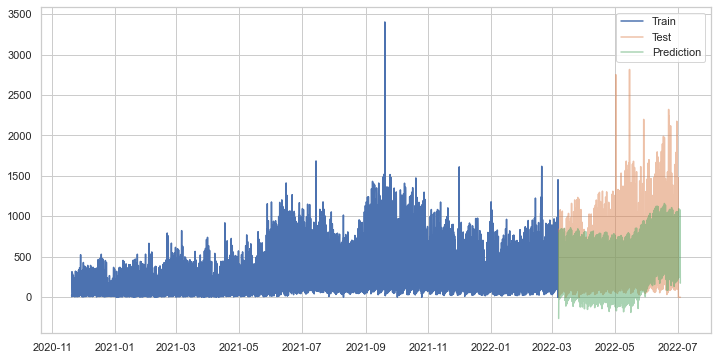

In [60]:
#Plot the train and test data on top the forecast
plt.plot(data_train.set_index('ds')['y'], label='Train')
plt.plot(data_test.set_index('ds')['y'], label='Test',alpha=0.5)
plt.plot(forecast.set_index('ds')['yhat'], label='Prediction',alpha=0.5)
plt.legend()

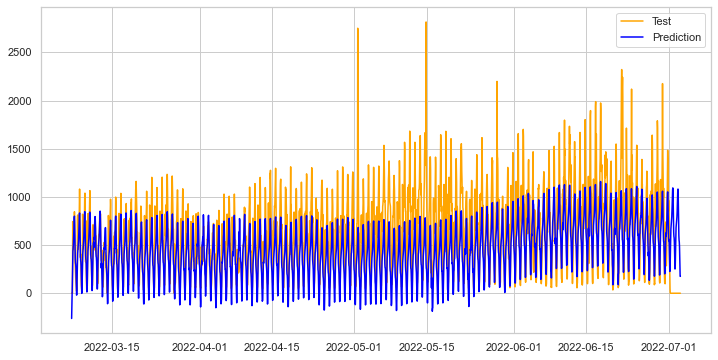

In [61]:
#Plot data test and prediction
fig, ax = plt.subplots()
plt.plot(data_test.set_index('ds')['y'], label='Test',color='orange')
plt.plot(forecast.set_index('ds')['yhat'], label='Prediction',color='blue')
plt.legend()

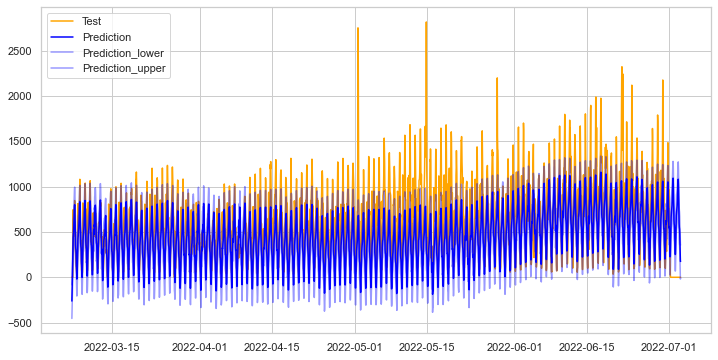

In [62]:
#Plot data test and prediction
fig, ax = plt.subplots()
plt.plot(data_test.set_index('ds')['y'], label='Test',color='orange')
plt.plot(forecast.set_index('ds')['yhat'], label='Prediction',color='blue')
lower=plt.plot(forecast.set_index('ds')['yhat_lower'], label='Prediction_lower',alpha=0.4,color='blue')
upper=plt.plot(forecast.set_index('ds')['yhat_upper'], label='Prediction_upper',alpha=0.4,color='blue')
plt.legend()

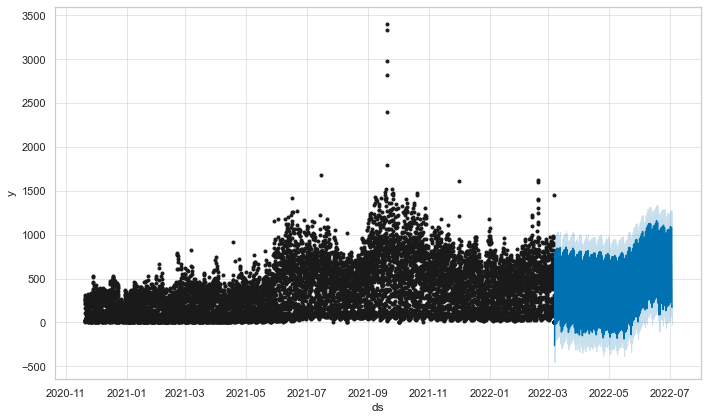

In [63]:
fig1 = m.plot(forecast)

In [64]:
from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(m, forecast)

In [65]:
plot_components_plotly(m, forecast)

In [66]:
# Cross validation
#Train on the first 200 days, aply to next 5 days and loop each 5 days to reach final data
from prophet.diagnostics import cross_validation

df_cv = cross_validation(m, initial='200 days', period='5 days', horizon = '20 days', parallel="processes")

INFO:prophet:Making 51 forecasts with cutoffs between 2021-06-10 04:00:00 and 2022-02-15 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc6c5ac7580>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -100.845
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -109.591
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -103.77
Initial log joint probability = -115.636
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -93.1296
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -71.2265
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -77.708
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -77.1017
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      49       10172.4    0.00467015       8436.18   1.035e-06       0.001      103  LS failed, Hessian reset 
      51       11139.8    0.00193696       5449.69   3.512e-07       0.001      115  LS failed, Hessian reset 
      99       10238.7   3.44201e-06       5118.75           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       11258.3   7.80915e-06       4980.34      0.6421      0.6421      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       11040.2

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     109         11162   8.07218e-05       4924.15   1.533e-08       0.001      224  LS failed, Hessian reset 
      99         12419   6.10827e-06       4940.72           1           1      176   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       11043.7   5.30836e-06       5396.57           1           1      249   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     148       11162.2   8.67334e-09       4792.82      0.4949      0.4949      267   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     199       11046.9   2.34353e-06       3418.87      0.4655      0.4655      251   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     191       11446.4   1.50058e-06        4334.7   3.672e-10       0.001      270  LS failed, Hessian reset 
     165       12419.2   1.77433e-08       5058.52       1.429      0.1429      259   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       11446.4    5.8075e-07       4651.01       0.342           1      281   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     251       11043.7   8.37867e-08        5102.7   1.752e-11       0.001      351  LS failed, Hessian reset 
     257       11043.7   5.75343e-09        4600.3      0.6142      0.6142      357   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     230       11446.5   8.58974e-09       5696.75      0.4847      0.4847      317   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     256       11047.2   6.16684e-06       3537.53   1.248e-09       0.001      365  LS failed, Hessian reset 
     277       11047.2   5.05911e-09       4516.43       0.108       0.108      392   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -92.2043
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.3723
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.6875
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       12626.2   0.000774253       4679.98           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -109.815
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       12827.1   5.03238e-06       4648.97      0.3039      0.3039      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       13013.3   1.11559e-06       4990.13      0.6381      0.6381      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -119.1
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     145       12827.5   9.74679e-09       5060.92      0.4036      0.4036      178   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -95.173
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -117.672
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116       13014.2   0.000165166       5497.77   3.177e-08       0.001      180  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       13269.1   5.14412e-06       5015.38      0.6234      0.6234      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     174       12632.8   3.44952e-05       4927.47   7.549e-09       0.001      250  LS failed, Hessian reset 
     199       12633.2   4.50662e-06       5033.91           1           1      280   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       13537.5    0.00043225       4904.17           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     191       13015.1   7.99461e-09       4394.87      0.3575      0.3575      275   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      99       13763.7    1.2892e-06       4723.84      0.3371           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       13272.4   1.10164e-07       4866.09           1           1      243   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       13763.7   9.86365e-09       4974.37      0.4499      0.4499      150   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     103       13538.2   6.68831e-05       5000.36   1.287e-08       0.001      174  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     299       12634.4   4.10847e-05       4222.88           1           1      397   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     124       14015.2   3.71545e-05       5131.82   7.301e-09       0.001      189  LS failed, Hessian reset 
     208       13272.5   6.42954e-06       5494.33   1.445e-09       0.001      293  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     162       13538.9   4.56364e-09       4478.32      0.3244      0.3244      246   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     241       13272.5   5.22567e-09       4769.51      0.6655      0.6655      332   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     174       14016.2    4.3828e-09       4312.54     0.06423           1      251   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     359       12634.7   7.62751e-09       3796.16      0.2265      0.2265      472   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -123.479
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       14274.7   8.31678e-07       4716.63      0.9077      0.9077      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     124       14274.7   7.49424e-09       5121.74      0.3497      0.3497      159   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -88.4744
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -122.387
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -139.636
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -164.163
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -90.0466
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -44.5025
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.531
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      98       14536.7    0.00303344       8901.99   4.635e-07       0.001      159  LS failed, Hessian reset 
      99       14542.6    0.00110174        4885.7           1           1      160   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       14803.8   0.000251367       5003.23           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       15177.6   5.15845e-05       4928.45           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      90       15011.1   0.000250431       4855.14   5.157e-08       0.001      155  LS

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     214         14552   8.47945e-09       4711.43      0.2572      0.2572      348   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     187       15190.6   8.86347e-09       4439.14      0.6362      0.6362      231   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     145         20335   0.000259786       3732.14   5.976e-08       0.001      216  LS failed, Hessian reset 
     155       15349.7   9.33588e-09       4693.35      0.5133      0.5133      236   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -34.5709
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       20078.1   0.000725589          5145           1           1      245   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     184       20336.4   1.45038e-05       3286.21   3.556e-09       0.001      304  LS failed, Hessian reset 
     199       20336.4   2.14758e-06       3372.83           1           1      324   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     231       20081.2   5.05517e-05       4769.31   9.983e-09       0.001      316  LS failed, Hessian reset 
     233       20336.4   8.40947e-09       3737.29      0.3806      0.3806      371   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       20515.4   1.87421e-05       2896.08      0.2246           1      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     277       20081.4   1.15542e-08        3718.8      0.3689           1      373   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     178       20534.9   0.000287306       4463.03   8.514e-08       0.001      266  LS failed, Hessian reset 
     199         20537   2.62646e-05       3860.62      0.3642           1      293   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       20538.6   7.36979e-05       3933.33           1           1      433   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     329       20539.6   4.43099e-05       3880.78   1.189e-08       0.001      497  LS failed, Hessian reset 
     399         20540    2.1868e-06       4858.04           1           1      584   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     406         20540   1.02165e-06       4379.15   2.153e-10       0.001      635  LS failed, Hessian reset 
     423         20540   7.69656e-09       4336.63      0.4069      0.4069      659   
Optimization terminated normally: 
  Conver

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -46.449
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -57.5973
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -59.236
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -39.5325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -58.5572
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       21090.3    0.00322398       4151.33           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      74       20803.8    0.00057518       5198.71   1.347e-07       0.001      132  LS failed, Hessian reset 
      99       21398.8    0.00113247       5065.31      0.3326           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     102       21091.5   0.000236671       3618.58    5.64e-08       0.001      161  LS failed, Hessian reset 
      99       20807.3   0.000350527       4010.84           1           1      165   
    Iter      log prob        ||dx||      ||grad||       alpha     

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -62.0969
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -50.1732
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     143       21409.3    0.00130272       3629.99   3.169e-07       0.001      223  LS failed, Hessian reset 
     143       21682.8   0.000403568       4063.41    8.22e-08       0.001      220  LS failed, Hessian reset 
     199       20832.7    0.00472828       3978.59      0.9169      0.9169      281   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     175       21104.2   2.18662e-06       3265.03    4.84e-10       0.001      298  LS failed, Hessian reset 
     199       22011.9   0.000122828        3783.2           1           1      258   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       21104.2   3.82849e-08       

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     179       21412.8   1.00087e-05       3651.77   2.505e-09       0.001      314  LS failed, Hessian reset 
      99       22229.7   0.000981278       6588.62      0.6907      0.6907      140   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199         21684   5.68218e-05       4725.67      0.6435      0.6435      294   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       22537.4   0.000202136       4096.01           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       21412.8   4.22614e-06       3851.35           1           1      339   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     231       20834.9   1.76924e-05       4378.23   4.524e-09       0.001      378  LS failed, Hessian reset 
     228       21412.8   2.21557e-08       3932.97      0.2214           1      378   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     259       22012.2   3.40895e-08        3723.7      0.2621           1      346   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     269       21684.9   8.11518e-09       4436.18      0.2197      0.2197      384   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     299       20840.8   1.52896e-05       3950.26      0.5877      0.5877      462   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       22569.6    0.00138214        4053.1      0.6324      0.6324      250   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     189       22275.9   0.000220529       4744.67   3.634e-08       0.001      292  LS failed, Hessian reset 
     305       20840.9   2.06487e-05       3960.05    5.77e-09       0.001      512  LS failed, Hessian reset 
     199       22277.1   6.09364e-05       4541.48           1           1      305   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     337         20841   5.90873e-09       4001.43     0.05319     0.05319      558   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     276       22277.3   2.82161e-08       4390.37      0.2233           1      398   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     259       22580.4   0.000250697       3839.06   4.819e-08       0.001      381  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.732
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         22582   1.77256e-05       4430.21           1           1      435   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       22586.9   1.21853e-06       5361.48      0.3904           1      545   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         22841   0.000574779        4014.3           1           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     414       22586.9   4.46944e-06       5351.48   9.154e-10       0.001      600  LS failed, Hessian reset 
     435       22586.9   9.06259e-09       4690.04      0.2898      0.2898      630   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     163         22856    0.00020028        4974.4   3.877e-08       0.001      255  LS failed, Hessian reset 
     199         22857   3.95582e-06        3915.4      0.8342      0.8342      304   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     285       22869.1    7.3368e-09        3792.8     0.06908     0.06908      406   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -67.7376
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -72.5363
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -54.6275
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -71.5954
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23140.4     0.0045727       6285.73           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       23425.2   0.000614947       4802.02           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         23694    0.00012556        4063.5      0.6786      0.6786      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -74.6615
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     146       23156.6   7.14379e-05       4265.99   1.748e-08       0.001      212  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -61.5837
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       23940.3   0.000633696       3270.56       0.381           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       23157.1   8.65223e-06       3948.74        0.63        0.63      278   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     138       23696.1   0.000153414       5128.99   2.837e-08       0.001      216  LS failed, Hessian reset 
     199       23441.9   3.78887e-05       3770.72      0.8178      0.8178      254   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24204.6    0.00451462       5382.84           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24522.1   0.000505223    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     190       23696.6   3.09317e-07       5328.24   5.936e-11       0.001      333  LS failed, Hessian reset 
     197       23696.6   5.82115e-09       4159.46      0.1899      0.1899      342   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     288       23447.5   1.43727e-08       4403.79       0.179           1      366   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       24224.3   0.000472558       3979.18      0.2511      0.8411      251   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -72.5592


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       23955.8     6.691e-07       4896.35           1           1      375   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     175       24534.1   2.89506e-05       3968.47   7.574e-09       0.001      271  LS failed, Hessian reset 
     199       24534.2   1.62182e-06       3597.59      0.5376      0.5376      303   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     321       23955.9   4.29509e-06       4695.14   8.131e-10       0.001      453  LS failed, Hessian reset 
     221       24534.4   6.30291e-06       4072.66   1.728e-09       0.001      362  LS failed, Hessian reset 
     336       23955.9    5.4058e-09       4714.81     0.09018     0.09018      473   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     240       24534.4   5.19892e-09       3893.23    0.004427      0.9546      390   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     291       24226.1   4.62931e-06       3521.51   9.323e-10       0.001      410  LS failed, Hessian reset 
Initial log joint probability = -79.2346
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       24857.2     0.0013639          3454      0.8012      0.8012      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       24226.1   3.29093e-07        3676.2     0.06853           1      422   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     312       24226.1   2.86936e-08       3472.52      0.8266      0.8266      439   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     199       24864.1   5.15197e-06       3653.69       0.801       0.801      254   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       25177.4   0.000115392       3647.96      0.9982      0.9982      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     225       24866.3   0.000196446       4568.41   4.838e-08       0.001      320  LS failed, Hessian reset 
     199       25203.9   4.22495e-05       4330.27           1           1      255   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     266       24867.7   1.41561e-06       3835.16   3.371e-10       0.001      411  LS failed, Hessian reset 
     280       24867.7   1.31546e-08       3724.31      0.2595      0.2595      430   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     291         25207   3.47773e-08       3882.06      0.6617      0.6617      369   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -78.3618
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -37.746
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.1
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       25450.3   3.79385e-05       3690.58     0.06646           1      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       25702.3    0.00119502       3730.66      0.8363      0.8363      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       26020.9   0.000149998       3774.43       0.265       0.265      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -84.8564
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -66.9524
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       25473.2   2.02576e-06       3942.41      0.5031      0.5031      251   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -82.0906
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       25714.7   0.000281998       3774.15           1           1      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     227       25473.2   3.74223e-08       4008.29           1           1      287   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     199       26040.2   0.000276616       3543.42     0.03357      0.1506      258   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       26339.7   0.000972272       4780.56           1           1      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     200       26040.2   4.64569e-05       4008.02   1.311e-08       0.001      299  LS failed, Hessian reset 
      99       26683.2   0.000617278       4057.01           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       25722.2   0.000679357       3567.42           1           1      363   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       27012.2   0.000188982       4131.07      0.1717      0.1717      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     315       26043.6   8.48584e-09       3807.32      0.1902      0.1902      484   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     383       25723.1   1.70487e-05       3915.33   3.846e-09       0.001      513  LS failed, Hessian reset 
Initial log joint probability = -86.5194
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       26693.3   0.000137518       3993.63   3.722e-08       0.001      317  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       25723.2   1.25522e-06       4046.19      0.6012      0.6012      532   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     236       26363.2   7.57437e-06       3897.06    1.71e-09       0.001      348  LS failed, Hessian reset 
     199       27023.7   4.61678e-05       4163.04   9.864e-09       0.001      285  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     224       27023.8   3.51533e-08       3603.15       0.478           1      317   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     262       26363.2    3.3535e-09       3759.66      0.1038      0.1038      386   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     444       25723.2   9.23961e-09       4114.42      0.3414      0.3414      588   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -86.9422
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     299       26694.3   1.35603e-08       3656.79       0.267           1      421   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       27352.7   0.000205968       3413.04      0.4505      0.4505      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       27664.6   0.000552725       4993.09           1           1      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       27356.4   2.23222e-05       4192.12       0.468       0.468      256   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       27684.8   8.94596e-08       3958.65      0.3133           1      261   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     206       27684.8   1.58067e-08        3871.3      0.3158           1      271   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -69.6364
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       27358.8   6.66831e-05       4068.75      0.7267      0.7267      374   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     348         27359   5.80595e-09       4180.02      0.1345      0.3964      435   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       28023.8   0.000319257       4149.02      0.8568      0.8568      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       28032.2   8.45333e-06       3591.26           1           1      246   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -87.4845
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -87.3019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     260       28032.6   8.77515e-09       3592.37      0.1456      0.4819      321   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       28329.3   0.000734872       3685.27      0.2536           1      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       28627.8   0.000100664       3478.69      0.4341           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     189       28333.5   5.99239e-05       4440.58   1.281e-08       0.001      292  LS failed, Hessian reset 
     199       28633.3   1.18376e-05       3549.67        0.59        0.59      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       28333.7   2.20595e-06       3967.34      0.4093      0.4093      303   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     242       28633.3   1.07884e-05       4022.86   2.636e-09       0.001      331  LS failed, Hessian reset 
     265       28633.3   6.37547e-09       3689.57      0.2003

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     368       28341.1   3.74512e-08       3275.33           1           1      520   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

In [67]:
df_cv.head()

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2021-06-10 05:00:00,214.646089,105.090496,324.943518,39,2021-06-10 04:00:00
1,2021-06-10 06:00:00,280.300183,170.392383,397.358746,61,2021-06-10 04:00:00
2,2021-06-10 07:00:00,369.935920,266.018075,481.061547,194,2021-06-10 04:00:00
3,2021-06-10 08:00:00,454.823832,346.537316,561.527133,518,2021-06-10 04:00:00
4,2021-06-10 09:00:00,513.573898,398.068282,624.842862,620,2021-06-10 04:00:00


In [68]:
from prophet.diagnostics import performance_metrics
df_p = performance_metrics(df_cv)
df_p.head()

INFO:prophet:Skipping MAPE because y close to 0


,horizon,mse,rmse,mae,mdape,smape,coverage
0,2 days 00:00:00,39752.737218,199.380885,137.219626,0.262781,0.433411,0.691176
1,2 days 01:00:00,39701.026326,199.251164,137.127172,0.262715,0.432979,0.692810
2,2 days 02:00:00,39644.526546,199.109333,136.973669,0.262537,0.432576,0.693627
3,2 days 03:00:00,39616.140893,199.038039,137.027117,0.262932,0.433014,0.693627
4,2 days 04:00:00,39694.783560,199.235498,137.418331,0.264192,0.434166,0.693219


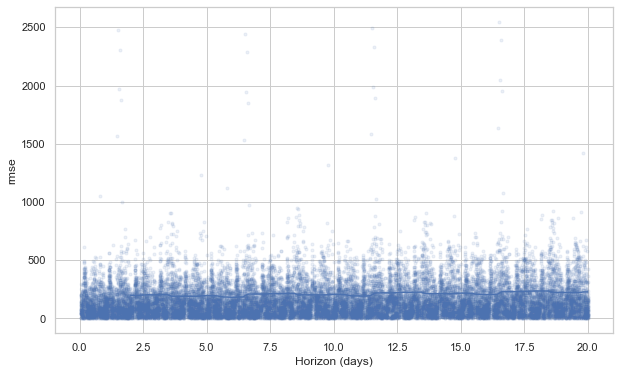

In [69]:
from prophet.plot import plot_cross_validation_metric

fig = plot_cross_validation_metric(df_cv, metric='rmse')

In [70]:
#calculate Root Mean Square  Error(RMSE)
from math import sqrt
from sklearn.metrics import mean_squared_error

rms = sqrt(mean_squared_error(data_test['y'],forecast['yhat']))

print('The root mean square error score for the model is: ', rms)

The root mean square error score for the model is:  335.3009154093465
